<a href="https://colab.research.google.com/github/katetowsen26/Uncertainty-Aware_XAI_to_Predict_CardiacEvents_after_TKA_THA/blob/main/hip.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
pip install optuna

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: optuna in c:\users\sam-tech\appdata\local\programs\python\python312\lib\site-packages (4.6.0)




[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
pip install lime

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, roc_auc_score, recall_score,f1_score, precision_recall_curve, roc_curve, auc
import numpy as np
import xgboost as xgb
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight
import shap
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import seaborn as sns
import optuna
from sklearn.base import BaseEstimator, ClassifierMixin
import numpy as np
from sklearn.model_selection import ShuffleSplit
from scipy import stats
from lime.lime_tabular import LimeTabularExplainer
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_predict

# Cardiac Arrest Dataset

In [5]:
df_hip_cleaned = pd.read_csv(r"C:\Users\SAM-Tech\Downloads\undersampled_CDARREST_Hip_21_22_23(2).csv")

In [6]:
df_hip_cleaned = df_hip_cleaned.drop(columns=["REINTUB", "FAILWEAN", "PULEMBOL", "OUPNEUMO", "OTHDVT"])

In [7]:
df_hip_cleaned.head()

,SEX,RACE_NEW,INOUT,Age,ASACLAS,CPT,ANESTHES,SMOKE,HXCOPD,HXCHF,...,PRSODM,PRCREAT,PRWBC,PRHCT,PRPTT,CDARREST,CDMI,DIABETES,BMI,Year
0,0,6,1,1,2.0,3,2.0,1,0,0,...,142.0,0.72,8.1,42.0,29.7,0,0,0,28.83,2022
1,0,1,0,3,3.0,3,1.0,0,0,0,...,140.0,0.90,6.4,42.1,29.7,0,0,0,36.39,2022
2,1,1,0,2,3.0,3,3.0,0,0,1,...,143.0,0.80,6.4,50.8,43.0,0,0,0,35.53,2021
3,0,6,1,4,3.0,3,2.0,0,0,0,...,143.0,0.59,6.6,40.0,29.0,0,0,0,31.44,2021
4,0,1,1,3,2.0,3,1.0,0,0,0,...,140.0,0.66,4.9,38.8,32.0,0,0,0,24.37,2021


# CDMI Dataset

In [8]:
df1_hip_cleaned = pd.read_csv(r"C:\Users\SAM-Tech\Downloads\undersampled_CDMI_Hip_21_22_23(2).csv")

In [9]:
df1_hip_cleaned = df1_hip_cleaned.drop(columns=["REINTUB", "FAILWEAN", "OUPNEUMO", "OTHDVT", "PULEMBOL"])

In [10]:
df1_hip_cleaned.head()

,SEX,RACE_NEW,INOUT,Age,ASACLAS,CPT,ANESTHES,SMOKE,HXCOPD,HXCHF,...,PRSODM,PRCREAT,PRWBC,PRHCT,PRPTT,CDARREST,CDMI,DIABETES,BMI,Year
0,0,1,1,4,3.0,3,3.0,0,0,0,...,139.0,1.31,11.6,38.3,29.7,0,0,0,26.92,2022
1,0,1,0,1,2.0,3,1.0,0,0,0,...,139.0,0.86,5.9,40.7,29.0,0,0,0,21.92,2021
2,1,1,1,3,3.0,3,3.0,0,0,0,...,144.0,0.87,10.2,29.6,29.3,0,0,0,26.61,2023
3,1,1,0,2,3.0,3,1.0,0,0,0,...,142.0,0.82,6.8,44.5,30.0,0,0,0,39.58,2023
4,0,6,0,3,2.0,3,1.0,0,0,0,...,143.0,0.86,6.6,42.0,23.0,0,0,0,29.29,2022


# Random Forest

## Cardiac Arrest

[I 2025-12-04 18:28:03,066] A new study created in memory with name: no-name-1f0e9b7e-2d70-4eb4-abe1-6cf83c058e10
[I 2025-12-04 18:28:03,728] Trial 0 finished with value: 0.8315268756661103 and parameters: {'n_estimators': 59, 'max_depth': 12, 'min_samples_split': 12, 'min_samples_leaf': 2, 'max_features': None}. Best is trial 0 with value: 0.8315268756661103.
[I 2025-12-04 18:28:04,114] Trial 1 finished with value: 0.8422198314866576 and parameters: {'n_estimators': 83, 'max_depth': 14, 'min_samples_split': 4, 'min_samples_leaf': 14, 'max_features': 'log2'}. Best is trial 1 with value: 0.8422198314866576.
[I 2025-12-04 18:28:04,824] Trial 2 finished with value: 0.8434464799211727 and parameters: {'n_estimators': 159, 'max_depth': 11, 'min_samples_split': 16, 'min_samples_leaf': 12, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8434464799211727.
[I 2025-12-04 18:28:05,713] Trial 3 finished with value: 0.847000744032657 and parameters: {'n_estimators': 193, 'max_depth': 7, 'min

Best hyperparameters:  {'n_estimators': 119, 'max_depth': 6, 'min_samples_split': 19, 'min_samples_leaf': 5, 'max_features': 'sqrt'}


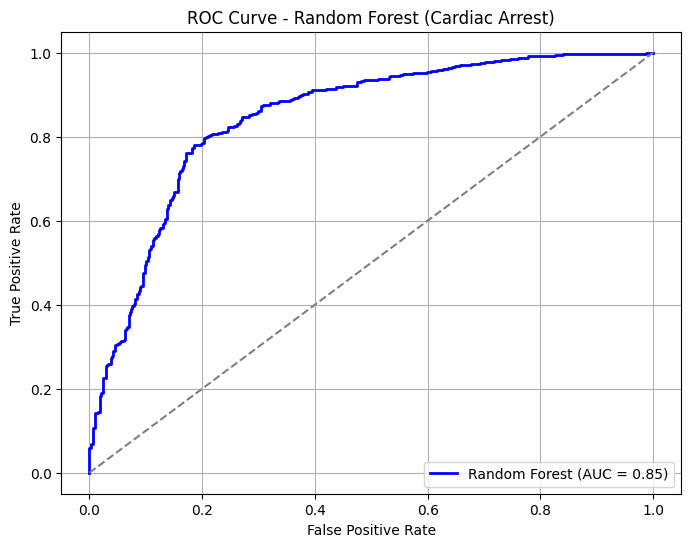

Random Forest Metrics for Cardiac Arrest: 
AUC Score: 0.8476
Accuracy: 0.7870
F1 Score: 0.7921
Recall: 0.8117
Precision: 0.7735


In [ ]:
X_RF_CA = df_hip_cleaned.drop(columns=['CDARREST', 'CDMI'])
y_RF_CA = df_hip_cleaned['CDARREST']

def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 200)
    max_depth = trial.suggest_int('max_depth', 3, 20)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])

    rf_classifier_CA = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        class_weight='balanced',
        random_state=42
)

    kf_RF_CA = KFold(n_splits=5, shuffle=True, random_state=42)
    y_pred_prob_RF_CA = cross_val_predict(rf_classifier_CA, X_RF_CA, y_RF_CA, cv=kf_RF_CA, method="predict_proba")[:, 1]

    fpr_RF_CA, tpr_RF_CA, _ = roc_curve(y_RF_CA, y_pred_prob_RF_CA)
    roc_auc_RF_CA = auc(fpr_RF_CA, tpr_RF_CA)

    return roc_auc_RF_CA

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print('Best hyperparameters: ', study.best_params)

best_params = study.best_params
rf_classifier_CA = RandomForestClassifier(**best_params, random_state=42)

kf_RF_CA = KFold(n_splits=5, shuffle=True, random_state=42)
y_pred_prob_RF_CA = cross_val_predict(rf_classifier_CA, X_RF_CA, y_RF_CA, cv=kf_RF_CA, method="predict_proba")[:, 1]
y_pred_RF_CA = cross_val_predict(rf_classifier_CA, X_RF_CA, y_RF_CA, cv=kf_RF_CA, method="predict")

fpr_RF_CA, tpr_RF_CA, _ = roc_curve(y_RF_CA, y_pred_prob_RF_CA)
roc_auc_RF_CA = auc(fpr_RF_CA, tpr_RF_CA)

accuracy_RF_CA = accuracy_score(y_RF_CA, y_pred_RF_CA)
f1_RF_CA = f1_score(y_RF_CA, y_pred_RF_CA)
recall_RF_CA = recall_score(y_RF_CA, y_pred_RF_CA)
precision_RF_CA = precision_score(y_RF_CA, y_pred_RF_CA)

plt.figure(figsize=(8, 6))
plt.plot(fpr_RF_CA, tpr_RF_CA, color='blue', lw=2, label=f'Random Forest (AUC = {roc_auc_RF_CA:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest (Cardiac Arrest)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

print(f'Random Forest Metrics for Cardiac Arrest: ')
print(f'AUC Score: {roc_auc_RF_CA:.4f}')
print(f'Accuracy: {accuracy_RF_CA:.4f}')
print(f'F1 Score: {f1_RF_CA:.4f}')
print(f'Recall: {recall_RF_CA:.4f}')
print(f'Precision: {precision_RF_CA:.4f}')

In [12]:
rf_classifier_CA.fit(X_RF_CA, y_RF_CA)

RandomForestClassifier(max_depth=6, min_samples_leaf=5, min_samples_split=19,
                       n_estimators=119, random_state=42)

<Figure size 1800x600 with 0 Axes>

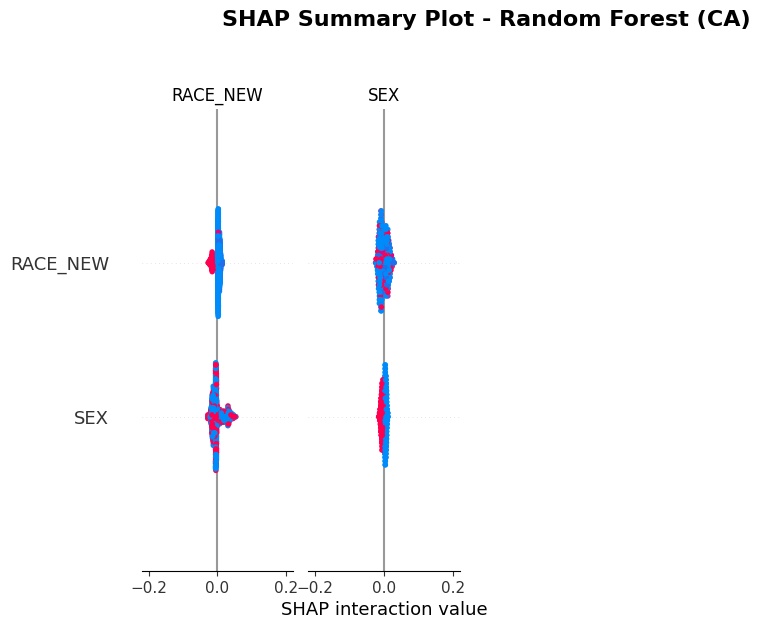

In [ ]:
explainer_RF_CA = shap.TreeExplainer(rf_classifier_CA)
shap_values_RF_CA = explainer_RF_CA.shap_values(X_RF_CA)

feature_names = X_RF_CA.columns

plt.figure(figsize=(18, 6))
shap.summary_plot(shap_values_RF_CA, X_RF_CA, feature_names=feature_names, plot_size=(2, 0.5), show=False)

plt.suptitle("SHAP Summary Plot - Random Forest (CA)", fontsize=16, fontweight="bold", y=1.05)
plt.subplots_adjust(top=0.90, right=1.2, bottom=0.2, left=0.2)
plt.show()

c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys wil

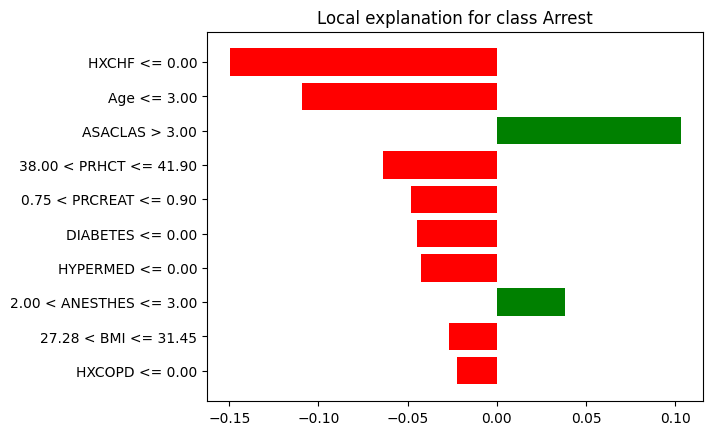

In [ ]:
lime_explainer_RF_CA = LimeTabularExplainer(
    training_data=X_RF_CA.values,
    feature_names=X_RF_CA.columns.tolist(),
    class_names=['No Arrest', 'Arrest'],
    mode='classification'
)

idx_RF_CA = np.random.randint(0, X_RF_CA.shape[0])
lime_exp_RF_CA = lime_explainer_RF_CA.explain_instance(
    X_RF_CA.iloc[idx_RF_CA],
    rf_classifier_CA.predict_proba
)


lime_exp_RF_CA.show_in_notebook()

fig = lime_exp_RF_CA.as_pyplot_figure()
plt.show()

## CDMI

[I 2025-12-04 18:28:36,006] A new study created in memory with name: no-name-073a965a-7249-46a5-b4d0-e20d2b2daaa0
[I 2025-12-04 18:28:37,198] Trial 0 finished with value: 0.8184661158141375 and parameters: {'n_estimators': 59, 'max_depth': 19, 'min_samples_split': 11, 'min_samples_leaf': 15, 'max_features': None}. Best is trial 0 with value: 0.8184661158141375.
[I 2025-12-04 18:28:39,785] Trial 1 finished with value: 0.8207100578681523 and parameters: {'n_estimators': 127, 'max_depth': 15, 'min_samples_split': 18, 'min_samples_leaf': 15, 'max_features': None}. Best is trial 1 with value: 0.8207100578681523.
[I 2025-12-04 18:28:40,853] Trial 2 finished with value: 0.8308445108228351 and parameters: {'n_estimators': 143, 'max_depth': 8, 'min_samples_split': 18, 'min_samples_leaf': 11, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.8308445108228351.
[I 2025-12-04 18:28:41,600] Trial 3 finished with value: 0.8298826115784766 and parameters: {'n_estimators': 105, 'max_depth': 11, 'm

Best hyperparameters:  {'n_estimators': 139, 'max_depth': 9, 'min_samples_split': 19, 'min_samples_leaf': 10, 'max_features': 'sqrt'}


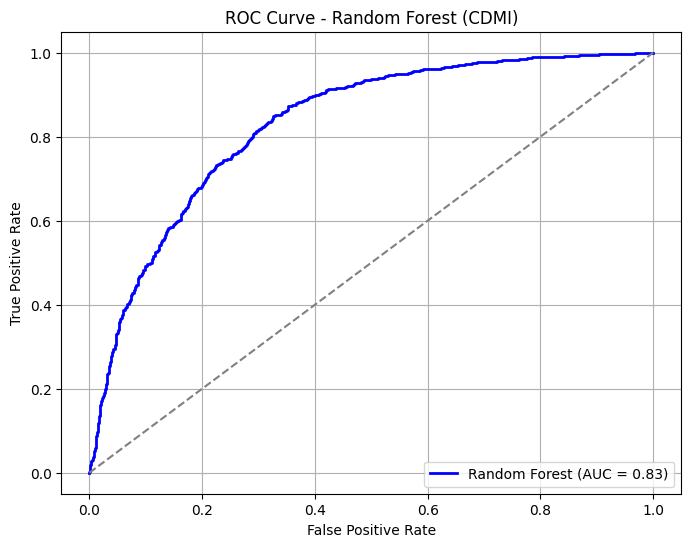

Random Forest Metrics for CDMI: 
AUC Score: 0.8312
Accuracy: 0.7584
F1 Score: 0.7702
Recall: 0.8098
Precision: 0.7343


In [ ]:
X_RF_CDMI = df1_hip_cleaned.drop(columns=['CDARREST', 'CDMI'])
y_RF_CDMI = df1_hip_cleaned['CDMI']

def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 200)
    max_depth = trial.suggest_int('max_depth', 3, 20)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])

    rf_classifier_CDMI = RandomForestClassifier(
      n_estimators=n_estimators,
      max_depth=max_depth,
      min_samples_split=min_samples_split,
      min_samples_leaf=min_samples_leaf,
      max_features=max_features,
      class_weight='balanced',
      random_state=42
  )

    kf_RF_CDMI = KFold(n_splits=5, shuffle=True, random_state=42)
    y_pred_prob_RF_CDMI = cross_val_predict(rf_classifier_CDMI, X_RF_CDMI, y_RF_CDMI, cv=kf_RF_CDMI, method="predict_proba")[:, 1]

    fpr_RF_CDMI, tpr_RF_CDMI, _ = roc_curve(y_RF_CDMI, y_pred_prob_RF_CDMI)
    roc_auc_RF_CDMI = auc(fpr_RF_CDMI, tpr_RF_CDMI)

    return roc_auc_RF_CDMI

# Create and optimize the study using Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Print the best hyperparameters found
print('Best hyperparameters: ', study.best_params)

# Use the best hyperparameters for the final Random Forest model
best_params = study.best_params
rf_classifier_CDMI = RandomForestClassifier(**best_params, random_state=42)

# Perform K-Fold cross-validation with the optimized model
kf_RF_CDMI = KFold(n_splits=5, shuffle=True, random_state=42)
y_pred_prob_RF_CDMI = cross_val_predict(rf_classifier_CDMI, X_RF_CDMI, y_RF_CDMI, cv=kf_RF_CDMI, method="predict_proba")[:, 1]
y_pred_RF_CDMI = cross_val_predict(rf_classifier_CDMI, X_RF_CDMI, y_RF_CDMI, cv=kf_RF_CDMI, method="predict")

fpr_RF_CDMI, tpr_RF_CDMI, _ = roc_curve(y_RF_CDMI, y_pred_prob_RF_CDMI)
roc_auc_RF_CDMI = auc(fpr_RF_CDMI, tpr_RF_CDMI)

accuracy_RF_CDMI = accuracy_score(y_RF_CDMI, y_pred_RF_CDMI)
f1_RF_CDMI = f1_score(y_RF_CDMI, y_pred_RF_CDMI)
recall_RF_CDMI = recall_score(y_RF_CDMI, y_pred_RF_CDMI)
precision_RF_CDMI = precision_score(y_RF_CDMI, y_pred_RF_CDMI)

plt.figure(figsize=(8, 6))
plt.plot(fpr_RF_CDMI, tpr_RF_CDMI, color='blue', lw=2, label=f'Random Forest (AUC = {roc_auc_RF_CDMI:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest (CDMI)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

print(f'Random Forest Metrics for CDMI: ')
print(f'AUC Score: {roc_auc_RF_CDMI:.4f}')
print(f'Accuracy: {accuracy_RF_CDMI:.4f}')
print(f'F1 Score: {f1_RF_CDMI:.4f}')
print(f'Recall: {recall_RF_CDMI:.4f}')
print(f'Precision: {precision_RF_CDMI:.4f}')

In [16]:
rf_classifier_CDMI.fit(X_RF_CDMI, y_RF_CDMI)

RandomForestClassifier(max_depth=9, min_samples_leaf=10, min_samples_split=19,
                       n_estimators=139, random_state=42)

<Figure size 1800x600 with 0 Axes>

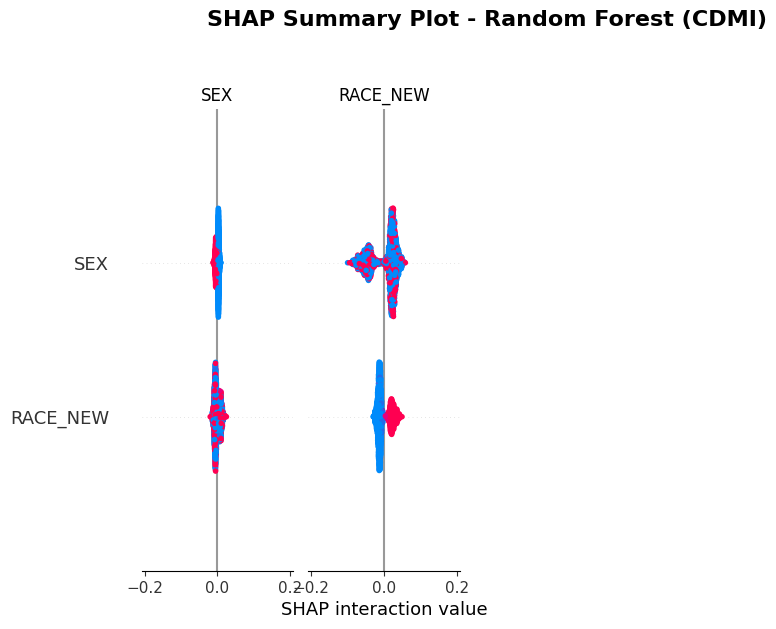

In [ ]:
explainer_RF_CDMI = shap.TreeExplainer(rf_classifier_CDMI)
shap_values_RF_CDMI = explainer_RF_CDMI.shap_values(X_RF_CDMI)


feature_names = X_RF_CDMI.columns

plt.figure(figsize=(18, 6))
shap.summary_plot(shap_values_RF_CDMI, X_RF_CDMI, feature_names=feature_names, plot_size=(2, 0.5), show=False)

plt.suptitle("SHAP Summary Plot - Random Forest (CDMI)", fontsize=16, fontweight="bold", y=1.05)

plt.subplots_adjust(top=0.90, right=1.2, bottom=0.2, left=0.2)

plt.show()

c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys wil

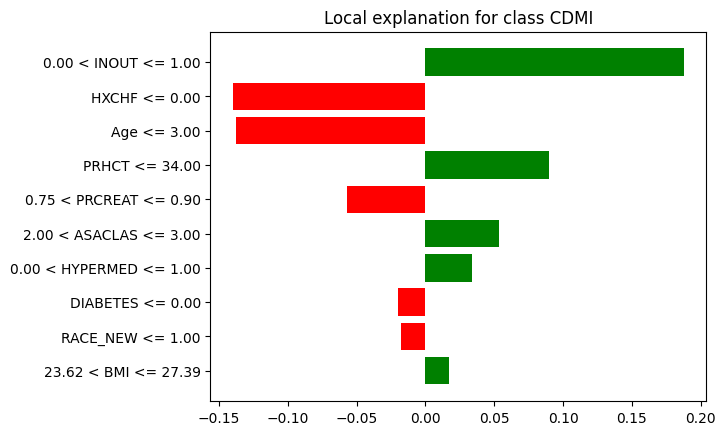

In [18]:
# Initialize LIME Explainer for CDMI
lime_explainer_RF_CDMI = LimeTabularExplainer(
    training_data=X_RF_CDMI.values,
    feature_names=X_RF_CDMI.columns.tolist(),
    class_names=['No CDMI', 'CDMI'],
    mode='classification'
)

# Randomly select an instance from the test data to explain
idx_RF_CDMI = np.random.randint(0, X_RF_CDMI.shape[0])
lime_exp_RF_CDMI = lime_explainer_RF_CDMI.explain_instance(
    X_RF_CDMI.iloc[idx_RF_CDMI],
    rf_classifier_CDMI.predict_proba
)


lime_exp_RF_CDMI.show_in_notebook()

fig = lime_exp_RF_CDMI.as_pyplot_figure()
plt.show()

## Combined

In [19]:
from sklearn.model_selection import cross_val_score, StratifiedKFold

[I 2025-12-04 18:29:43,120] A new study created in memory with name: no-name-7aa31f29-e591-4319-a94b-746334d7e2e3
[I 2025-12-04 18:29:43,468] Trial 0 finished with value: 0.8468147358684068 and parameters: {'n_estimators': 74, 'max_depth': 5, 'min_samples_split': 20, 'min_samples_leaf': 7, 'max_features': 'log2'}. Best is trial 0 with value: 0.8468147358684068.
[I 2025-12-04 18:29:43,948] Trial 1 finished with value: 0.8323211807999357 and parameters: {'n_estimators': 70, 'max_depth': 4, 'min_samples_split': 6, 'min_samples_leaf': 12, 'max_features': None}. Best is trial 0 with value: 0.8468147358684068.
[I 2025-12-04 18:29:44,251] Trial 2 finished with value: 0.8442608940457278 and parameters: {'n_estimators': 58, 'max_depth': 9, 'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.8468147358684068.
[I 2025-12-04 18:29:44,854] Trial 3 finished with value: 0.8464728830260009 and parameters: {'n_estimators': 128, 'max_depth': 12, 'min_sam

Best RF Hyperparameters: {'n_estimators': 83, 'max_depth': 5, 'min_samples_split': 11, 'min_samples_leaf': 10, 'max_features': 'log2'}
Combined Model Metrics:
Accuracy: 0.7846
F1 Score: 0.7973
Recall: 0.8475
Precision: 0.7528
AUC Score: 0.8585


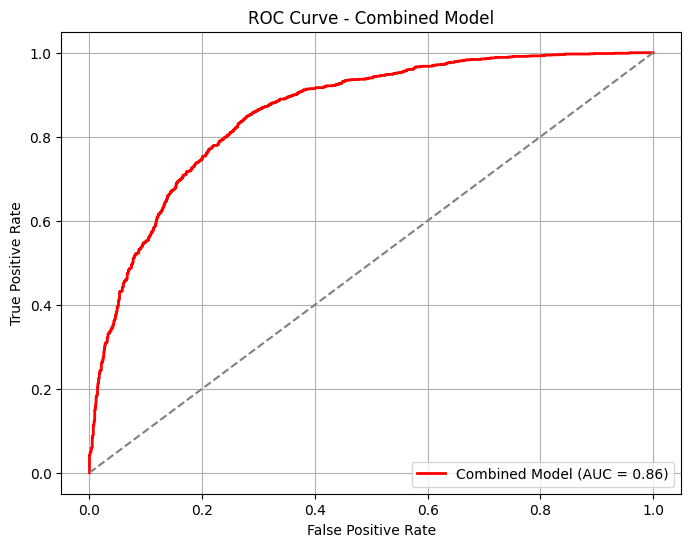

In [ ]:
X_RF_CA_resampled = df_hip_cleaned.drop(columns=['CDARREST', 'CDMI'])
y_RF_CA_resampled = df_hip_cleaned['CDARREST']

X_RF_CDMI_resampled = df1_hip_cleaned.drop(columns=['CDMI', 'CDARREST'])
y_RF_CDMI_resampled = df1_hip_cleaned['CDMI']

common_columns = X_RF_CA_resampled.columns.intersection(X_RF_CDMI_resampled.columns)

X_RF_Combined = np.concatenate((X_RF_CA_resampled[common_columns], X_RF_CDMI_resampled[common_columns]), axis=0)
y_RF_Combined = np.concatenate((y_RF_CA_resampled, y_RF_CDMI_resampled), axis=0)

X_RF_Combined_df = pd.DataFrame(X_RF_Combined, columns=common_columns)

def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 200)
    max_depth = trial.suggest_int('max_depth', 3, 20)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])

    rf_classifier_CA = RandomForestClassifier(
        n_estimators=n_estimators, max_depth=max_depth,
        min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf,
        max_features=max_features, class_weight='balanced', random_state=42
    )

    kf_RF_CA = KFold(n_splits=5, shuffle=True, random_state=42)
    y_pred_prob_RF_CA = cross_val_predict(rf_classifier_CA, X_RF_CA_resampled, y_RF_CA_resampled, cv=kf_RF_CA, method="predict_proba")[:, 1]

    fpr_RF_CA, tpr_RF_CA, _ = roc_curve(y_RF_CA_resampled, y_pred_prob_RF_CA)
    return auc(fpr_RF_CA, tpr_RF_CA)

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

best_params = study.best_params
print('Best RF Hyperparameters:', best_params)

rf_classifier_CA = RandomForestClassifier(**best_params, random_state=42)
rf_classifier_CDMI = RandomForestClassifier(**best_params, random_state=42)

voting_classifier_RF_Combined = VotingClassifier(
    estimators=[('rf_CA', rf_classifier_CA), ('rf_CDMI', rf_classifier_CDMI)],
    voting='soft'
)

voting_classifier_RF_Combined.fit(X_RF_Combined, y_RF_Combined)

y_pred_combined_labels = voting_classifier_RF_Combined.predict(X_RF_Combined)
y_pred_combined_prob = voting_classifier_RF_Combined.predict_proba(X_RF_Combined)[:, 1]

accuracy_combined = accuracy_score(y_RF_Combined, y_pred_combined_labels)
f1_combined = f1_score(y_RF_Combined, y_pred_combined_labels)
recall_combined = recall_score(y_RF_Combined, y_pred_combined_labels)
precision_combined = precision_score(y_RF_Combined, y_pred_combined_labels)

fpr_combined, tpr_combined, _ = roc_curve(y_RF_Combined, y_pred_combined_prob)
roc_auc_combined = auc(fpr_combined, tpr_combined)

print(f'Combined Model Metrics:')
print(f'Accuracy: {accuracy_combined:.4f}')
print(f'F1 Score: {f1_combined:.4f}')
print(f'Recall: {recall_combined:.4f}')
print(f'Precision: {precision_combined:.4f}')
print(f'AUC Score: {roc_auc_combined:.4f}')

plt.figure(figsize=(8, 6))
plt.plot(fpr_combined, tpr_combined, color='red', lw=2, label=f'Combined Model (AUC = {roc_auc_combined:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Combined Model')
plt.legend(loc='lower right')
plt.grid()
plt.show()

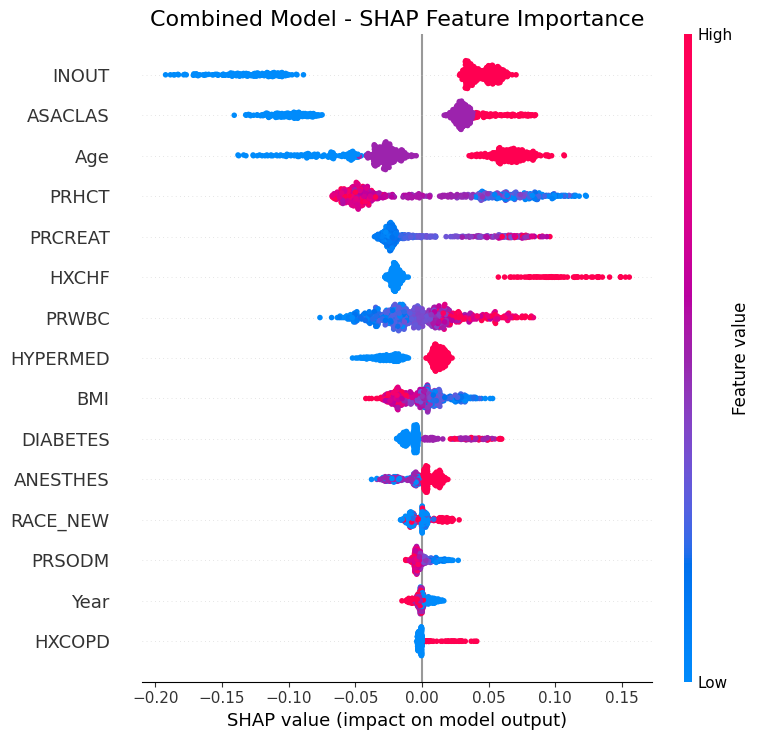

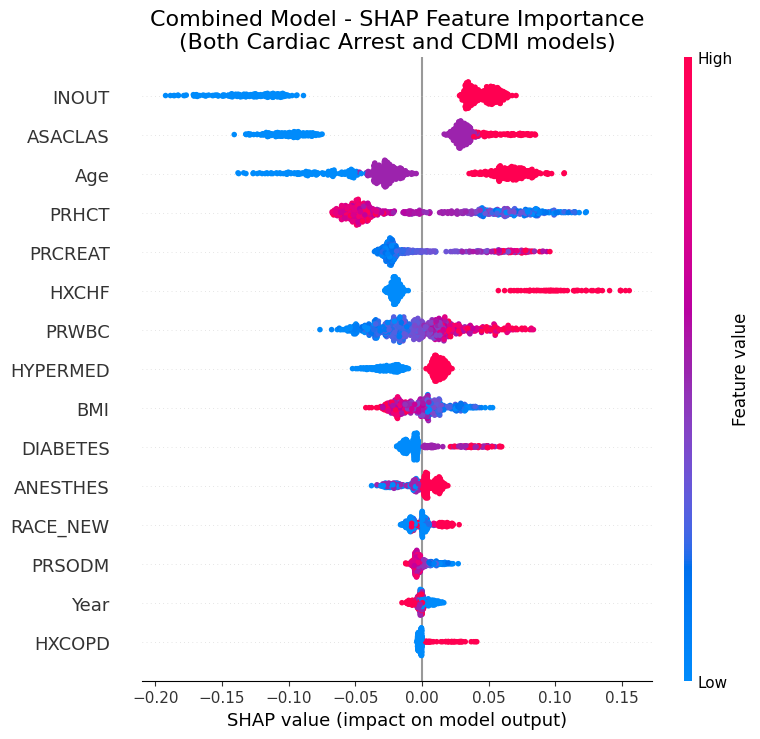

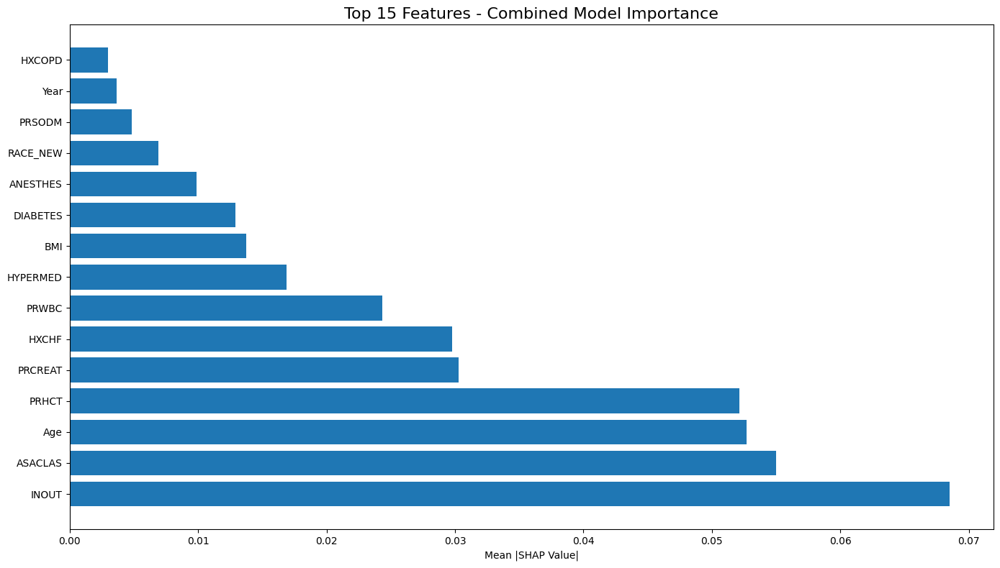

In [ ]:
# First, ensure your models are trained
rf_classifier_CA.fit(X_RF_CA_resampled, y_RF_CA_resampled)
rf_classifier_CDMI.fit(X_RF_CDMI_resampled, y_RF_CDMI_resampled)

sample_size_CA = min(300, len(X_RF_CA_resampled))
sample_size_CDMI = min(300, len(X_RF_CDMI_resampled))

np.random.seed(42)
CA_indices = np.random.choice(len(X_RF_CA_resampled), sample_size_CA, replace=False)
CDMI_indices = np.random.choice(len(X_RF_CDMI_resampled), sample_size_CDMI, replace=False)

X_CA_sample = X_RF_CA_resampled.iloc[CA_indices][common_columns]
X_CDMI_sample = X_RF_CDMI_resampled.iloc[CDMI_indices][common_columns]

explainer_CA = shap.TreeExplainer(rf_classifier_CA)
explainer_CDMI = shap.TreeExplainer(rf_classifier_CDMI)

shap_values_CA = explainer_CA.shap_values(X_CA_sample)
shap_values_CDMI = explainer_CDMI.shap_values(X_CDMI_sample)

if isinstance(shap_values_CA, list) and len(shap_values_CA) > 1:
    shap_values_CA = shap_values_CA[1]
    shap_values_CDMI = shap_values_CDMI[1]
elif isinstance(shap_values_CA, np.ndarray) and len(shap_values_CA.shape) == 3:
    shap_values_CA = shap_values_CA[:, :, 1]
    shap_values_CDMI = shap_values_CDMI[:, :, 1]

X_combined = pd.concat([X_CA_sample, X_CDMI_sample], axis=0)
shap_values_combined = np.vstack([shap_values_CA, shap_values_CDMI])

source_labels = np.concatenate([
    np.full(len(X_CA_sample), "Cardiac Arrest"),
    np.full(len(X_CDMI_sample), "CDMI")
])

X_combined_with_source = X_combined.copy()
X_combined_with_source['Source'] = source_labels

plt.figure(figsize=(14, 10))
shap.summary_plot(
    shap_values_combined,
    X_combined,
    plot_type="dot",
    max_display=15,  
    title="Combined SHAP Values Beeswarm Plot",
    show=False
)
plt.title("Combined Model - SHAP Feature Importance", fontsize=16)
plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 10))

shap.summary_plot(
    shap_values_combined,
    X_combined.values,
    feature_names=X_combined.columns,
    plot_type="dot",
    max_display=15,
    show=False
)
plt.title("Combined Model - SHAP Feature Importance\n(Both Cardiac Arrest and CDMI models)", fontsize=16)
plt.tight_layout()
plt.show()


plt.figure(figsize=(14, 8))
combined_importance = np.mean(np.abs(shap_values_combined), axis=0)
idx = np.argsort(combined_importance)
idx = idx[-15:]

plt.barh(X_combined.columns[idx], combined_importance[idx])
plt.title("Top 15 Features - Combined Model Importance", fontsize=16)
plt.xlabel("Mean |SHAP Value|")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

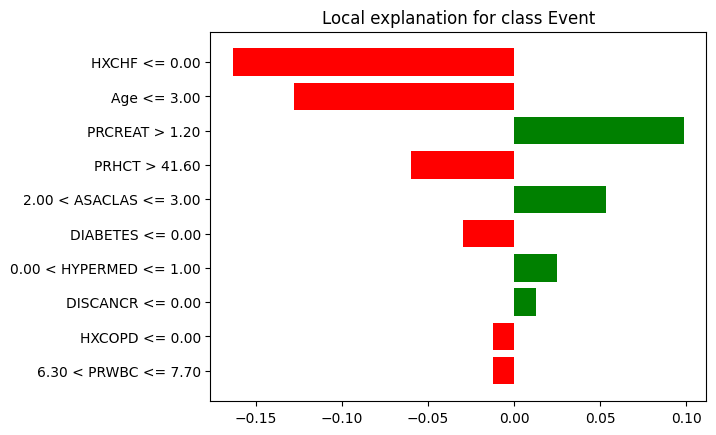

In [22]:
# LIME Explanation
explainer_LIME = LimeTabularExplainer(
    training_data=X_RF_Combined_df.values,
    training_labels=y_RF_Combined,
    mode="classification",
    feature_names=X_RF_Combined_df.columns,
    class_names=["No Event", "Event"],
    discretize_continuous=True
)

instance_to_explain_RF = X_RF_Combined_df.iloc[10]

def predict_combined(X):
    return voting_classifier_RF_Combined.predict_proba(X)

explanation_RF = explainer_LIME.explain_instance(
    instance_to_explain_RF.values, predict_combined, num_features=10
)

explanation_RF.show_in_notebook(show_table=True, show_all=False)
explanation_RF.as_pyplot_figure()
plt.show()

# XGBoost

## Cardiac Arrest

In [23]:
from sklearn.model_selection import StratifiedKFold

In [ ]:
X_XG_CA = df_hip_cleaned.drop(columns=['CDARREST', 'CDMI'])
y_XG_CA = df_hip_cleaned['CDARREST']

[I 2025-12-04 18:30:14,333] A new study created in memory with name: no-name-f0296fee-6b9e-47d0-b4ec-0bdd72e3c764
D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('

Training fold 1
Training fold 2
Training fold 3


[I 2025-12-04 18:30:14,699] Trial 0 finished with value: 0.7938113874510794 and parameters: {'max_depth': 5, 'learning_rate': 0.0471797959247422, 'n_estimators': 126, 'subsample': 0.529822322766061, 'colsample_bytree': 0.717516049731802}. Best is trial 0 with value: 0.7938113874510794.


Training fold 4
Training fold 5
Training fold 1
Training fold 2


D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:30:15,172] Trial 1 finished with value: 0.8135201784286495 and parameters: {'max_depth': 9, 'learning_rate': 6.782281872630549e-05, 'n_estimators': 131, 'subsample': 0.6414252369681513, 'colsample_bytree': 0.6966945125807862}. Best is trial 1 with value: 0.8135201784286495.
D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in 

Training fold 1
Training fold 2
Training fold 3


[I 2025-12-04 18:30:15,643] Trial 2 finished with value: 0.8138400033665784 and parameters: {'max_depth': 8, 'learning_rate': 0.013731721922832592, 'n_estimators': 130, 'subsample': 0.7805360648186339, 'colsample_bytree': 0.5115023582653919}. Best is trial 2 with value: 0.8138400033665784.


Training fold 4
Training fold 5


D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:30:16,172] Trial 3 finished with value: 0.8005451051354345 and parameters: {'max_depth': 8, 'learning_rate': 0.02974351670806958, 'n_estimators': 170, 'subsample': 0.5499427312187605, 'colsample_bytree': 0.5761709103300086}. Best is trial 2 with value: 0.8138400033665784.
D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-04 18:30:16,432] Trial 4 finished with value: 0.7993485671001136 and parameters: {'max_depth': 3, 'learning_rate': 0.05228717980712065, 'n_estimators': 134, 'subsample': 0.6402177143314611, 'colsample_bytree': 0.8773256017638655}. Best is trial 2 with value: 0.8138400033665784.


Training fold 5
Training fold 1
Training fold 2
Training fold 3


D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
[I 2025-12-04 18:30:16,834] Trial 5 finished with value: 0.803045350615102 and param

Training fold 4
Training fold 5
Training fold 1


D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4


[I 2025-12-04 18:30:17,215] Trial 6 finished with value: 0.8143506010744996 and parameters: {'max_depth': 7, 'learning_rate': 0.0008845744293833976, 'n_estimators': 117, 'subsample': 0.7233078272127589, 'colsample_bytree': 0.6776808234748825}. Best is trial 6 with value: 0.8143506010744996.


Training fold 5
Training fold 1
Training fold 2


D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 3
Training fold 4


[I 2025-12-04 18:30:17,762] Trial 7 finished with value: 0.7824836931363885 and parameters: {'max_depth': 7, 'learning_rate': 0.05214858264636615, 'n_estimators': 196, 'subsample': 0.5520827630129304, 'colsample_bytree': 0.919219473277487}. Best is trial 6 with value: 0.8143506010744996.


Training fold 5
Training fold 1


D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:30:18,449] Trial 8 finished with value: 0.8079549439604989 and parameters: {'max_depth': 9, 'learning_rate': 2.7325788008169425e-05, 'n_estimators': 196, 'subsample': 0.8575020909895652, 'colsample_bytree': 0.680043946794251}. Best is trial 6 with value: 0.8143506010744996.
D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in 

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-04 18:30:19,074] Trial 9 finished with value: 0.814992214787695 and parameters: {'max_depth': 9, 'learning_rate': 0.004327728140438397, 'n_estimators': 177, 'subsample': 0.7022209596599416, 'colsample_bytree': 0.5548965912017351}. Best is trial 9 with value: 0.814992214787695.


Training fold 5
Training fold 1


D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4


[I 2025-12-04 18:30:19,527] Trial 10 finished with value: 0.8065008626856878 and parameters: {'max_depth': 5, 'learning_rate': 0.0025938177301345284, 'n_estimators': 164, 'subsample': 0.953145461034441, 'colsample_bytree': 0.8254427169544666}. Best is trial 9 with value: 0.814992214787695.


Training fold 5
Training fold 1
Training fold 2
Training fold 3


D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
[I 2025-12-04 18:30:19,765] Trial 11 finished with value: 0.8186735681521693 and par

Training fold 4
Training fold 5
Training fold 1
Training fold 2
Training fold 3


D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
[I 2025-12-04 18:30:19,948] Trial 12 finished with value: 0.8261796350068031 and par

Training fold 4
Training fold 5
Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-04 18:30:20,143] Trial 13 finished with value: 0.8272967779040246 and parameters: {'max_depth': 5, 'learning_rate': 0.0002812853468077108, 'n_estimators': 55, 'subsample': 0.6466387451862999, 'colsample_bytree': 0.502504087756063}. Best is trial 13 with value: 0.8272967779040246.
D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in 

Training fold 5
Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
[I 2025-12-04 18:30:20,464] Trial 15 finished with value: 0.8161141270041661 and par

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5
Training fold 1


c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
[I 2025-12-04 18:30:20,695] Trial 16 finished with value: 0.8277324692449046 and parameters: {'max_depth': 4, 'learning_rate': 1.0432202012395489e-05, 'n_estimators': 79, 'subsample': 0.595784957387764, 'colsample_bytree': 0.5020253648417763}. Best is trial 14 with value: 0.8311090069996773.


Training fold 2
Training fold 3
Training fold 4
Training fold 5


D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:30:20,930] Trial 17 finished with value: 0.8135130244497748 and parameters: {'max_depth': 4, 'learning_rate': 1.4055443698750655e-05, 'n_estimators': 88, 'subsample': 0.5084649092584007, 'colsample_bytree': 0.9852442327867861}. Best is trial 14 with value: 0.8311090069996773.
D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated i

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:30:21,147] Trial 18 finished with value: 0.8221170166505353 and parameters: {'max_depth': 4, 'learning_rate': 1.0683009676246689e-05, 'n_estimators': 82, 'subsample': 0.5962780147298075, 'colsample_bytree': 0.6420852459872686}. Best is trial 14 with value: 0.8311090069996773.
D:\py\tmp\ipykernel_4520\3368481112.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\3368481112.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\3368481112.py:10: FutureWarning: suggest_uniform has been deprecated i

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:30:21,365] Trial 19 finished with value: 0.8172360392206371 and parameters: {'max_depth': 3, 'learning_rate': 5.444889150827191e-05, 'n_estimators': 110, 'subsample': 0.8537389488687764, 'colsample_bytree': 0.6310579281832075}. Best is trial 14 with value: 0.8311090069996773.


Best hyperparameters: {'max_depth': 3, 'learning_rate': 0.0002763095882611809, 'n_estimators': 52, 'subsample': 0.6168490707333322, 'colsample_bytree': 0.5027450290701008}
Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5

Average accuracy from 5-fold cross-validation: 0.7589
Average precision: 0.7488
Average recall: 0.7781
Average F1 score: 0.7629
Average AUC-ROC: 0.8311


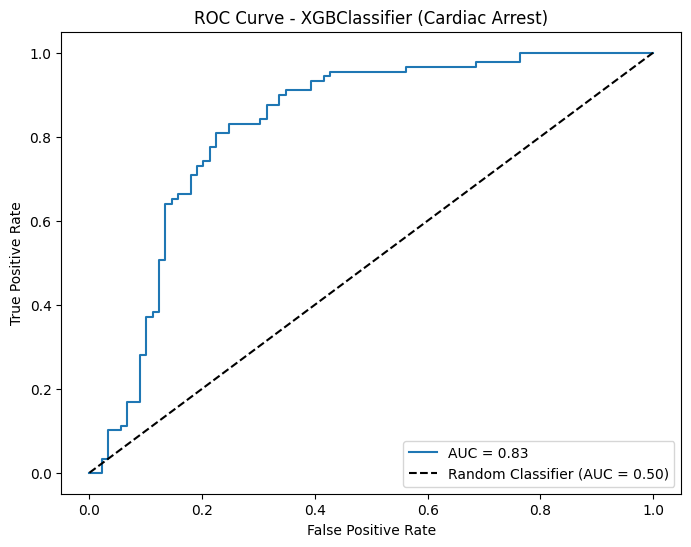

In [ ]:
def objective_XG_CA(trial):
    param = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
        'verbosity': 0
    }

    
    kf_XG_CA = StratifiedKFold(n_splits=5, shuffle=False)

    fold_accuracies_XG_CA = []
    fold_precisions_XG_CA = []
    fold_recalls_XG_CA = []
    fold_f1_scores_XG_CA = []
    fold_roc_auc_XG_CA = []

  
    for fold_idx, (train_index, test_index) in enumerate(kf_XG_CA.split(X_XG_CA, y_XG_CA)):
        print(f"Training fold {fold_idx + 1}")

        X_train_XG_CA, X_test_XG_CA = X_XG_CA.iloc[train_index], X_XG_CA.iloc[test_index]
        y_train_XG_CA, y_test_XG_CA = y_XG_CA.iloc[train_index], y_XG_CA.iloc[test_index]

        xgb_classifier_XG_CA = xgb.XGBClassifier(**param)

        xgb_classifier_XG_CA.fit(X_train_XG_CA, y_train_XG_CA)

        y_pred_XG_CA = xgb_classifier_XG_CA.predict(X_test_XG_CA)
        y_pred_prob_XG_CA = xgb_classifier_XG_CA.predict_proba(X_test_XG_CA)[:, 1]

        accuracy_XG_CA = accuracy_score(y_test_XG_CA, y_pred_XG_CA)
        precision_XG_CA = precision_score(y_test_XG_CA, y_pred_XG_CA)
        recall_XG_CA = recall_score(y_test_XG_CA, y_pred_XG_CA)
        f1_XG_CA = f1_score(y_test_XG_CA, y_pred_XG_CA)
        roc_auc_XG_CA = roc_auc_score(y_test_XG_CA, y_pred_prob_XG_CA)

        fold_accuracies_XG_CA.append(accuracy_XG_CA)
        fold_precisions_XG_CA.append(precision_XG_CA)
        fold_recalls_XG_CA.append(recall_XG_CA)
        fold_f1_scores_XG_CA.append(f1_XG_CA)
        fold_roc_auc_XG_CA.append(roc_auc_XG_CA)

    avg_accuracy_XG_CA = np.mean(fold_accuracies_XG_CA)
    avg_precision_XG_CA = np.mean(fold_precisions_XG_CA)
    avg_recall_XG_CA = np.mean(fold_recalls_XG_CA)
    avg_f1_XG_CA = np.mean(fold_f1_scores_XG_CA)
    avg_roc_auc_XG_CA = np.mean(fold_roc_auc_XG_CA)

    return avg_roc_auc_XG_CA

study_XG_CA = optuna.create_study(direction='maximize')
study_XG_CA.optimize(objective_XG_CA, n_trials=20)

print("Best hyperparameters:", study_XG_CA.best_params)

best_params_XG_CA = study_XG_CA.best_params

kf_XG_CA = StratifiedKFold(n_splits=5, shuffle=False)

fold_accuracies_XG_CA = []
fold_precisions_XG_CA = []
fold_recalls_XG_CA = []
fold_f1_scores_XG_CA = []
fold_roc_auc_XG_CA = []


for fold_idx, (train_index, test_index) in enumerate(kf_XG_CA.split(X_XG_CA, y_XG_CA)):
    print(f"Training fold {fold_idx + 1}")

    X_train_XG_CA, X_test_XG_CA = X_XG_CA.iloc[train_index], X_XG_CA.iloc[test_index]
    y_train_XG_CA, y_test_XG_CA = y_XG_CA.iloc[train_index], y_XG_CA.iloc[test_index]

    xgb_classifier_XG_CA = xgb.XGBClassifier(**best_params_XG_CA)

    xgb_classifier_XG_CA.fit(X_train_XG_CA, y_train_XG_CA)

    y_pred_XG_CA = xgb_classifier_XG_CA.predict(X_test_XG_CA)
    y_pred_prob_XG_CA = xgb_classifier_XG_CA.predict_proba(X_test_XG_CA)[:, 1]

    accuracy_XG_CA = accuracy_score(y_test_XG_CA, y_pred_XG_CA)
    precision_XG_CA = precision_score(y_test_XG_CA, y_pred_XG_CA)
    recall_XG_CA = recall_score(y_test_XG_CA, y_pred_XG_CA)
    f1_XG_CA = f1_score(y_test_XG_CA, y_pred_XG_CA)
    roc_auc_XG_CA = roc_auc_score(y_test_XG_CA, y_pred_prob_XG_CA)

    fold_accuracies_XG_CA.append(accuracy_XG_CA)
    fold_precisions_XG_CA.append(precision_XG_CA)
    fold_recalls_XG_CA.append(recall_XG_CA)
    fold_f1_scores_XG_CA.append(f1_XG_CA)
    fold_roc_auc_XG_CA.append(roc_auc_XG_CA)

avg_accuracy_XG_CA = np.mean(fold_accuracies_XG_CA)
avg_precision_XG_CA = np.mean(fold_precisions_XG_CA)
avg_recall_XG_CA = np.mean(fold_recalls_XG_CA)
avg_f1_XG_CA = np.mean(fold_f1_scores_XG_CA)
avg_roc_auc_XG_CA = np.mean(fold_roc_auc_XG_CA)

print(f"\nAverage accuracy from 5-fold cross-validation: {avg_accuracy_XG_CA:.4f}")
print(f"Average precision: {avg_precision_XG_CA:.4f}")
print(f"Average recall: {avg_recall_XG_CA:.4f}")
print(f"Average F1 score: {avg_f1_XG_CA:.4f}")
print(f"Average AUC-ROC: {avg_roc_auc_XG_CA:.4f}")

# Plot AUC-ROC curve
fpr_XG_CA, tpr_XG_CA, _ = roc_curve(y_test_XG_CA, y_pred_prob_XG_CA)
plt.figure(figsize=(8, 6))
plt.plot(fpr_XG_CA, tpr_XG_CA, label=f'AUC = {avg_roc_auc_XG_CA:.2f}')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier (AUC = 0.50)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBClassifier (Cardiac Arrest)')
plt.legend(loc='lower right')
plt.show()

In [ ]:

plt.style.use('petroff10')
plt.rcParams.update({"font.size": 12})

explainer_XG_CA = shap.Explainer(xgb_classifier_XG_CA, X_train_XG_CA)
shap_values_XG_CA = explainer_XG_CA(X_test_XG_CA)

feature_names = X_test_XG_CA.columns

plt.figure(figsize=(18, 6))

shap.summary_plot(shap_values_XG_CA, X_test_XG_CA, feature_names=feature_names, plot_size=(18, 6), show=False)

plt.suptitle("SHAP Summary Plot - XGBClassifier (Cardiac Arrest)",
             fontsize=16, fontweight="bold", y=1.05)

plt.subplots_adjust(top=0.90, right=1.0, bottom=0.1, left=0.1)

plt.show()

Sample of prediction probabilities on test set:
[0.5001566  0.5003633  0.49639952 0.5033859  0.5034442  0.49604687
 0.49899423 0.50217164 0.49906096 0.5014471 ]


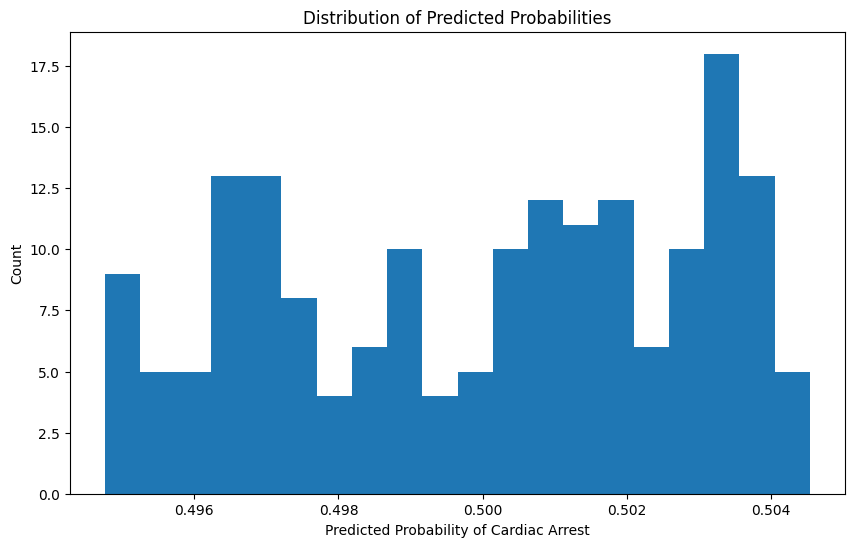

Found 0 clear positive predictions
Found 0 clear negative predictions

No clear predictions found. Explaining a random example:
Instance 106:
Actual class: No Cardiac Arrest
Predicted probability: 0.5019


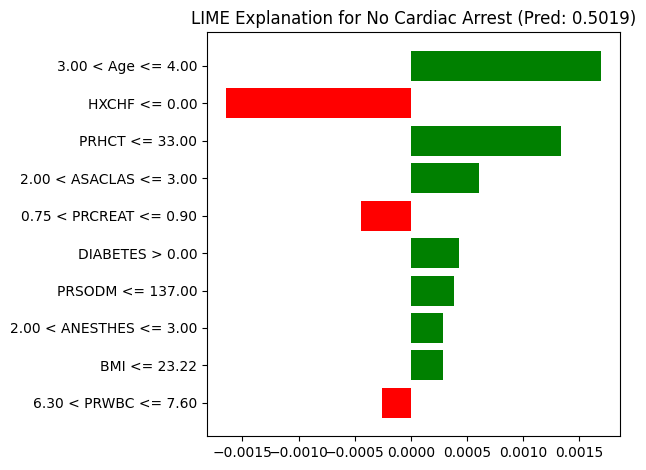

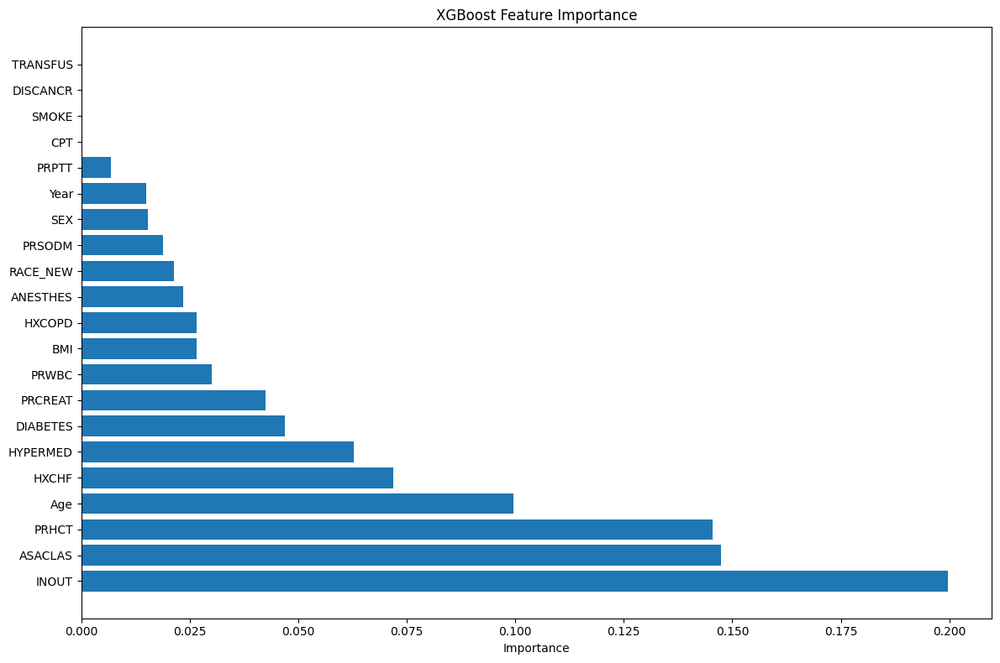

In [ ]:
final_model_XG_CA = xgb.XGBClassifier(**best_params_XG_CA)
final_model_XG_CA.fit(X_XG_CA, y_XG_CA)

from sklearn.model_selection import train_test_split

X_train_lime, X_test_lime, y_train_lime, y_test_lime = train_test_split(
    X_XG_CA, y_XG_CA, test_size=0.2, random_state=42, stratify=y_XG_CA
)


from lime.lime_tabular import LimeTabularExplainer

lime_explainer_XG_CA = LimeTabularExplainer(
    training_data=X_train_lime.values,
    feature_names=X_train_lime.columns.tolist(),
    class_names=['No Cardiac Arrest', 'Cardiac Arrest'],
    mode='classification',
    discretize_continuous=True
)

test_probs = final_model_XG_CA.predict_proba(X_test_lime)[:, 1]
print("Sample of prediction probabilities on test set:")
print(test_probs[:10])

import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.hist(test_probs, bins=20)
plt.title('Distribution of Predicted Probabilities')
plt.xlabel('Predicted Probability of Cardiac Arrest')
plt.ylabel('Count')
plt.show()

clear_pos_idx = np.where(test_probs > 0.7)[0]
clear_neg_idx = np.where(test_probs < 0.3)[0]

print(f"Found {len(clear_pos_idx)} clear positive predictions")
print(f"Found {len(clear_neg_idx)} clear negative predictions")

def explain_with_lime(model, instance_idx, X_test, y_test, explainer, class_names, num_features=10):

    instance = X_test.iloc[instance_idx].values

    actual_class = y_test.iloc[instance_idx]
    pred_prob = model.predict_proba(instance.reshape(1, -1))[0, 1]

    print(f"Instance {instance_idx}:")
    print(f"Actual class: {class_names[actual_class]}")
    print(f"Predicted probability: {pred_prob:.4f}")

    explanation = explainer.explain_instance(
        instance,
        model.predict_proba,
        num_features=num_features
    )

    fig = explanation.as_pyplot_figure()
    plt.title(f"LIME Explanation for {class_names[actual_class]} (Pred: {pred_prob:.4f})")
    plt.tight_layout()
    plt.show()

    return explanation

if len(clear_pos_idx) > 0:
    pos_idx = clear_pos_idx[0]
    print("\nExplaining a positive prediction (Cardiac Arrest):")
    pos_exp = explain_with_lime(
        final_model_XG_CA,
        pos_idx,
        X_test_lime,
        y_test_lime,
        lime_explainer_XG_CA,
        ['No Cardiac Arrest', 'Cardiac Arrest']
    )

if len(clear_neg_idx) > 0:
    neg_idx = clear_neg_idx[0]
    print("\nExplaining a negative prediction (No Cardiac Arrest):")
    neg_exp = explain_with_lime(
        final_model_XG_CA,
        neg_idx,
        X_test_lime,
        y_test_lime,
        lime_explainer_XG_CA,
        ['No Cardiac Arrest', 'Cardiac Arrest']
    )

if len(clear_pos_idx) == 0 and len(clear_neg_idx) == 0:
    rand_idx = np.random.randint(0, len(X_test_lime))
    print("\nNo clear predictions found. Explaining a random example:")
    rand_exp = explain_with_lime(
        final_model_XG_CA,
        rand_idx,
        X_test_lime,
        y_test_lime,
        lime_explainer_XG_CA,
        ['No Cardiac Arrest', 'Cardiac Arrest']
    )

feature_importance = final_model_XG_CA.feature_importances_
sorted_idx = np.argsort(feature_importance)[::-1]
sorted_features = [X_XG_CA.columns[i] for i in sorted_idx]
sorted_importance = feature_importance[sorted_idx]

plt.figure(figsize=(12, 8))
plt.barh(range(len(sorted_idx)), sorted_importance, align='center')
plt.yticks(range(len(sorted_idx)), sorted_features)
plt.title('XGBoost Feature Importance')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()

## CDMI

In [ ]:
X_XG_CDMI = df1_hip_cleaned.drop(columns=['CDARREST', 'CDMI'])
y_XG_CDMI = df1_hip_cleaned['CDMI']  

[I 2025-12-04 18:37:29,809] A new study created in memory with name: no-name-6c4ce9c9-07d4-4116-898d-12b0f791c616
D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('col

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-04 18:37:30,460] Trial 0 finished with value: 0.7827849938277465 and parameters: {'max_depth': 8, 'learning_rate': 0.011187017393129911, 'n_estimators': 114, 'subsample': 0.8406482182120465, 'colsample_bytree': 0.864962153645149}. Best is trial 0 with value: 0.7827849938277465.


Training fold 5
Training fold 1


D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3


[I 2025-12-04 18:37:30,988] Trial 1 finished with value: 0.7616263262158379 and parameters: {'max_depth': 5, 'learning_rate': 0.056436314080097076, 'n_estimators': 192, 'subsample': 0.6643101191331166, 'colsample_bytree': 0.7094615756709906}. Best is trial 0 with value: 0.7827849938277465.


Training fold 4
Training fold 5


D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 1
Training fold 2
Training fold 3


[I 2025-12-04 18:37:31,350] Trial 2 finished with value: 0.798126188538611 and parameters: {'max_depth': 8, 'learning_rate': 0.0007260932620431573, 'n_estimators': 56, 'subsample': 0.6578747139466543, 'colsample_bytree': 0.5893143109860236}. Best is trial 2 with value: 0.798126188538611.


Training fold 4
Training fold 5
Training fold 1


D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:37:32,220] Trial 3 finished with value: 0.7893582981740803 and parameters: {'max_depth': 8, 'learning_rate': 0.006415929127021042, 'n_estimators': 166, 'subsample': 0.8774740870789068, 'colsample_bytree': 0.6895942121911306}. Best is trial 2 with value: 0.798126188538611.
D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-04 18:37:33,089] Trial 4 finished with value: 0.7779305924151105 and parameters: {'max_depth': 9, 'learning_rate': 0.0008020477549151651, 'n_estimators': 156, 'subsample': 0.9590278179786147, 'colsample_bytree': 0.9348383286675213}. Best is trial 2 with value: 0.798126188538611.


Training fold 5
Training fold 1


D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4


[I 2025-12-04 18:37:33,564] Trial 5 finished with value: 0.7745278080447268 and parameters: {'max_depth': 5, 'learning_rate': 0.0343273934368106, 'n_estimators': 177, 'subsample': 0.8668022163450195, 'colsample_bytree': 0.5571955386980478}. Best is trial 2 with value: 0.798126188538611.


Training fold 5
Training fold 1


D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:37:34,420] Trial 6 finished with value: 0.794415405491314 and parameters: {'max_depth': 9, 'learning_rate': 0.003310605297524001, 'n_estimators': 176, 'subsample': 0.5977159085851842, 'colsample_bytree': 0.5173295145431442}. Best is trial 2 with value: 0.798126188538611.
D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:37:35,605] Trial 7 finished with value: 0.7668558724886895 and parameters: {'max_depth': 10, 'learning_rate': 0.006496784009212697, 'n_estimators': 177, 'subsample': 0.9834701773711974, 'colsample_bytree': 0.9540527189116272}. Best is trial 2 with value: 0.798126188538611.
D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0

Training fold 1
Training fold 2
Training fold 3
Training fold 4


[I 2025-12-04 18:37:36,130] Trial 8 finished with value: 0.7950725485778628 and parameters: {'max_depth': 7, 'learning_rate': 4.564298058758757e-05, 'n_estimators': 135, 'subsample': 0.5511746787364464, 'colsample_bytree': 0.8062711490328389}. Best is trial 2 with value: 0.798126188538611.


Training fold 5
Training fold 1
Training fold 2


D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:37:36,497] Trial 9 finished with value: 0.7985710221632785 and parameters: {'max_depth': 4, 'learning_rate': 0.0001174183111572413, 'n_estimators': 131, 'subsample': 0.789392929461118, 'colsample_bytree': 0.8206339550610835}. Best is trial 9 with value: 0.7985710221632785.
D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:37:36,741] Trial 10 finished with value: 0.7989392870980302 and parameters: {'max_depth': 3, 'learning_rate': 2.8952233871717938e-05, 'n_estimators': 89, 'subsample': 0.7612112031543581, 'colsample_bytree': 0.8048424863176038}. Best is trial 10 with value: 0.7989392870980302.
D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:37:36,974] Trial 11 finished with value: 0.7968144606901998 and parameters: {'max_depth': 3, 'learning_rate': 1.2276299288649186e-05, 'n_estimators': 92, 'subsample': 0.7533208797367881, 'colsample_bytree': 0.8048757057759828}. Best is trial 10 with value: 0.7989392870980302.
D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:37:37,201] Trial 12 finished with value: 0.7928800643217929 and parameters: {'max_depth': 3, 'learning_rate': 0.00012461033956430028, 'n_estimators': 86, 'subsample': 0.7480093136478061, 'colsample_bytree': 0.8664644236680278}. Best is trial 10 with value: 0.7989392870980302.
D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v

Training fold 1
Training fold 2
Training fold 3


[I 2025-12-04 18:37:37,597] Trial 13 finished with value: 0.8028735260310718 and parameters: {'max_depth': 5, 'learning_rate': 0.00013690414515187444, 'n_estimators': 124, 'subsample': 0.7694463519094071, 'colsample_bytree': 0.6471619149540535}. Best is trial 13 with value: 0.8028735260310718.


Training fold 4
Training fold 5
Training fold 1


D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:37:37,938] Trial 14 finished with value: 0.8013691287826011 and parameters: {'max_depth': 5, 'learning_rate': 1.1890980001896221e-05, 'n_estimators': 91, 'subsample': 0.6848032618773444, 'colsample_bytree': 0.6490807423295902}. Best is trial 13 with value: 0.8028735260310718.
D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v

Training fold 1
Training fold 2
Training fold 3


[I 2025-12-04 18:37:38,332] Trial 15 finished with value: 0.8012749352035395 and parameters: {'max_depth': 6, 'learning_rate': 0.0002185177602922117, 'n_estimators': 107, 'subsample': 0.6754981964950892, 'colsample_bytree': 0.6340171049721604}. Best is trial 13 with value: 0.8028735260310718.


Training fold 4
Training fold 5
Training fold 1


D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
[I 2025-12-04 18:37:38,569] Trial 16 finished with value: 0.8037725606846422 and parame

Training fold 2
Training fold 3
Training fold 4
Training fold 5
Training fold 1


D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
[I 2025-12-04 18:37:38,824] Trial 17 finished with value: 0.7957327065516571 and parame

Training fold 2
Training fold 3
Training fold 4
Training fold 5


D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),


Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:37:39,082] Trial 18 finished with value: 0.8065659206277012 and parameters: {'max_depth': 4, 'learning_rate': 4.157205389398712e-05, 'n_estimators': 70, 'subsample': 0.6117901691586544, 'colsample_bytree': 0.6148516205384464}. Best is trial 18 with value: 0.8065659206277012.
D:\py\tmp\ipykernel_4520\812096236.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
D:\py\tmp\ipykernel_4520\812096236.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
D:\py\tmp\ipykernel_4520\812096236.py:10: FutureWarning: suggest_uniform has been deprecated in v3

Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5


[I 2025-12-04 18:37:39,293] Trial 19 finished with value: 0.8100628041159272 and parameters: {'max_depth': 4, 'learning_rate': 2.6020368607094763e-05, 'n_estimators': 66, 'subsample': 0.603795597298169, 'colsample_bytree': 0.5034299144715604}. Best is trial 19 with value: 0.8100628041159272.


Best hyperparameters: {'max_depth': 4, 'learning_rate': 2.6020368607094763e-05, 'n_estimators': 66, 'subsample': 0.603795597298169, 'colsample_bytree': 0.5034299144715604}
Training fold 1
Training fold 2
Training fold 3
Training fold 4
Training fold 5

Average accuracy from 5-fold cross-validation: 0.7018
Average precision: 0.7427
Average recall: 0.6885
Average F1 score: 0.6795
Average AUC-ROC: 0.8101


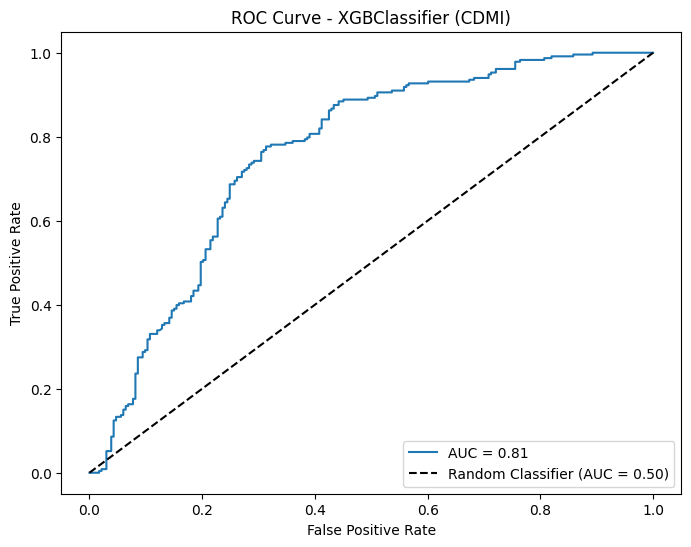

In [ ]:
def objective_XG_CDMI(trial):
    param = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-5, 1e-1),
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
        'verbosity': 0
    }

    kf_XG_CDMI = StratifiedKFold(n_splits=5, shuffle=False)

    fold_accuracies_XG_CDMI = []
    fold_precisions_XG_CDMI = []
    fold_recalls_XG_CDMI = []
    fold_f1_scores_XG_CDMI = []
    fold_roc_auc_XG_CDMI = []


    for fold_idx, (train_index, test_index) in enumerate(kf_XG_CDMI.split(X_XG_CDMI, y_XG_CDMI)):
        print(f"Training fold {fold_idx + 1}")

        X_train_XG_CDMI, X_test_XG_CDMI = X_XG_CDMI.iloc[train_index], X_XG_CDMI.iloc[test_index]
        y_train_XG_CDMI, y_test_XG_CDMI = y_XG_CDMI.iloc[train_index], y_XG_CDMI.iloc[test_index]

        xgb_classifier_XG_CDMI = xgb.XGBClassifier(**param)

        xgb_classifier_XG_CDMI.fit(X_train_XG_CDMI, y_train_XG_CDMI)

        y_pred_XG_CDMI = xgb_classifier_XG_CDMI.predict(X_test_XG_CDMI)
        y_pred_prob_XG_CDMI = xgb_classifier_XG_CDMI.predict_proba(X_test_XG_CDMI)[:, 1]

        accuracy_XG_CDMI = accuracy_score(y_test_XG_CDMI, y_pred_XG_CDMI)
        precision_XG_CDMI = precision_score(y_test_XG_CDMI, y_pred_XG_CDMI)
        recall_XG_CDMI = recall_score(y_test_XG_CDMI, y_pred_XG_CDMI)
        f1_XG_CDMI = f1_score(y_test_XG_CDMI, y_pred_XG_CDMI)
        roc_auc_XG_CDMI = roc_auc_score(y_test_XG_CDMI, y_pred_prob_XG_CDMI)

        fold_accuracies_XG_CDMI.append(accuracy_XG_CDMI)
        fold_precisions_XG_CDMI.append(precision_XG_CDMI)
        fold_recalls_XG_CDMI.append(recall_XG_CDMI)
        fold_f1_scores_XG_CDMI.append(f1_XG_CDMI)
        fold_roc_auc_XG_CDMI.append(roc_auc_XG_CDMI)

    avg_accuracy_XG_CDMI = np.mean(fold_accuracies_XG_CDMI)
    avg_precision_XG_CDMI = np.mean(fold_precisions_XG_CDMI)
    avg_recall_XG_CDMI = np.mean(fold_recalls_XG_CDMI)
    avg_f1_XG_CDMI = np.mean(fold_f1_scores_XG_CDMI)
    avg_roc_auc_XG_CDMI = np.mean(fold_roc_auc_XG_CDMI)

    return avg_roc_auc_XG_CDMI

study_XG_CDMI = optuna.create_study(direction='maximize')
study_XG_CDMI.optimize(objective_XG_CDMI, n_trials=20)

print("Best hyperparameters:", study_XG_CDMI.best_params)


best_params_XG_CDMI = study_XG_CDMI.best_params

kf_XG_CDMI = StratifiedKFold(n_splits=5, shuffle=False)

fold_accuracies_XG_CDMI = []
fold_precisions_XG_CDMI = []
fold_recalls_XG_CDMI = []
fold_f1_scores_XG_CDMI = []
fold_roc_auc_XG_CDMI = []

for fold_idx, (train_index, test_index) in enumerate(kf_XG_CDMI.split(X_XG_CDMI, y_XG_CDMI)):
    print(f"Training fold {fold_idx + 1}")

    X_train_XG_CDMI, X_test_XG_CDMI = X_XG_CDMI.iloc[train_index], X_XG_CDMI.iloc[test_index]
    y_train_XG_CDMI, y_test_XG_CDMI = y_XG_CDMI.iloc[train_index], y_XG_CDMI.iloc[test_index]

    xgb_classifier_XG_CDMI = xgb.XGBClassifier(**best_params_XG_CDMI)

    xgb_classifier_XG_CDMI.fit(X_train_XG_CDMI, y_train_XG_CDMI)

    y_pred_XG_CDMI = xgb_classifier_XG_CDMI.predict(X_test_XG_CDMI)
    y_pred_prob_XG_CDMI = xgb_classifier_XG_CDMI.predict_proba(X_test_XG_CDMI)[:, 1]

    accuracy_XG_CDMI = accuracy_score(y_test_XG_CDMI, y_pred_XG_CDMI)
    precision_XG_CDMI = precision_score(y_test_XG_CDMI, y_pred_XG_CDMI)
    recall_XG_CDMI = recall_score(y_test_XG_CDMI, y_pred_XG_CDMI)
    f1_XG_CDMI = f1_score(y_test_XG_CDMI, y_pred_XG_CDMI)
    roc_auc_XG_CDMI = roc_auc_score(y_test_XG_CDMI, y_pred_prob_XG_CDMI)

    fold_accuracies_XG_CDMI.append(accuracy_XG_CDMI)
    fold_precisions_XG_CDMI.append(precision_XG_CDMI)
    fold_recalls_XG_CDMI.append(recall_XG_CDMI)
    fold_f1_scores_XG_CDMI.append(f1_XG_CDMI)
    fold_roc_auc_XG_CDMI.append(roc_auc_XG_CDMI)

avg_accuracy_XG_CDMI = np.mean(fold_accuracies_XG_CDMI)
avg_precision_XG_CDMI = np.mean(fold_precisions_XG_CDMI)
avg_recall_XG_CDMI = np.mean(fold_recalls_XG_CDMI)
avg_f1_XG_CDMI = np.mean(fold_f1_scores_XG_CDMI)
avg_roc_auc_XG_CDMI = np.mean(fold_roc_auc_XG_CDMI)

print(f"\nAverage accuracy from 5-fold cross-validation: {avg_accuracy_XG_CDMI:.4f}")
print(f"Average precision: {avg_precision_XG_CDMI:.4f}")
print(f"Average recall: {avg_recall_XG_CDMI:.4f}")
print(f"Average F1 score: {avg_f1_XG_CDMI:.4f}")
print(f"Average AUC-ROC: {avg_roc_auc_XG_CDMI:.4f}")

fpr_XG_CDMI, tpr_XG_CDMI, _ = roc_curve(y_test_XG_CDMI, y_pred_prob_XG_CDMI)
plt.figure(figsize=(8, 6))
plt.plot(fpr_XG_CDMI, tpr_XG_CDMI, label=f'AUC = {avg_roc_auc_XG_CDMI:.2f}')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier (AUC = 0.50)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBClassifier (CDMI)')
plt.legend(loc='lower right')
plt.show()

In [ ]:
plt.style.use('petroff10')
plt.rcParams.update({"font.size": 12})

# SHAP for XGBoost - CDMI
explainer_XG_CDMI = shap.Explainer(xgb_classifier_XG_CDMI, X_train_XG_CDMI)
shap_values_XG_CDMI = explainer_XG_CDMI(X_test_XG_CDMI)

feature_names = X_test_XG_CDMI.columns

plt.figure(figsize=(18, 6))

shap.summary_plot(shap_values_XG_CDMI, X_test_XG_CDMI, feature_names=feature_names, plot_size=(18, 6), show=False)

plt.suptitle("SHAP Summary Plot - XGBClassifier (CDMI)",
             fontsize=16, fontweight="bold", y=1.05)

plt.subplots_adjust(top=0.90, right=1.0, bottom=0.1, left=0.1)

plt.show()

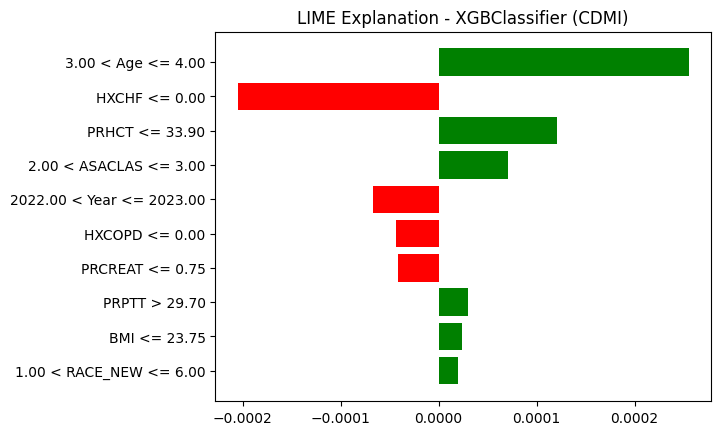

In [ ]:
lime_explainer_XG_CDMI = LimeTabularExplainer(
    training_data=X_train_XG_CDMI.values,
    feature_names=X_train_XG_CDMI.columns.tolist(),
    class_names=['No CDMI', 'CDMI'],
    mode='classification',
    discretize_continuous=True
)

idx_XG_CDMI = np.random.randint(0, X_test_XG_CDMI.shape[0])
instance_to_explain_CDMI = X_test_XG_CDMI.iloc[idx_XG_CDMI]

lime_exp_XG_CDMI = lime_explainer_XG_CDMI.explain_instance(
    instance_to_explain_CDMI.values,
    xgb_classifier_XG_CDMI.predict_proba
)

lime_exp_XG_CDMI.show_in_notebook()

fig = lime_exp_XG_CDMI.as_pyplot_figure()
plt.title("LIME Explanation - XGBClassifier (CDMI)")
plt.show()

## Combined

In [46]:
from sklearn.utils import resample

In [ ]:
X_XG_CA_resampled = df_hip_cleaned.drop(columns=['CDARREST', 'CDMI'])
y_XG_CA_resampled = df_hip_cleaned['CDARREST']

X_XG_CDMI_resampled = df1_hip_cleaned.drop(columns=['CDMI', 'CDARREST'])
y_XG_CDMI_resampled = df1_hip_cleaned['CDMI']

common_columns_XG = X_XG_CA_resampled.columns.intersection(X_XG_CDMI_resampled.columns)

X_XG_Combined = np.concatenate(
    (X_XG_CA_resampled[common_columns_XG],
     X_XG_CDMI_resampled[common_columns_XG]),
    axis=0
)
y_XG_Combined = np.concatenate((y_XG_CA_resampled, y_XG_CDMI_resampled), axis=0)

X_XG_Combined_df = pd.DataFrame(X_XG_Combined, columns=common_columns_XG)


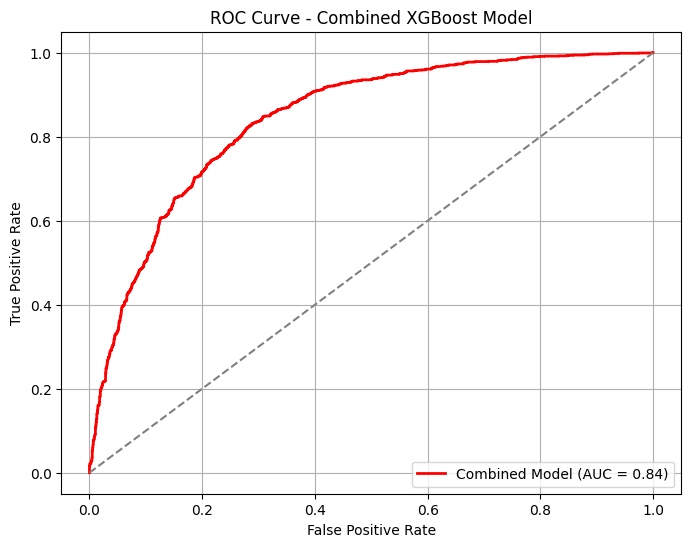

Combined Model Metrics: 
Accuracy: 0.7681
F1 Score: 0.7842
Recall: 0.8425
Precision: 0.7334
AUC Score: 0.8427


In [ ]:
xg_classifier_CA = xgb.XGBClassifier(**best_params_XG_CA)
xg_classifier_CDMI = xgb.XGBClassifier(**best_params_XG_CDMI)

original_feature_names_XG = X_XG_CA_resampled.columns.tolist()

X_XG_Combined_df = pd.DataFrame(X_XG_Combined, columns=original_feature_names_XG)

voting_classifier_XG_Combined = VotingClassifier(estimators=[
    ('xg_CA', xg_classifier_CA),
    ('xg_CDMI', xg_classifier_CDMI)
], voting='soft')

voting_classifier_XG_Combined.fit(X_XG_Combined, y_XG_Combined, )

y_pred_combined_labels_XG_Combined = voting_classifier_XG_Combined.predict(X_XG_Combined)

accuracy_combined_XG_Combined = accuracy_score(y_XG_Combined, y_pred_combined_labels_XG_Combined)
f1_combined_XG_Combined = f1_score(y_XG_Combined, y_pred_combined_labels_XG_Combined)
recall_combined_XG_Combined = recall_score(y_XG_Combined, y_pred_combined_labels_XG_Combined)
precision_combined_XG_Combined = precision_score(y_XG_Combined, y_pred_combined_labels_XG_Combined)

y_pred_combined_prob_XG_Combined = voting_classifier_XG_Combined.predict_proba(X_XG_Combined)[:, 1]
fpr_combined_XG_Combined, tpr_combined_XG_Combined, _ = roc_curve(y_XG_Combined, y_pred_combined_prob_XG_Combined)
roc_auc_combined_XG_Combined = auc(fpr_combined_XG_Combined, tpr_combined_XG_Combined)

plt.figure(figsize=(8, 6))
plt.plot(fpr_combined_XG_Combined, tpr_combined_XG_Combined, color='red', lw=2, label=f'Combined Model (AUC = {roc_auc_combined_XG_Combined:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Combined XGBoost Model')
plt.legend(loc='lower right')
plt.grid()
plt.show()

print(f'Combined Model Metrics: ')
print(f'Accuracy: {accuracy_combined_XG_Combined:.4f}')
print(f'F1 Score: {f1_combined_XG_Combined:.4f}')
print(f'Recall: {recall_combined_XG_Combined:.4f}')
print(f'Precision: {precision_combined_XG_Combined:.4f}')
print(f'AUC Score: {roc_auc_combined_XG_Combined:.4f}')

In [49]:
xg_classifier_CA.fit(X_XG_CA_resampled, y_XG_CA_resampled)
xg_classifier_CDMI.fit(X_XG_CDMI_resampled, y_XG_CDMI_resampled)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5034299144715604, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, feature_weights=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None,
              learning_rate=2.6020368607094763e-05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=66, n_jobs=None,
              num_parallel_tree=None, ...)

In [ ]:
explainer_xg_CA = shap.TreeExplainer(xg_classifier_CA)
explainer_xg_CDMI = shap.TreeExplainer(xg_classifier_CDMI)

shap_values_xg_CA = explainer_xg_CA.shap_values(X_XG_CA_resampled)
shap_values_xg_CDMI = explainer_xg_CDMI.shap_values(X_XG_CDMI_resampled)

shap_values_combined = np.concatenate([shap_values_xg_CA, shap_values_xg_CDMI], axis=0)

X_combined = pd.concat([X_XG_CA_resampled, X_XG_CDMI_resampled], axis=0)
feature_names_combined = X_combined.columns.tolist()

shap.summary_plot(shap_values_combined, X_combined, feature_names=feature_names_combined, title="Combined SHAP Summary Plot")

# Logistic Regression

## Cardiac Arrest

[I 2025-12-04 18:39:29,312] A new study created in memory with name: no-name-ea714efd-d655-418a-a847-074103e5b261
D:\py\tmp\ipykernel_4520\1411042298.py:14: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 1e-4, 10)  # Regularization strength
[I 2025-12-04 18:39:29,362] Trial 0 finished with value: 0.8547641291082776 and parameters: {'C': 0.18931823030322167, 'solver': 'lbfgs'}. Best is trial 0 with value: 0.8547641291082776.
D:\py\tmp\ipykernel_4520\1411042298.py:14: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 1e-4, 10)  # Regularization strength
[I 2025-12-04 18:39:29,409] Trial 1 finished with value: 

Best hyperparameters for Logistic Regression: {'C': 0.0039481414849159855, 'solver': 'liblinear'}


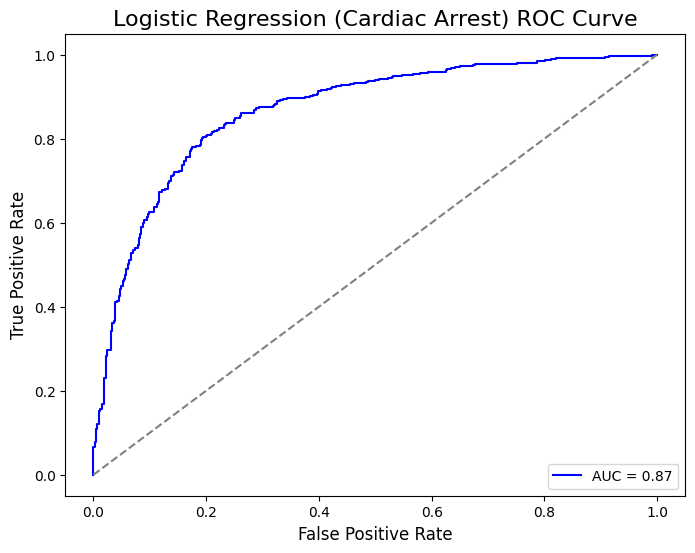

              precision    recall  f1-score   support

           0       0.81      0.78      0.80       446
           1       0.79      0.82      0.80       446

    accuracy                           0.80       892
   macro avg       0.80      0.80      0.80       892
weighted avg       0.80      0.80      0.80       892

AUC-ROC: 0.8676325685213859
Overall Accuracy (Logistic Regression (Cardiac Arrest)): 0.8004
F1 Score (Logistic Regression (Cardiac Arrest)): 0.8048
Recall Score (Logistic Regression (Cardiac Arrest)): 0.8229
Precision Score (Logistic Regression (Cardiac Arrest)): 0.8229


In [ ]:
X_LR_CA = df_hip_cleaned.drop(columns=['CDARREST', 'CDMI'])
y_LR_CA = df_hip_cleaned['CDARREST']

scaler_LR_CA = StandardScaler()
X_scaled_LR_CA = scaler_LR_CA.fit_transform(X_LR_CA)

kf_LR_CA = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

def lr_ca_objective(trial):
    C = trial.suggest_loguniform('C', 1e-4, 10)  
    solver = trial.suggest_categorical('solver', ['liblinear', 'lbfgs', 'newton-cg'])
    auc_scores = []

    for train_index, test_index in kf_LR_CA.split(X_scaled_LR_CA, y_LR_CA):
        X_train_LR_CA, X_test_LR_CA = X_scaled_LR_CA[train_index], X_scaled_LR_CA[test_index]
        y_train_LR_CA, y_test_LR_CA = y_LR_CA[train_index], y_LR_CA[test_index]

        model = LogisticRegression(C=C, solver=solver, max_iter=1000, random_state=42)
        model.fit(X_train_LR_CA, y_train_LR_CA)

        y_prob_LR_CA = model.predict_proba(X_test_LR_CA)[:, 1]
        auc_score = roc_auc_score(y_test_LR_CA, y_prob_LR_CA)
        auc_scores.append(auc_score)

    return np.mean(auc_scores)

study_LR_CA = optuna.create_study(direction="maximize")
study_LR_CA.optimize(lr_ca_objective, n_trials=50)

best_params_LR_CA = study_LR_CA.best_params
print("Best hyperparameters for Logistic Regression:", best_params_LR_CA)

log_reg_LR_CA = LogisticRegression(**best_params_LR_CA, max_iter=1000, random_state=42)

log_reg_LR_CA.fit(X_scaled_LR_CA, y_LR_CA)

y_pred_LR_CA = log_reg_LR_CA.predict(X_scaled_LR_CA)
y_prob_LR_CA = log_reg_LR_CA.predict_proba(X_scaled_LR_CA)[:, 1]


LR_CA_fpr, LR_CA_tpr, _ = roc_curve(y_LR_CA, y_prob_LR_CA)
roc_auc_LR_CA = roc_auc_score(y_LR_CA, y_prob_LR_CA)

plt.figure(figsize=(8, 6))
plt.plot(LR_CA_fpr, LR_CA_tpr, color='blue', label=f'AUC = {roc_auc_LR_CA:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('Logistic Regression (Cardiac Arrest) ROC Curve', fontsize=16)
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.legend(loc="lower right")
plt.show()

print(classification_report(y_LR_CA, y_pred_LR_CA))
print("AUC-ROC:", roc_auc_LR_CA)
accuracy_LR_CA = accuracy_score(y_LR_CA, y_pred_LR_CA)
print(f"Overall Accuracy (Logistic Regression (Cardiac Arrest)): {accuracy_LR_CA:.4f}")
f1_LR_CA = f1_score(y_LR_CA, y_pred_LR_CA)
print(f"F1 Score (Logistic Regression (Cardiac Arrest)): {f1_LR_CA:.4f}")
recall_LR_CA = recall_score(y_LR_CA, y_pred_LR_CA)
print(f"Recall Score (Logistic Regression (Cardiac Arrest)): {recall_LR_CA:.4f}")
precision_LR_CA = recall_score(y_LR_CA, y_pred_LR_CA)
print(f"Precision Score (Logistic Regression (Cardiac Arrest)): {precision_LR_CA:.4f}")

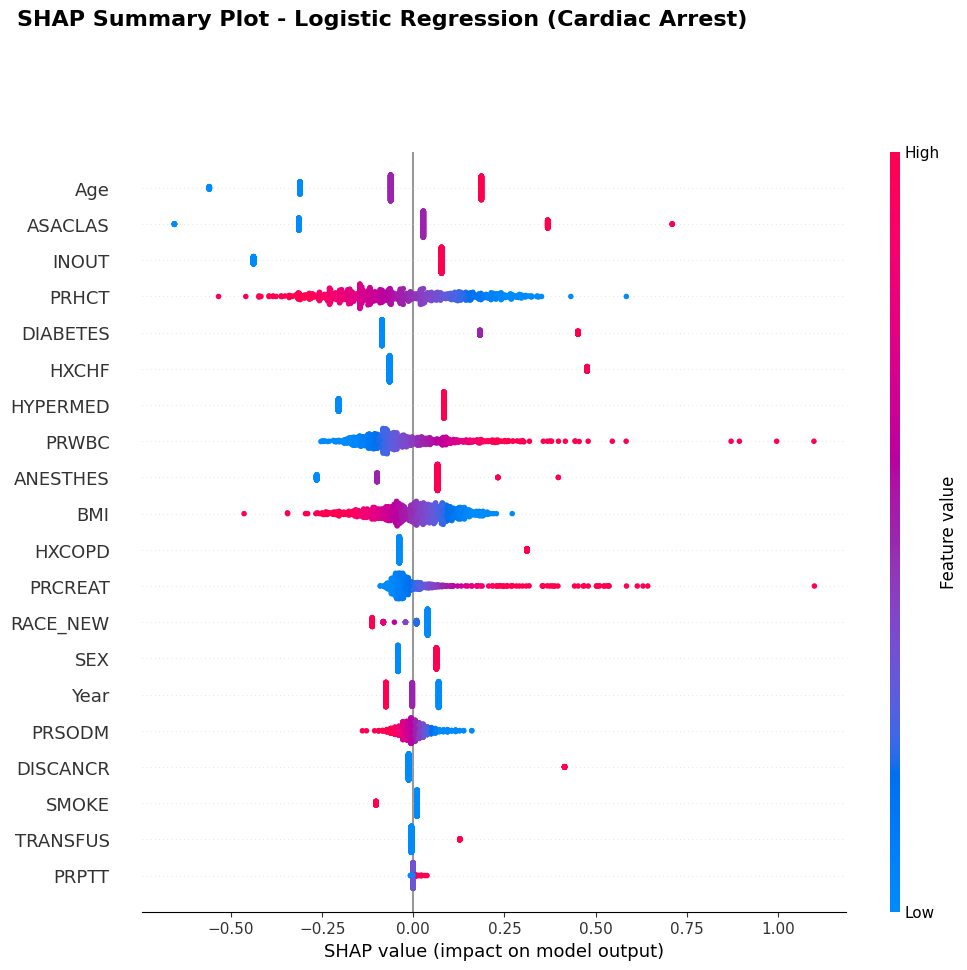

In [ ]:
explainer_LR_CA = shap.Explainer(log_reg_LR_CA, X_scaled_LR_CA)
shap_values_LR_CA = explainer_LR_CA(X_scaled_LR_CA)

feature_names = X_LR_CA.columns

plt.figure(figsize=(22, 10))

shap.summary_plot(shap_values_LR_CA, X_scaled_LR_CA, feature_names=feature_names, show=False)

plt.suptitle("SHAP Summary Plot - Logistic Regression (Cardiac Arrest)", fontsize=16, fontweight="bold", y=1.05)

plt.subplots_adjust(top=0.90, right=1.3, bottom=0.1, left=0.2)

plt.show()

In [ ]:
# Initialize the LIME Explainer for Logistic Regression (CA)
explainer_LR_CA = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_scaled_LR_CA,  =
    feature_names=X_LR_CA.columns,
    class_names=['No CPR', 'CPR'],
    mode='classification'
)

i = np.random.randint(0, X_scaled_LR_CA.shape[0])
sample_instance = X_scaled_LR_CA[i]

explanation_LR_CA = explainer_LR_CA.explain_instance(
    sample_instance,
    log_reg_LR_CA.predict_proba,
    num_features=10
)

explanation_LR_CA.show_in_notebook()

fig = explanation_LR_CA.as_pyplot_figure()
plt.show()

## CDMI

[I 2025-12-04 18:41:29,426] A new study created in memory with name: no-name-6bcd8d3e-4978-44c1-85ea-f2055da33e27
D:\py\tmp\ipykernel_4520\2570403585.py:14: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 1e-4, 10)
[I 2025-12-04 18:41:29,506] Trial 0 finished with value: 0.8310022508534176 and parameters: {'C': 0.12005398765843442, 'solver': 'newton-cg'}. Best is trial 0 with value: 0.8310022508534176.
D:\py\tmp\ipykernel_4520\2570403585.py:14: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 1e-4, 10)
[I 2025-12-04 18:41:29,549] Trial 1 finished with value: 0.8280901216707734 and parameters: {'C': 0.0002281

Best hyperparameters for Logistic Regression: {'C': 0.006911344286260012, 'solver': 'lbfgs'}


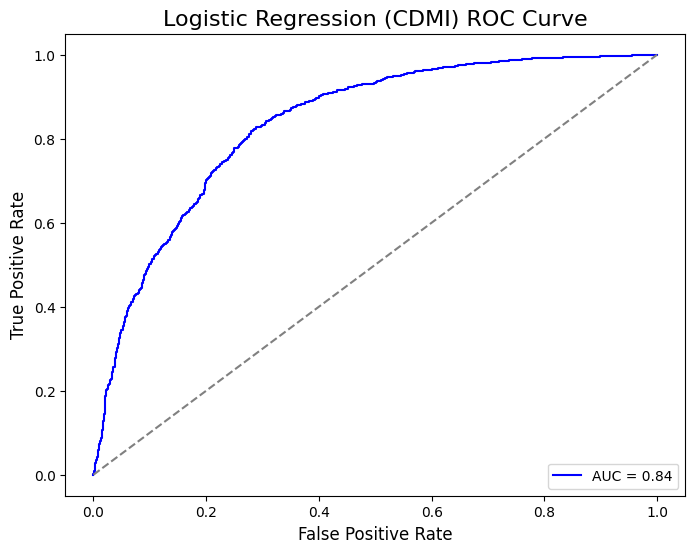

              precision    recall  f1-score   support

           0       0.78      0.73      0.76      1167
           1       0.75      0.80      0.77      1167

    accuracy                           0.76      2334
   macro avg       0.77      0.76      0.76      2334
weighted avg       0.77      0.76      0.76      2334

AUC-ROC: 0.836213524009666
Overall Accuracy (Logistic Regression (CDMI)): 0.7644
F1 Score (Logistic Regression (CDMI)): 0.7718
Recall Score (Logistic Regression (CDMI)): 0.7969
Precision Score (Logistic Regression (CDMI)): 0.7482


In [ ]:
X_LR_CDMI = df1_hip_cleaned.drop(columns=['CDARREST','CDMI'])
y_LR_CDMI = df1_hip_cleaned['CDMI']

scaler_LR_CDMI = StandardScaler()
X_scaled_LR_CDMI = scaler_LR_CDMI.fit_transform(X_LR_CDMI)

kf_LR_CDMI = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

def lr_cdmi_objective(trial):
    C = trial.suggest_loguniform('C', 1e-4, 10)
    solver = trial.suggest_categorical('solver', ['liblinear', 'lbfgs', 'newton-cg'])
    auc_scores = []

    for train_index, test_index in kf_LR_CDMI.split(X_scaled_LR_CDMI, y_LR_CDMI):
        X_train_LR_CDMI, X_test_LR_CDMI = X_scaled_LR_CDMI[train_index], X_scaled_LR_CDMI[test_index]
        y_train_LR_CDMI, y_test_LR_CDMI = y_LR_CDMI[train_index], y_LR_CDMI[test_index]

        model = LogisticRegression(C=C, solver=solver, max_iter=1000, random_state=42)
        model.fit(X_train_LR_CDMI, y_train_LR_CDMI)

        y_prob_LR_CDMI = model.predict_proba(X_test_LR_CDMI)[:, 1]
        auc_score = roc_auc_score(y_test_LR_CDMI, y_prob_LR_CDMI)
        auc_scores.append(auc_score)

    return np.mean(auc_scores)

study_LR_CDMI = optuna.create_study(direction="maximize")
study_LR_CDMI.optimize(lr_cdmi_objective, n_trials=50)

best_params_LR_CDMI = study_LR_CDMI.best_params
print("Best hyperparameters for Logistic Regression:", best_params_LR_CDMI)

log_reg_LR_CDMI = LogisticRegression(**best_params_LR_CDMI, max_iter=1000, random_state=42)

log_reg_LR_CDMI.fit(X_scaled_LR_CDMI, y_LR_CDMI)

y_pred_LR_CDMI = log_reg_LR_CDMI.predict(X_scaled_LR_CDMI)
y_prob_LR_CDMI = log_reg_LR_CDMI.predict_proba(X_scaled_LR_CDMI)[:, 1]


LR_CDMI_fpr, LR_CDMI_tpr, _ = roc_curve(y_LR_CDMI, y_prob_LR_CDMI)
roc_auc_LR_CDMI = roc_auc_score(y_LR_CDMI, y_prob_LR_CDMI)

plt.figure(figsize=(8, 6))
plt.plot(LR_CDMI_fpr, LR_CDMI_tpr, color='blue', label=f'AUC = {roc_auc_LR_CDMI:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('Logistic Regression (CDMI) ROC Curve', fontsize=16)
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.legend(loc="lower right")
plt.show()

print(classification_report(y_LR_CDMI, y_pred_LR_CDMI))
print("AUC-ROC:", roc_auc_LR_CDMI)
accuracy_LR_CDMI = accuracy_score(y_LR_CDMI, y_pred_LR_CDMI)
print(f"Overall Accuracy (Logistic Regression (CDMI)): {accuracy_LR_CDMI:.4f}")
f1_LR_CDMI = f1_score(y_LR_CDMI, y_pred_LR_CDMI)
print(f"F1 Score (Logistic Regression (CDMI)): {f1_LR_CDMI:.4f}")
recall_LR_CDMI = recall_score(y_LR_CDMI, y_pred_LR_CDMI)
print(f"Recall Score (Logistic Regression (CDMI)): {recall_LR_CDMI:.4f}")
precision_LR_CDMI = precision_score(y_LR_CDMI, y_pred_LR_CDMI)
print(f"Precision Score (Logistic Regression (CDMI)): {precision_LR_CDMI:.4f}")

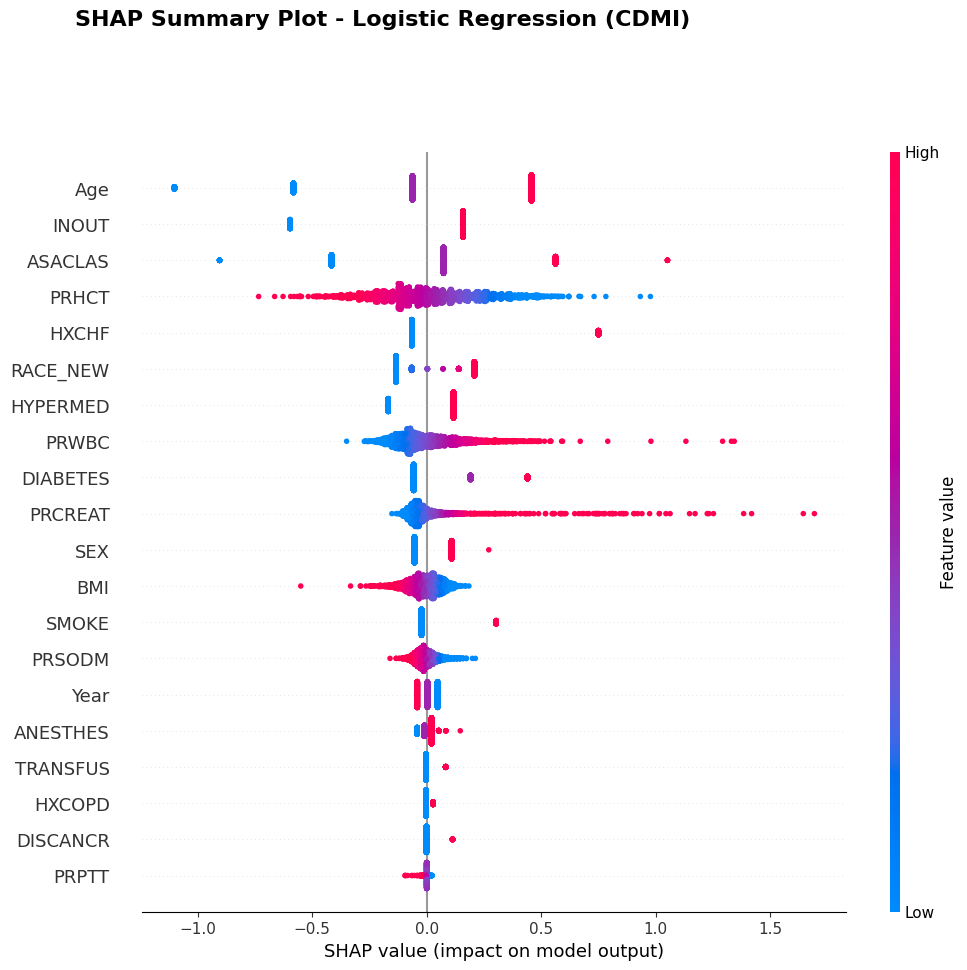

In [ ]:
explainer_LR_CDMI = shap.Explainer(log_reg_LR_CDMI, X_scaled_LR_CDMI)
shap_values_LR_CDMI = explainer_LR_CDMI(X_scaled_LR_CDMI)

feature_names = X_LR_CDMI.columns

plt.figure(figsize=(22, 10))

shap.summary_plot(shap_values_LR_CDMI, X_scaled_LR_CDMI, feature_names=feature_names, show=False)

plt.suptitle("SHAP Summary Plot - Logistic Regression (CDMI)", fontsize=16, fontweight="bold", y=1.05)

plt.subplots_adjust(top=0.90, right=1.3, bottom=0.1, left=0.2)

plt.show()

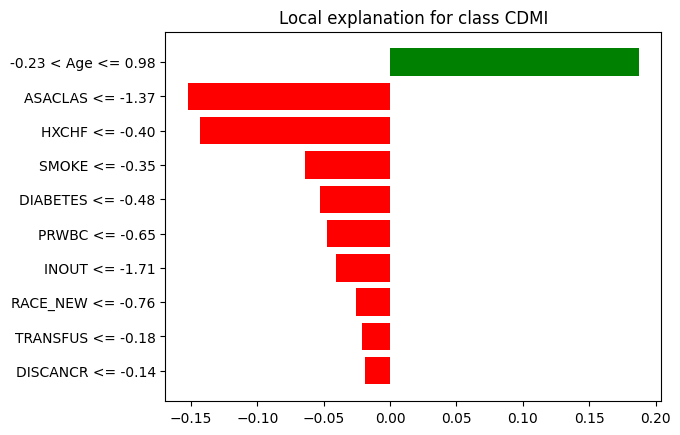

In [ ]:
explainer_LR_CDMI = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_scaled_LR_CDMI,
    feature_names=X_LR_CDMI.columns,
    class_names=['No CDMI', 'CDMI'],
    mode='classification'
)

i = np.random.randint(0, X_scaled_LR_CDMI.shape[0])
sample_instance = X_scaled_LR_CDMI[i]

explanation_LR_CDMI = explainer_LR_CDMI.explain_instance(
    sample_instance,
    log_reg_LR_CDMI.predict_proba,
    num_features=10
)


explanation_LR_CDMI.show_in_notebook()

fig = explanation_LR_CDMI.as_pyplot_figure()
plt.show()

## Combined

c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

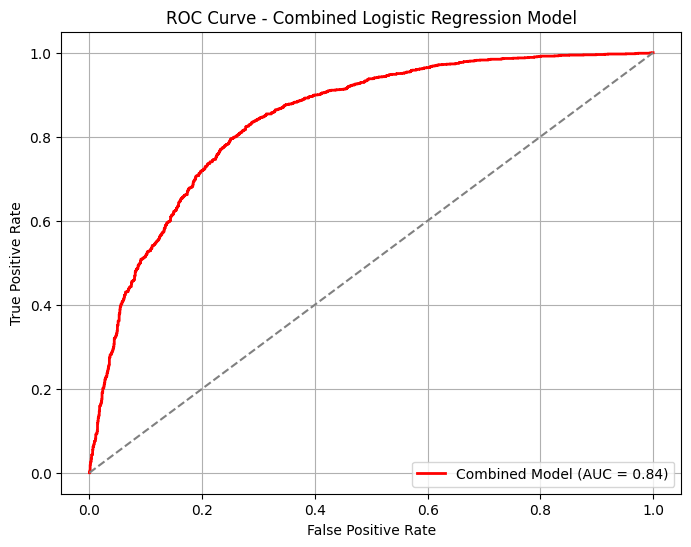

Combined Model Metrics: 
Accuracy: 0.7706
F1 Score: 0.7776
Recall: 0.8022
AUC Score: 0.8418
Precision: 0.7545


In [ ]:
X_LR_CA_resampled = df_hip_cleaned.drop(columns=['CDARREST', 'CDMI'])
y_LR_CA_resampled = df_hip_cleaned['CDARREST']


X_LR_CDMI_resampled = df1_hip_cleaned.drop(columns=['CDARREST', 'CDMI'])
y_LR_CDMI_resampled = df1_hip_cleaned['CDMI']

X_LR_Combined = np.concatenate((X_LR_CA_resampled, X_LR_CDMI_resampled), axis=0)
y_LR_Combined = np.concatenate((y_LR_CA_resampled, y_LR_CDMI_resampled), axis=0)


original_feature_names = X_LR_CA_resampled.columns.tolist()


X_LR_Combined_df = pd.DataFrame(X_LR_Combined, columns=original_feature_names)


log_reg_CA = LogisticRegression(max_iter=1000)
log_reg_CDMI = LogisticRegression(max_iter=1000)

voting_classifier_LR_Combined = VotingClassifier(estimators=[
    ('log_reg_CA', log_reg_CA),
    ('log_reg_CDMI', log_reg_CDMI)
], voting='soft')

voting_classifier_LR_Combined.fit(X_LR_Combined, y_LR_Combined)

y_pred_combined_labels = voting_classifier_LR_Combined.predict(X_LR_Combined)

accuracy_combined = accuracy_score(y_LR_Combined, y_pred_combined_labels)
f1_combined = f1_score(y_LR_Combined, y_pred_combined_labels)
recall_combined = recall_score(y_LR_Combined, y_pred_combined_labels)
precision_combined = precision_score(y_LR_Combined, y_pred_combined_labels)

y_pred_combined_prob = voting_classifier_LR_Combined.predict_proba(X_LR_Combined)[:, 1]
fpr_combined, tpr_combined, _ = roc_curve(y_LR_Combined, y_pred_combined_prob)
roc_auc_combined = auc(fpr_combined, tpr_combined)


plt.figure(figsize=(8, 6))
plt.plot(fpr_combined, tpr_combined, color='red', lw=2, label=f'Combined Model (AUC = {roc_auc_combined:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Combined Logistic Regression Model')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Print metrics for the combined model
print(f'Combined Model Metrics: ')
print(f'Accuracy: {accuracy_combined:.4f}')
print(f'F1 Score: {f1_combined:.4f}')
print(f'Recall: {recall_combined:.4f}')
print(f'AUC Score: {roc_auc_combined:.4f}')
print(f'Precision: {precision_combined:.4f}')

In [58]:
# Train the Logistic Regression models (replace with actual data and model training code)
log_reg_CA.fit(X_LR_CA_resampled, y_RF_CA_resampled)
log_reg_CDMI.fit(X_LR_CDMI_resampled, y_RF_CDMI_resampled)

c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.

LogisticRegression(max_iter=1000)

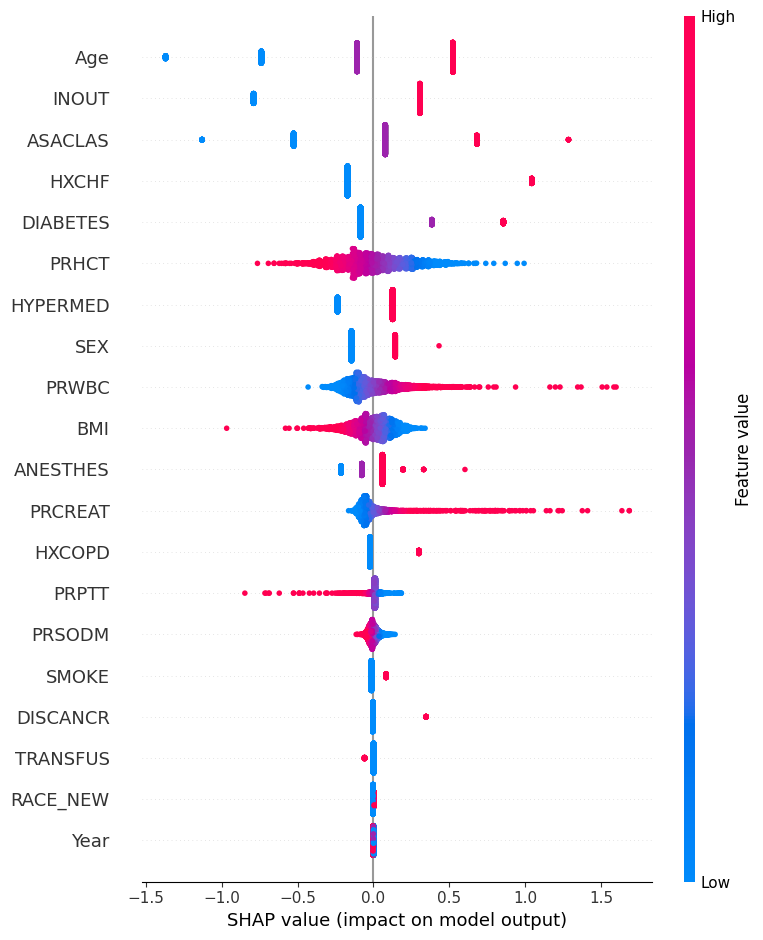

<Figure size 640x480 with 0 Axes>

In [59]:
# Create SHAP explainers for both Logistic Regression models using LinearExplainer
explainer_LR_CA = shap.LinearExplainer(log_reg_CA, X_LR_Combined_df)
explainer_LR_CDMI = shap.LinearExplainer(log_reg_CDMI, X_LR_Combined_df)

shap_values_LR_CA = explainer_LR_CA.shap_values(X_LR_Combined_df)
shap_values_LR_CDMI = explainer_LR_CDMI.shap_values(X_LR_Combined_df)

# Combine the SHAP values from both models (average or other aggregation methods)
shap_values_Combined = (shap_values_LR_CA + shap_values_LR_CDMI) / 2

# Ensure the SHAP values have the same shape as the features matrix
assert shap_values_Combined.shape[1] == X_LR_Combined_df.shape[1], \
    f"Shape mismatch: SHAP values ({shap_values_Combined.shape[1]} features) and data ({X_LR_Combined_df.shape[1]} features)"

# Visualize SHAP values for the combined model using the default plot (dot plot)
shap.summary_plot(shap_values_Combined, X_LR_Combined_df, plot_type="dot")

plt.suptitle('SHAP Summary Plot - Combined Logistic Regression Model', fontsize=16)
plt.show()

c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys wil

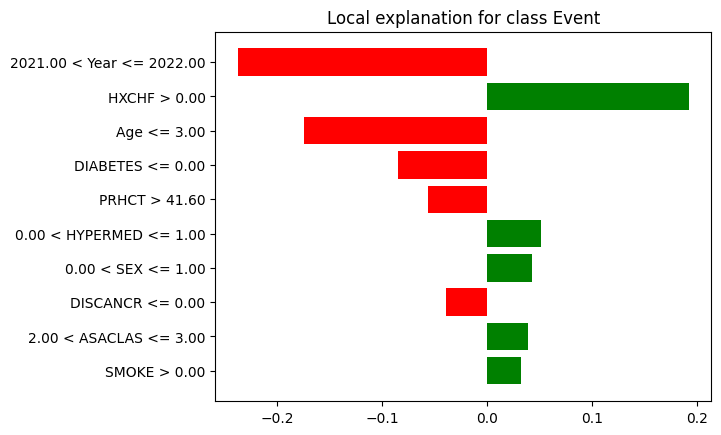

In [60]:
# Pick a random sample to explain
random_idx_LR_Combined = np.random.randint(0, X_LR_Combined.shape[0])
random_instance_LR_Combined = X_LR_Combined_df.iloc[random_idx_LR_Combined]

# Generate the LIME explanation for this instance
lime_explanation_LR_Combined = explainer_LIME.explain_instance(random_instance_LR_Combined, voting_classifier_LR_Combined.predict_proba, num_features=10)

# Visualize the explanation
lime_explanation_LR_Combined.show_in_notebook()  # This will display the explanation in a Jupyter notebook

lime_explanation_LR_Combined.as_pyplot_figure()
plt.show()

# Neural Network

## Cardiac Arrest

In [62]:
# Prepare the features and target variable
X_NN_CA = df_hip_cleaned.drop(['CDARREST', 'CDMI'], axis=1).values
y_NN_CA = df_hip_cleaned['CDARREST'].values

# Scale the features
scaler_NN_CA = StandardScaler()
X_scaled_NN_CA = scaler_NN_CA.fit_transform(X_NN_CA)

In [63]:
# Hyperparameter optimization using Optuna
study_NN_CA = optuna.create_study(direction='maximize')

def objective(trial):
    units_1 = trial.suggest_int('units_1', 64, 256)
    dropout_1 = trial.suggest_float('dropout_1', 0.2, 0.5)
    units_2 = trial.suggest_int('units_2', 32, 128)
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

    model_NN_CA = Sequential()
    model_NN_CA.add(Dense(units_1, input_dim=X_scaled_NN_CA.shape[1], activation='relu'))
    model_NN_CA.add(Dropout(dropout_1))
    model_NN_CA.add(Dense(units_2, activation='relu'))
    model_NN_CA.add(Dense(1, activation='sigmoid'))

    model_NN_CA.compile(optimizer=Adam(learning_rate=learning_rate),
                         loss='binary_crossentropy', metrics=['accuracy'])

    model_NN_CA.fit(X_scaled_NN_CA, y_NN_CA, epochs=10, batch_size=32, verbose=0)
    y_prob_NN_CA = model_NN_CA.predict(X_scaled_NN_CA).flatten()
    roc_auc_NN_CA = roc_auc_score(y_NN_CA, y_prob_NN_CA)

    return roc_auc_NN_CA

study_NN_CA.optimize(objective, n_trials=50)
best_params_NN_CA = study_NN_CA.best_params

# Build the model with the best parameters from Optuna
model_NN_CA = Sequential()
model_NN_CA.add(Dense(best_params_NN_CA['units_1'], input_dim=X_scaled_NN_CA.shape[1], activation='relu'))
model_NN_CA.add(Dropout(best_params_NN_CA['dropout_1']))
model_NN_CA.add(Dense(best_params_NN_CA['units_2'], activation='relu'))
model_NN_CA.add(Dense(1, activation='sigmoid'))

model_NN_CA.compile(optimizer=Adam(learning_rate=best_params_NN_CA['learning_rate']),
                     loss='binary_crossentropy', metrics=['accuracy'])

[I 2025-12-04 18:43:16,495] A new study created in memory with name: no-name-7ef3ca9f-d56c-4bf9-aa36-a6b23d4ce5e3
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:18,497] Trial 0 finished with value: 0.9078807134669911 and parameters: {'units_1': 149, 'dropout_1': 0.45102941481319736, 'units_2': 117, 'learning_rate': 0.0011671106553683608}. Best is trial 0 with value: 0.9078807134669911.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:19,993] Trial 1 finished with value: 0.6809432122101792 and parameters: {'units_1': 126, 'dropout_1': 0.49927823129492155, 'units_2': 79, 'learning_rate': 2.019439901023929e-05}. Best is trial 0 with value: 0.9078807134669911.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:21,513] Trial 2 finished with value: 0.9641557240242112 and parameters: {'units_1': 224, 'dropout_1': 0.2527321473605775, 'units_2': 84, 'learning_rate': 0.0049000824555055535}. Best is trial 2 with value: 0.9641557240242112.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:23,002] Trial 3 finished with value: 0.8208791650747049 and parameters: {'units_1': 256, 'dropout_1': 0.4284748991063521, 'units_2': 64, 'learning_rate': 1.4945780608582419e-05}. Best is trial 2 with value: 0.9641557240242112.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:24,475] Trial 4 finished with value: 0.8768977860001207 and parameters: {'units_1': 206, 'dropout_1': 0.4558012076274413, 'units_2': 107, 'learning_rate': 0.00018484568056823832}. Best is trial 2 with value: 0.9641557240242112.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:25,935] Trial 5 finished with value: 0.9052062176999336 and parameters: {'units_1': 177, 'dropout_1': 0.2947919300617217, 'units_2': 44, 'learning_rate': 0.0007210867314128182}. Best is trial 2 with value: 0.9641557240242112.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:43:27,500] Trial 6 finished with value: 0.9197500452452292 and parameters: {'units_1': 205, 'dropout_1': 0.46318904548399986, 'units_2': 101, 'learning_rate': 0.0014263211139791238}. Best is trial 2 with value: 0.9641557240242112.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-04 18:43:29,079] Trial 7 finished with value: 0.8170484023406865 and parameters: {'units_1': 160, 'dropout_1': 0.37759053146198174, 'units_2': 97, 'learning_rate': 1.833078810196187e-05}. Best is trial 2 with value: 0.9641557240242112.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:30,681] Trial 8 finished with value: 0.9018530434957468 and parameters: {'units_1': 253, 'dropout_1': 0.2869053513001286, 'units_2': 48, 'learning_rate': 0.000510766653908898}. Best is trial 2 with value: 0.9641557240242112.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:32,199] Trial 9 finished with value: 0.8726095437270003 and parameters: {'units_1': 79, 'dropout_1': 0.41724069490485705, 'units_2': 92, 'learning_rate': 0.0002401616788735207}. Best is trial 2 with value: 0.9641557240242112.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:33,846] Trial 10 finished with value: 0.9660560236481732 and parameters: {'units_1': 216, 'dropout_1': 0.21595091829320998, 'units_2': 126, 'learning_rate': 0.007025507334928011}. Best is trial 10 with value: 0.9660560236481732.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:35,294] Trial 11 finished with value: 0.9712089525226728 and parameters: {'units_1': 214, 'dropout_1': 0.20406451289385846, 'units_2': 126, 'learning_rate': 0.006445416080455755}. Best is trial 11 with value: 0.9712089525226728.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:36,758] Trial 12 finished with value: 0.967428462265479 and parameters: {'units_1': 224, 'dropout_1': 0.20207347400467396, 'units_2': 125, 'learning_rate': 0.007854514375431176}. Best is trial 11 with value: 0.9712089525226728.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:38,178] Trial 13 finished with value: 0.9673128355687828 and parameters: {'units_1': 188, 'dropout_1': 0.20230254657980723, 'units_2': 126, 'learning_rate': 0.002972146783503622}. Best is trial 11 with value: 0.9712089525226728.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:39,628] Trial 14 finished with value: 0.9592491302861509 and parameters: {'units_1': 233, 'dropout_1': 0.3195433437867896, 'units_2': 111, 'learning_rate': 0.008629965859100858}. Best is trial 11 with value: 0.9712089525226728.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:41,059] Trial 15 finished with value: 0.8703573367652677 and parameters: {'units_1': 131, 'dropout_1': 0.2508954317468386, 'units_2': 128, 'learning_rate': 0.00010204074482540391}. Best is trial 11 with value: 0.9712089525226728.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:42,476] Trial 16 finished with value: 0.9573236944237768 and parameters: {'units_1': 190, 'dropout_1': 0.24242397434349472, 'units_2': 72, 'learning_rate': 0.0038240722189318305}. Best is trial 11 with value: 0.9712089525226728.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:43,911] Trial 17 finished with value: 0.9475456976814333 and parameters: {'units_1': 238, 'dropout_1': 0.3681131139979035, 'units_2': 116, 'learning_rate': 0.0020602646276738075}. Best is trial 11 with value: 0.9712089525226728.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:45,310] Trial 18 finished with value: 0.8203110860865893 and parameters: {'units_1': 105, 'dropout_1': 0.33457254544367615, 'units_2': 56, 'learning_rate': 4.866737379607304e-05}. Best is trial 11 with value: 0.9712089525226728.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:46,710] Trial 19 finished with value: 0.9008375394638942 and parameters: {'units_1': 177, 'dropout_1': 0.2285009666060138, 'units_2': 33, 'learning_rate': 0.0007063634018045125}. Best is trial 11 with value: 0.9712089525226728.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:48,161] Trial 20 finished with value: 0.9588821412053329 and parameters: {'units_1': 238, 'dropout_1': 0.27663551883734916, 'units_2': 90, 'learning_rate': 0.009688678907718329}. Best is trial 11 with value: 0.9712089525226728.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:49,610] Trial 21 finished with value: 0.9600987351444832 and parameters: {'units_1': 192, 'dropout_1': 0.2045189769128698, 'units_2': 120, 'learning_rate': 0.0027095639816333223}. Best is trial 11 with value: 0.9712089525226728.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:51,341] Trial 22 finished with value: 0.9716312413279978 and parameters: {'units_1': 189, 'dropout_1': 0.20629828956491106, 'units_2': 106, 'learning_rate': 0.004097401695332275}. Best is trial 22 with value: 0.9716312413279978.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:52,783] Trial 23 finished with value: 0.965241609523618 and parameters: {'units_1': 211, 'dropout_1': 0.2630243557791475, 'units_2': 108, 'learning_rate': 0.005330288401778838}. Best is trial 22 with value: 0.9716312413279978.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:54,212] Trial 24 finished with value: 0.943373082105009 and parameters: {'units_1': 168, 'dropout_1': 0.22412121097663232, 'units_2': 104, 'learning_rate': 0.001657976170798769}. Best is trial 22 with value: 0.9716312413279978.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:55,678] Trial 25 finished with value: 0.9711084075690241 and parameters: {'units_1': 199, 'dropout_1': 0.20053663288327145, 'units_2': 118, 'learning_rate': 0.003988322996291379}. Best is trial 22 with value: 0.9716312413279978.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:43:57,115] Trial 26 finished with value: 0.9548100705825574 and parameters: {'units_1': 148, 'dropout_1': 0.30303767400209713, 'units_2': 114, 'learning_rate': 0.00364858079284547}. Best is trial 22 with value: 0.9716312413279978.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:58,543] Trial 27 finished with value: 0.9297844316193771 and parameters: {'units_1': 196, 'dropout_1': 0.23766442804327825, 'units_2': 97, 'learning_rate': 0.0010678427017723736}. Best is trial 22 with value: 0.9716312413279978.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:43:59,975] Trial 28 finished with value: 0.8963632890265236 and parameters: {'units_1': 169, 'dropout_1': 0.26907587103506253, 'units_2': 119, 'learning_rate': 0.00038290640133956284}. Best is trial 22 with value: 0.9716312413279978.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:01,387] Trial 29 finished with value: 0.9225049769752056 and parameters: {'units_1': 137, 'dropout_1': 0.23318927225369962, 'units_2': 118, 'learning_rate': 0.0010153814013770936}. Best is trial 22 with value: 0.9716312413279978.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:02,822] Trial 30 finished with value: 0.9438255343964286 and parameters: {'units_1': 150, 'dropout_1': 0.21825902439807818, 'units_2': 111, 'learning_rate': 0.002091765707272472}. Best is trial 22 with value: 0.9716312413279978.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:04,261] Trial 31 finished with value: 0.9731394156327293 and parameters: {'units_1': 224, 'dropout_1': 0.20932583538810767, 'units_2': 121, 'learning_rate': 0.00627602410539098}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:05,711] Trial 32 finished with value: 0.9642160509964006 and parameters: {'units_1': 220, 'dropout_1': 0.20025914504924666, 'units_2': 123, 'learning_rate': 0.005246008357662782}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:07,156] Trial 33 finished with value: 0.9672223451104989 and parameters: {'units_1': 206, 'dropout_1': 0.25347337618712246, 'units_2': 116, 'learning_rate': 0.005255724865023256}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:08,600] Trial 34 finished with value: 0.9696153150073397 and parameters: {'units_1': 232, 'dropout_1': 0.2228246885331602, 'units_2': 103, 'learning_rate': 0.002956613886757075}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:10,039] Trial 35 finished with value: 0.8179432524281606 and parameters: {'units_1': 248, 'dropout_1': 0.24440778087455076, 'units_2': 80, 'learning_rate': 1.03537414600313e-05}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:12,045] Trial 36 finished with value: 0.9644573588851575 and parameters: {'units_1': 198, 'dropout_1': 0.2199938661327532, 'units_2': 111, 'learning_rate': 0.0044828661158377355}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:44:13,505] Trial 37 finished with value: 0.9646081763156307 and parameters: {'units_1': 180, 'dropout_1': 0.2612735072634996, 'units_2': 123, 'learning_rate': 0.006320864469447842}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:14,945] Trial 38 finished with value: 0.9550111604898551 and parameters: {'units_1': 212, 'dropout_1': 0.3077546826526911, 'units_2': 85, 'learning_rate': 0.009785209125305649}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:44:16,406] Trial 39 finished with value: 0.9262402220032577 and parameters: {'units_1': 228, 'dropout_1': 0.49213867393639943, 'units_2': 98, 'learning_rate': 0.0021741579794380675}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:17,849] Trial 40 finished with value: 0.9270797723662249 and parameters: {'units_1': 243, 'dropout_1': 0.40349752479444556, 'units_2': 72, 'learning_rate': 0.0013686477555953731}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:44:19,279] Trial 41 finished with value: 0.9673329445595126 and parameters: {'units_1': 226, 'dropout_1': 0.2134272447664437, 'units_2': 106, 'learning_rate': 0.003194932436490612}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:20,731] Trial 42 finished with value: 0.9615365279816606 and parameters: {'units_1': 200, 'dropout_1': 0.22945481591173528, 'units_2': 100, 'learning_rate': 0.002708740385255709}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:22,172] Trial 43 finished with value: 0.9716161595849504 and parameters: {'units_1': 256, 'dropout_1': 0.21173349652624762, 'units_2': 103, 'learning_rate': 0.006094719644428392}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:23,622] Trial 44 finished with value: 0.9600132719338816 and parameters: {'units_1': 252, 'dropout_1': 0.2766994353516948, 'units_2': 112, 'learning_rate': 0.006392524807118559}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:25,055] Trial 45 finished with value: 0.9683685575820948 and parameters: {'units_1': 216, 'dropout_1': 0.2083566682999886, 'units_2': 93, 'learning_rate': 0.00399091915670211}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:26,513] Trial 46 finished with value: 0.9661716503448692 and parameters: {'units_1': 206, 'dropout_1': 0.20000164968091255, 'units_2': 121, 'learning_rate': 0.007450197470256253}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:27,964] Trial 47 finished with value: 0.8578595990267248 and parameters: {'units_1': 183, 'dropout_1': 0.2400338869510826, 'units_2': 127, 'learning_rate': 3.0770405885858837e-05}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:44:29,439] Trial 48 finished with value: 0.9655683806229766 and parameters: {'units_1': 255, 'dropout_1': 0.25317731966317986, 'units_2': 107, 'learning_rate': 0.004572465263127973}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:30,872] Trial 49 finished with value: 0.8824177039554384 and parameters: {'units_1': 166, 'dropout_1': 0.2135395939379651, 'units_2': 115, 'learning_rate': 0.00020148867756965576}. Best is trial 31 with value: 0.9731394156327293.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Fold ROC AUC: 0.8493 | Accuracy: 0.7039 | Precision: 0.6270 | Recall: 0.9294 | F1: 0.7488
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Fold ROC AUC: 0.8361 | Accuracy: 0.7598 | Precision: 0.7416 | Recall: 0.7674 | F1: 0.7543
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step  
Fold ROC AUC: 0.8554 | Accuracy: 0.7865 | Precision: 0.7347 | Recall: 0.8571 | F1: 0.7912
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Fold ROC AUC: 0.8328 | Accuracy: 0.7472 | Precision: 0.7227 | Recall: 0.8776 | F1: 0.7926
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-12-04 18:44:38,242] A new study created in memory with name: no-name-9836ee0d-df7e-4928-8961-8d181a0d678f


Fold ROC AUC: 0.8299 | Accuracy: 0.7360 | Precision: 0.6825 | Recall: 0.9247 | F1: 0.7854

Average metrics across all folds:
Average ROC AUC: 0.8407
Average Accuracy: 0.7467
Average Precision: 0.7017
Average Recall: 0.8713
Average F1 Score: 0.7745
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:39,672] Trial 0 finished with value: 0.9231384101831929 and parameters: {'units_1': 151, 'dropout_1': 0.47850283449613296, 'units_2': 41, 'learning_rate': 0.002699723571869151}. Best is trial 0 with value: 0.9231384101831929.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:41,528] Trial 1 finished with value: 0.8887369542922641 and parameters: {'units_1': 220, 'dropout_1': 0.32298844911508756, 'units_2': 77, 'learning_rate': 0.0003069943682164751}. Best is trial 0 with value: 0.9231384101831929.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:42,944] Trial 2 finished with value: 0.8649832089927404 and parameters: {'units_1': 95, 'dropout_1': 0.2066605381818912, 'units_2': 72, 'learning_rate': 0.00013740474056683123}. Best is trial 0 with value: 0.9231384101831929.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:44,379] Trial 3 finished with value: 0.7902431176979228 and parameters: {'units_1': 152, 'dropout_1': 0.297081941775726, 'units_2': 109, 'learning_rate': 1.51034155172275e-05}. Best is trial 0 with value: 0.9231384101831929.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:45,828] Trial 4 finished with value: 0.9536186128818194 and parameters: {'units_1': 252, 'dropout_1': 0.24913840560093603, 'units_2': 83, 'learning_rate': 0.0064966778607327726}. Best is trial 4 with value: 0.9536186128818194.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:47,277] Trial 5 finished with value: 0.9062267489794688 and parameters: {'units_1': 204, 'dropout_1': 0.418557912894847, 'units_2': 90, 'learning_rate': 0.0008427094616349929}. Best is trial 4 with value: 0.9536186128818194.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:48,701] Trial 6 finished with value: 0.7260652737839087 and parameters: {'units_1': 172, 'dropout_1': 0.29521214988713007, 'units_2': 49, 'learning_rate': 1.3844094638708711e-05}. Best is trial 4 with value: 0.9536186128818194.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:50,144] Trial 7 finished with value: 0.8359156628928792 and parameters: {'units_1': 97, 'dropout_1': 0.4499555850618097, 'units_2': 86, 'learning_rate': 6.0319261349811885e-05}. Best is trial 4 with value: 0.9536186128818194.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:51,560] Trial 8 finished with value: 0.9272004263106035 and parameters: {'units_1': 94, 'dropout_1': 0.3412155680955026, 'units_2': 111, 'learning_rate': 0.002957707322200941}. Best is trial 4 with value: 0.9536186128818194.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:52,975] Trial 9 finished with value: 0.8071145609201873 and parameters: {'units_1': 165, 'dropout_1': 0.3434949528811707, 'units_2': 57, 'learning_rate': 1.9539212186406612e-05}. Best is trial 4 with value: 0.9536186128818194.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-04 18:44:54,442] Trial 10 finished with value: 0.9707615274789357 and parameters: {'units_1': 252, 'dropout_1': 0.20061188780906894, 'units_2': 122, 'learning_rate': 0.006151047552706128}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:55,944] Trial 11 finished with value: 0.9666944841038428 and parameters: {'units_1': 256, 'dropout_1': 0.205910069576069, 'units_2': 127, 'learning_rate': 0.008322214439613312}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:57,397] Trial 12 finished with value: 0.9669357919925999 and parameters: {'units_1': 250, 'dropout_1': 0.20172851281855864, 'units_2': 125, 'learning_rate': 0.009009626334533104}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:44:58,843] Trial 13 finished with value: 0.9289599629994572 and parameters: {'units_1': 222, 'dropout_1': 0.25009847265206286, 'units_2': 127, 'learning_rate': 0.00098003514336829}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:00,298] Trial 14 finished with value: 0.9553379315892134 and parameters: {'units_1': 191, 'dropout_1': 0.24540174971328785, 'units_2': 108, 'learning_rate': 0.0026504707219821054}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:01,763] Trial 15 finished with value: 0.9200416256108105 and parameters: {'units_1': 236, 'dropout_1': 0.374429343265185, 'units_2': 101, 'learning_rate': 0.0009932673024481465}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:03,208] Trial 16 finished with value: 0.9605662691789499 and parameters: {'units_1': 194, 'dropout_1': 0.2765702324968683, 'units_2': 119, 'learning_rate': 0.007808721117167768}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:04,726] Trial 17 finished with value: 0.940472360192242 and parameters: {'units_1': 123, 'dropout_1': 0.38680153346269297, 'units_2': 98, 'learning_rate': 0.0037314760525897516}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:06,174] Trial 18 finished with value: 0.9123248004182669 and parameters: {'units_1': 233, 'dropout_1': 0.20427246764977716, 'units_2': 118, 'learning_rate': 0.0005562369057174483}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:07,624] Trial 19 finished with value: 0.9112338876711779 and parameters: {'units_1': 67, 'dropout_1': 0.2306772806607754, 'units_2': 65, 'learning_rate': 0.0016650012181273675}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:45:09,521] Trial 20 finished with value: 0.8802962054334493 and parameters: {'units_1': 212, 'dropout_1': 0.27970309602938603, 'units_2': 99, 'learning_rate': 0.00016522670296663643}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:45:11,039] Trial 21 finished with value: 0.9646584487924552 and parameters: {'units_1': 247, 'dropout_1': 0.20603982681416036, 'units_2': 127, 'learning_rate': 0.009477859353337021}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:12,530] Trial 22 finished with value: 0.9594351384504013 and parameters: {'units_1': 255, 'dropout_1': 0.224017790593285, 'units_2': 119, 'learning_rate': 0.005424650035211243}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:14,054] Trial 23 finished with value: 0.9603048522994632 and parameters: {'units_1': 234, 'dropout_1': 0.2606364785793036, 'units_2': 125, 'learning_rate': 0.009929883769923094}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:15,526] Trial 24 finished with value: 0.9668352470389511 and parameters: {'units_1': 256, 'dropout_1': 0.225581022104965, 'units_2': 115, 'learning_rate': 0.004318264238334607}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:17,037] Trial 25 finished with value: 0.947691487864224 and parameters: {'units_1': 235, 'dropout_1': 0.2290499442181582, 'units_2': 113, 'learning_rate': 0.0016169070694459578}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:18,464] Trial 26 finished with value: 0.9611142391763356 and parameters: {'units_1': 190, 'dropout_1': 0.23005381857727644, 'units_2': 104, 'learning_rate': 0.003987555172425101}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:19,915] Trial 27 finished with value: 0.9413571557843513 and parameters: {'units_1': 220, 'dropout_1': 0.31460974692114696, 'units_2': 91, 'learning_rate': 0.0018548849137013414}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:21,358] Trial 28 finished with value: 0.9642512417301776 and parameters: {'units_1': 243, 'dropout_1': 0.2685624794284881, 'units_2': 117, 'learning_rate': 0.004968499559178572}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:22,761] Trial 29 finished with value: 0.9090973074061413 and parameters: {'units_1': 132, 'dropout_1': 0.49575442099124384, 'units_2': 35, 'learning_rate': 0.0022656856802799616}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:45:24,196] Trial 30 finished with value: 0.8946791610529067 and parameters: {'units_1': 179, 'dropout_1': 0.23013743665587694, 'units_2': 93, 'learning_rate': 0.0004486618013106885}. Best is trial 10 with value: 0.9707615274789357.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:25,655] Trial 31 finished with value: 0.9756379577309015 and parameters: {'units_1': 256, 'dropout_1': 0.20048396169911956, 'units_2': 122, 'learning_rate': 0.0059388199258773745}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:27,113] Trial 32 finished with value: 0.9665235576826399 and parameters: {'units_1': 228, 'dropout_1': 0.20065221983544673, 'units_2': 122, 'learning_rate': 0.004595357585548656}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:45:28,545] Trial 33 finished with value: 0.969549960787468 and parameters: {'units_1': 243, 'dropout_1': 0.21972532007526832, 'units_2': 114, 'learning_rate': 0.0061044101060108965}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:30,010] Trial 34 finished with value: 0.96528685475276 and parameters: {'units_1': 206, 'dropout_1': 0.21787368003970606, 'units_2': 106, 'learning_rate': 0.006089120753850213}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:31,443] Trial 35 finished with value: 0.958746405517907 and parameters: {'units_1': 245, 'dropout_1': 0.24323623824330692, 'units_2': 75, 'learning_rate': 0.0029170845856590173}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:32,876] Trial 36 finished with value: 0.8839962597277242 and parameters: {'units_1': 215, 'dropout_1': 0.298892254149678, 'units_2': 113, 'learning_rate': 0.0002344515455492502}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:34,300] Trial 37 finished with value: 0.874529952341692 and parameters: {'units_1': 242, 'dropout_1': 0.2549272888417775, 'units_2': 122, 'learning_rate': 8.217566206663546e-05}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:35,727] Trial 38 finished with value: 0.9440366787990911 and parameters: {'units_1': 226, 'dropout_1': 0.2157356909279109, 'units_2': 123, 'learning_rate': 0.0012124938762290592}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:37,208] Trial 39 finished with value: 0.9418096080757707 and parameters: {'units_1': 244, 'dropout_1': 0.44960989452271627, 'units_2': 109, 'learning_rate': 0.007142463218968483}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:45:38,638] Trial 40 finished with value: 0.9015162179010237 and parameters: {'units_1': 203, 'dropout_1': 0.2434525015863238, 'units_2': 68, 'learning_rate': 0.0005842172050142139}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:40,098] Trial 41 finished with value: 0.9678909690522634 and parameters: {'units_1': 256, 'dropout_1': 0.21650449910414835, 'units_2': 115, 'learning_rate': 0.0033991867213457967}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step


[I 2025-12-04 18:45:42,078] Trial 42 finished with value: 0.9657795250256389 and parameters: {'units_1': 250, 'dropout_1': 0.2153140612059159, 'units_2': 114, 'learning_rate': 0.0034544354224406997}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:43,543] Trial 43 finished with value: 0.9626023044903377 and parameters: {'units_1': 239, 'dropout_1': 0.2374885256367158, 'units_2': 122, 'learning_rate': 0.006005118456235193}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:44,998] Trial 44 finished with value: 0.9596965553298878 and parameters: {'units_1': 256, 'dropout_1': 0.20145618932339862, 'units_2': 105, 'learning_rate': 0.009937068477421008}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:46,459] Trial 45 finished with value: 0.9719580124273564 and parameters: {'units_1': 227, 'dropout_1': 0.21811399625843123, 'units_2': 128, 'learning_rate': 0.006886618629566968}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:47,909] Trial 46 finished with value: 0.9546140079229424 and parameters: {'units_1': 226, 'dropout_1': 0.265537404340404, 'units_2': 128, 'learning_rate': 0.0024839336457959543}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:49,360] Trial 47 finished with value: 0.9543425365480906 and parameters: {'units_1': 147, 'dropout_1': 0.2933090360756856, 'units_2': 110, 'learning_rate': 0.0064762055565790065}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:50,793] Trial 48 finished with value: 0.950451446841883 and parameters: {'units_1': 216, 'dropout_1': 0.21699845924410838, 'units_2': 85, 'learning_rate': 0.002052395559599361}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:45:52,226] Trial 49 finished with value: 0.9635323453115888 and parameters: {'units_1': 233, 'dropout_1': 0.25564740373497036, 'units_2': 96, 'learning_rate': 0.0034475089923958306}. Best is trial 31 with value: 0.9756379577309015.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

Average metrics across all folds:
Average ROC AUC: 0.9410
Average Accuracy: 0.8768
Average Precision: 0.8502
Average Recall: 0.9161
Average F1 Score: 0.8809


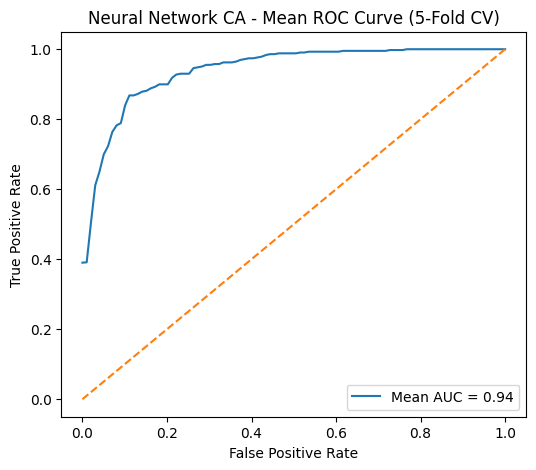

In [64]:
# K-fold Cross-validation with additional metrics for Neural Network with CA
kf_NN_CA = KFold(n_splits=5, shuffle=True, random_state=42)

roc_auc_scores_NN_CA = []
accuracy_scores_NN_CA = []
precision_scores_NN_CA = []
recall_scores_NN_CA = []
f1_scores_NN_CA = []

fpr_list_NN_CA, tpr_list_NN_CA = [], []

for train_index, test_index in kf_NN_CA.split(X_NN_CA):
    X_train_NN_CA, X_test_NN_CA = X_NN_CA[train_index], X_NN_CA[test_index]
    y_train_NN_CA, y_test_NN_CA = y_NN_CA[train_index], y_NN_CA[test_index]

    model_NN_CA.fit(X_train_NN_CA, y_train_NN_CA, epochs=20, batch_size=32, verbose=0)
    y_prob_NN_CA = model_NN_CA.predict(X_test_NN_CA).flatten()
    y_pred_NN_CA = (y_prob_NN_CA > 0.5).astype(int)

    fpr_NN_CA, tpr_NN_CA, _ = roc_curve(y_test_NN_CA, y_prob_NN_CA)
    roc_auc_NN_CA = roc_auc_score(y_test_NN_CA, y_prob_NN_CA)

    fpr_list_NN_CA.append(fpr_NN_CA)
    tpr_list_NN_CA.append(tpr_NN_CA)
    roc_auc_scores_NN_CA.append(roc_auc_NN_CA)

    accuracy_NN_CA = accuracy_score(y_test_NN_CA, y_pred_NN_CA)
    precision_NN_CA = precision_score(y_test_NN_CA, y_pred_NN_CA)
    recall_NN_CA = recall_score(y_test_NN_CA, y_pred_NN_CA)
    f1_NN_CA = f1_score(y_test_NN_CA, y_pred_NN_CA)

    accuracy_scores_NN_CA.append(accuracy_NN_CA)
    precision_scores_NN_CA.append(precision_NN_CA)
    recall_scores_NN_CA.append(recall_NN_CA)
    f1_scores_NN_CA.append(f1_NN_CA)

    print(f"Fold ROC AUC: {roc_auc_NN_CA:.4f} | Accuracy: {accuracy_NN_CA:.4f} | Precision: {precision_NN_CA:.4f} | Recall: {recall_NN_CA:.4f} | F1: {f1_NN_CA:.4f}")

# Average ROC metrics across folds
mean_fpr_NN_CA = np.linspace(0, 1, 100)
mean_tpr_NN_CA = np.zeros_like(mean_fpr_NN_CA)

# Interpolating ROC curves
for fpr_NN_CA, tpr_NN_CA in zip(fpr_list_NN_CA, tpr_list_NN_CA):
    mean_tpr_NN_CA += np.interp(mean_fpr_NN_CA, fpr_NN_CA, tpr_NN_CA)

mean_tpr_NN_CA /= len(fpr_list_NN_CA)
mean_roc_auc_NN_CA = np.mean(roc_auc_scores_NN_CA)

# Calculate the mean of other metrics
mean_accuracy_NN_CA = np.mean(accuracy_scores_NN_CA)
mean_precision_NN_CA = np.mean(precision_scores_NN_CA)
mean_recall_NN_CA = np.mean(recall_scores_NN_CA)
mean_f1_NN_CA = np.mean(f1_scores_NN_CA)

print(f"\nAverage metrics across all folds:")
print(f"Average ROC AUC: {mean_roc_auc_NN_CA:.4f}")
print(f"Average Accuracy: {mean_accuracy_NN_CA:.4f}")
print(f"Average Precision: {mean_precision_NN_CA:.4f}")
print(f"Average Recall: {mean_recall_NN_CA:.4f}")
print(f"Average F1 Score: {mean_f1_NN_CA:.4f}")

# Feature scaling
scaler_NN_CA = StandardScaler()
X_scaled_NN_CA = scaler_NN_CA.fit_transform(X_NN_CA)

# Model creation for Neural Network with CA (NN_CA)
model_NN_CA = Sequential()
model_NN_CA.add(Dense(units=128, input_dim=X_scaled_NN_CA.shape[1], activation='relu'))
model_NN_CA.add(Dropout(0.2))
model_NN_CA.add(Dense(units=64, activation='relu'))
model_NN_CA.add(Dense(1, activation='sigmoid'))

model_NN_CA.compile(optimizer=Adam(learning_rate=0.001),
                     loss='binary_crossentropy', metrics=['accuracy'])

# Hyperparameter optimization with Optuna for NN_CA model
def optimize_nn_CA_with_optuna():
    def objective(trial):
        units_1 = trial.suggest_int('units_1', 64, 256)
        dropout_1 = trial.suggest_float('dropout_1', 0.2, 0.5)
        units_2 = trial.suggest_int('units_2', 32, 128)
        learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

        model_NN_CA = Sequential()
        model_NN_CA.add(Dense(units=units_1, input_dim=X_scaled_NN_CA.shape[1], activation='relu'))
        model_NN_CA.add(Dropout(dropout_1))
        model_NN_CA.add(Dense(units=units_2, activation='relu'))
        model_NN_CA.add(Dense(1, activation='sigmoid'))

        model_NN_CA.compile(optimizer=Adam(learning_rate=learning_rate),
                             loss='binary_crossentropy', metrics=['accuracy'])
        model_NN_CA.fit(X_scaled_NN_CA, y_NN_CA, epochs=10, batch_size=32, verbose=0)
        y_prob_NN_CA = model_NN_CA.predict(X_scaled_NN_CA).flatten()
        roc_auc_NN_CA = roc_auc_score(y_NN_CA, y_prob_NN_CA)

        return roc_auc_NN_CA

    study_NN_CA = optuna.create_study(direction='maximize')
    study_NN_CA.optimize(objective, n_trials=50)

    return study_NN_CA.best_params

# Run K-fold cross-validation and metrics calculation for Neural Network CA model
best_params_NN_CA = optimize_nn_CA_with_optuna()
model_NN_CA = Sequential()
model_NN_CA.add(Dense(units=best_params_NN_CA['units_1'], input_dim=X_scaled_NN_CA.shape[1], activation='relu'))
model_NN_CA.add(Dropout(best_params_NN_CA['dropout_1']))
model_NN_CA.add(Dense(units=best_params_NN_CA['units_2'], activation='relu'))
model_NN_CA.add(Dense(1, activation='sigmoid'))

model_NN_CA.compile(optimizer=Adam(learning_rate=best_params_NN_CA['learning_rate']),
                     loss='binary_crossentropy', metrics=['accuracy'])

# K-fold cross-validation with NN_CA
kf_NN_CA = KFold(n_splits=5, shuffle=True, random_state=42)

roc_auc_scores_NN_CA = []
accuracy_scores_NN_CA = []
precision_scores_NN_CA = []
recall_scores_NN_CA = []
f1_scores_NN_CA = []

fpr_list_NN_CA, tpr_list_NN_CA = [], []

for train_index, test_index in kf_NN_CA.split(X_scaled_NN_CA):
    X_train_NN_CA, X_test_NN_CA = X_scaled_NN_CA[train_index], X_scaled_NN_CA[test_index]
    y_train_NN_CA, y_test_NN_CA = y_NN_CA[train_index], y_NN_CA[test_index]

    model_NN_CA.fit(X_train_NN_CA, y_train_NN_CA, epochs=20, batch_size=32, verbose=0)
    y_prob_NN_CA = model_NN_CA.predict(X_test_NN_CA).flatten()
    y_pred_NN_CA = (y_prob_NN_CA > 0.5).astype(int)

    fpr_NN_CA, tpr_NN_CA, _ = roc_curve(y_test_NN_CA, y_prob_NN_CA)
    roc_auc_NN_CA = roc_auc_score(y_test_NN_CA, y_prob_NN_CA)

    fpr_list_NN_CA.append(fpr_NN_CA)
    tpr_list_NN_CA.append(tpr_NN_CA)
    roc_auc_scores_NN_CA.append(roc_auc_NN_CA)

    accuracy_NN_CA = accuracy_score(y_test_NN_CA, y_pred_NN_CA)
    precision_NN_CA = precision_score(y_test_NN_CA, y_pred_NN_CA)
    recall_NN_CA = recall_score(y_test_NN_CA, y_pred_NN_CA)
    f1_NN_CA = f1_score(y_test_NN_CA, y_pred_NN_CA)

    accuracy_scores_NN_CA.append(accuracy_NN_CA)
    precision_scores_NN_CA.append(precision_NN_CA)
    recall_scores_NN_CA.append(recall_NN_CA)
    f1_scores_NN_CA.append(f1_NN_CA)

mean_fpr_NN_CA = np.linspace(0, 1, 100)
mean_tpr_NN_CA = np.zeros_like(mean_fpr_NN_CA)

for fpr_NN_CA, tpr_NN_CA in zip(fpr_list_NN_CA, tpr_list_NN_CA):
    mean_tpr_NN_CA += np.interp(mean_fpr_NN_CA, fpr_NN_CA, tpr_NN_CA)

mean_tpr_NN_CA /= len(fpr_list_NN_CA)
mean_roc_auc_NN_CA = np.mean(roc_auc_scores_NN_CA)

mean_accuracy_NN_CA = np.mean(accuracy_scores_NN_CA)
mean_precision_NN_CA = np.mean(precision_scores_NN_CA)
mean_recall_NN_CA = np.mean(recall_scores_NN_CA)
mean_f1_NN_CA = np.mean(f1_scores_NN_CA)

print(f"\nAverage metrics across all folds:")
print(f"Average ROC AUC: {mean_roc_auc_NN_CA:.4f}")
print(f"Average Accuracy: {mean_accuracy_NN_CA:.4f}")
print(f"Average Precision: {mean_precision_NN_CA:.4f}")
print(f"Average Recall: {mean_recall_NN_CA:.4f}")
print(f"Average F1 Score: {mean_f1_NN_CA:.4f}")

# Plot ROC curve
plt.figure(figsize=(6, 5))
plt.plot(mean_fpr_NN_CA, mean_tpr_NN_CA, label=f'Mean AUC = {mean_roc_auc_NN_CA:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Neural Network CA - Mean ROC Curve (5-Fold CV)')
plt.legend()
plt.show()

In [ ]:
feature_names_NN_CA = df_hip_cleaned.drop(columns=["CDARREST", "CDMI"]).columns.tolist()

# Create the plot with proper parameters
plt.figure(figsize=(18, 10))
shap.summary_plot(
    shap_values_NN_CA,
    X_scaled_NN_CA,
    feature_names=feature_names_NN_CA,
    plot_type="bar",
    max_display=20,
    show=False
)


In [ ]:
# Generate SHAP values
background = X_scaled_NN_CA[np.random.choice(X_scaled_NN_CA.shape[0], 100, replace=False)]
explainer = shap.DeepExplainer(model_NN_CA, background)
shap_values = explainer.shap_values(X_scaled_NN_CA)

# For binary classification, shap_values is a list with one element
if isinstance(shap_values, list):
    shap_values = shap_values[0]

# Reshape the 3D array to 2D by removing the last dimension
shap_values_2d = shap_values.reshape(shap_values.shape[0], shap_values.shape[1])
print(f"Reshaped SHAP values from {shap_values.shape} to {shap_values_2d.shape}")

# Now create the summary plot with the reshaped values
shap.summary_plot(shap_values_2d, X_scaled_NN_CA, feature_names=feature_names_NN_CA)

# Also create a DataFrame for analysis
shap_df = pd.DataFrame(shap_values_2d, columns=feature_names_NN_CA)

# Calculate and print feature importance
feature_importance = np.abs(shap_df).mean().sort_values(ascending=False)
print("\nFeature importance ranking:")
for feature, importance in feature_importance.items():
    print(f"{feature}: {importance:.4f}")

In [ ]:
print(X_scaled_NN_CA.shape)

(892, 26)


In [ ]:
def explain_with_lime_NN_CA(model, X_train, X_test, feature_names):
    explainer = LimeTabularExplainer(
        X_train,
        feature_names=feature_names,
        class_names=['No Cardiac Arrest', 'Cardiac Arrest'],
        mode='classification'
    )

    instance = X_test[0].reshape(1, -1)

    def predict_fn(X):
        return np.hstack([1 - model.predict(X), model.predict(X)])

    explanation = explainer.explain_instance(instance.flatten(), predict_fn, num_features=10)
k
    explanation.show_in_notebook(show_table=True, show_all=False)

    fig = explanation.as_pyplot_figure()
    plt.show()

explain_with_lime_NN_CA(model_NN_CA, X_scaled_NN_CA, X_scaled_NN_CA, feature_names_NN_CA)

## CDMI

In [75]:
# Prepare the features and target variable
X_NN_CDMI = df_hip_cleaned.drop(['CDARREST', 'CDMI'], axis=1).values
y_NN_CDMI = df_hip_cleaned['CDMI'].values

# Scale the features
scaler_NN_CDMI = StandardScaler()
X_scaled_NN_CDMI = scaler_NN_CDMI.fit_transform(X_NN_CDMI)

In [76]:
# Hyperparameter optimization using Optuna
study_NN_CDMI = optuna.create_study(direction='maximize')

def objective(trial):
    units_1 = trial.suggest_int('units_1', 64, 256)
    dropout_1 = trial.suggest_float('dropout_1', 0.2, 0.5)
    units_2 = trial.suggest_int('units_2', 32, 128)
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

    model_NN_CDMI = Sequential()
    model_NN_CDMI.add(Dense(units_1, input_dim=X_scaled_NN_CDMI.shape[1], activation='relu'))
    model_NN_CDMI.add(Dropout(dropout_1))
    model_NN_CDMI.add(Dense(units_2, activation='relu'))
    model_NN_CDMI.add(Dense(1, activation='sigmoid'))

    model_NN_CDMI.compile(optimizer=Adam(learning_rate=learning_rate),
                          loss='binary_crossentropy', metrics=['accuracy'])

    model_NN_CDMI.fit(X_scaled_NN_CDMI, y_NN_CDMI, epochs=10, batch_size=32, verbose=0)
    y_prob_NN_CDMI = model_NN_CDMI.predict(X_scaled_NN_CDMI).flatten()
    roc_auc_NN_CDMI = roc_auc_score(y_NN_CDMI, y_prob_NN_CDMI)

    return roc_auc_NN_CDMI

study_NN_CDMI.optimize(objective, n_trials=50)
best_params_NN_CDMI = study_NN_CDMI.best_params

# Build the model with the best parameters from Optuna
model_NN_CDMI = Sequential()
model_NN_CDMI.add(Dense(best_params_NN_CDMI['units_1'], input_dim=X_scaled_NN_CDMI.shape[1], activation='relu'))
model_NN_CDMI.add(Dropout(best_params_NN_CDMI['dropout_1']))
model_NN_CDMI.add(Dense(best_params_NN_CDMI['units_2'], activation='relu'))
model_NN_CDMI.add(Dense(1, activation='sigmoid'))

model_NN_CDMI.compile(optimizer=Adam(learning_rate=best_params_NN_CDMI['learning_rate']),
                      loss='binary_crossentropy', metrics=['accuracy'])

[I 2025-12-04 18:55:24,248] A new study created in memory with name: no-name-847c3291-2007-4fdb-8135-fe23b43bb4f1
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:25,748] Trial 0 finished with value: 0.7381313749490004 and parameters: {'units_1': 125, 'dropout_1': 0.4037316602467266, 'units_2': 103, 'learning_rate': 0.00018974051197913382}. Best is trial 0 with value: 0.7381313749490004.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:27,246] Trial 1 finished with value: 0.978392492860057 and parameters: {'units_1': 229, 'dropout_1': 0.27909396162816, 'units_2': 119, 'learning_rate': 0.005287168079979375}. Best is trial 1 with value: 0.978392492860057.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:28,727] Trial 2 finished with value: 0.5545002039983681 and parameters: {'units_1': 214, 'dropout_1': 0.3005317251537356, 'units_2': 121, 'learning_rate': 6.904263489011548e-05}. Best is trial 1 with value: 0.978392492860057.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:30,141] Trial 3 finished with value: 0.9557568339453284 and parameters: {'units_1': 64, 'dropout_1': 0.3374520185764931, 'units_2': 96, 'learning_rate': 0.0048296106119486565}. Best is trial 1 with value: 0.978392492860057.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:31,584] Trial 4 finished with value: 0.8083394532843737 and parameters: {'units_1': 76, 'dropout_1': 0.4714731626271211, 'units_2': 88, 'learning_rate': 0.0005658522467811624}. Best is trial 1 with value: 0.978392492860057.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:33,014] Trial 5 finished with value: 0.9022276621787025 and parameters: {'units_1': 93, 'dropout_1': 0.47427612814645514, 'units_2': 64, 'learning_rate': 0.002503625473912009}. Best is trial 1 with value: 0.978392492860057.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:34,464] Trial 6 finished with value: 0.8137902896776826 and parameters: {'units_1': 209, 'dropout_1': 0.42977600209833805, 'units_2': 124, 'learning_rate': 0.0003329139431234734}. Best is trial 1 with value: 0.978392492860057.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:35,898] Trial 7 finished with value: 0.4543778049775602 and parameters: {'units_1': 203, 'dropout_1': 0.46204463642764965, 'units_2': 35, 'learning_rate': 1.1280980792047476e-05}. Best is trial 1 with value: 0.978392492860057.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:37,351] Trial 8 finished with value: 0.7042839657282742 and parameters: {'units_1': 208, 'dropout_1': 0.38332791429582314, 'units_2': 40, 'learning_rate': 0.00011776018251534393}. Best is trial 1 with value: 0.978392492860057.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:38,846] Trial 9 finished with value: 0.9753733170134639 and parameters: {'units_1': 254, 'dropout_1': 0.2191560793986826, 'units_2': 67, 'learning_rate': 0.0030354854411917443}. Best is trial 1 with value: 0.978392492860057.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:55:40,309] Trial 10 finished with value: 0.9125091799265607 and parameters: {'units_1': 159, 'dropout_1': 0.2440185863597964, 'units_2': 112, 'learning_rate': 0.0009865797918516101}. Best is trial 1 with value: 0.978392492860057.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:41,771] Trial 11 finished with value: 0.9801060791513668 and parameters: {'units_1': 250, 'dropout_1': 0.20965723350576326, 'units_2': 70, 'learning_rate': 0.009835799468538358}. Best is trial 11 with value: 0.9801060791513668.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:43,247] Trial 12 finished with value: 0.9774785801713586 and parameters: {'units_1': 250, 'dropout_1': 0.2783264768566567, 'units_2': 72, 'learning_rate': 0.009943232400523637}. Best is trial 11 with value: 0.9801060791513668.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:44,714] Trial 13 finished with value: 0.9905997552019583 and parameters: {'units_1': 173, 'dropout_1': 0.20377855312496207, 'units_2': 53, 'learning_rate': 0.009883742142025389}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:46,145] Trial 14 finished with value: 0.9246185230518156 and parameters: {'units_1': 171, 'dropout_1': 0.20458537705965454, 'units_2': 52, 'learning_rate': 0.0013653083115672455}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:55:47,610] Trial 15 finished with value: 0.9797796817625459 and parameters: {'units_1': 171, 'dropout_1': 0.2495762772775029, 'units_2': 51, 'learning_rate': 0.007079852467476694}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:49,064] Trial 16 finished with value: 0.578343533251734 and parameters: {'units_1': 133, 'dropout_1': 0.3266848975138698, 'units_2': 81, 'learning_rate': 3.302393182595756e-05}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:50,528] Trial 17 finished with value: 0.9454916360669114 and parameters: {'units_1': 189, 'dropout_1': 0.20299010099132483, 'units_2': 52, 'learning_rate': 0.0018197069717455253}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:55:51,977] Trial 18 finished with value: 0.9785883312933497 and parameters: {'units_1': 128, 'dropout_1': 0.24857174256042144, 'units_2': 57, 'learning_rate': 0.009881665802103493}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:53,429] Trial 19 finished with value: 0.8738147694818441 and parameters: {'units_1': 236, 'dropout_1': 0.3683983428552863, 'units_2': 76, 'learning_rate': 0.0006901785548122112}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:54,881] Trial 20 finished with value: 0.9621542227662179 and parameters: {'units_1': 151, 'dropout_1': 0.30903839026230256, 'units_2': 43, 'learning_rate': 0.0035654158589214203}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:56,335] Trial 21 finished with value: 0.9901917584659323 and parameters: {'units_1': 185, 'dropout_1': 0.23967974897861066, 'units_2': 60, 'learning_rate': 0.006659070975573376}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:57,813] Trial 22 finished with value: 0.9741493268053856 and parameters: {'units_1': 188, 'dropout_1': 0.22555903053081378, 'units_2': 62, 'learning_rate': 0.0050470709082806944}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:55:59,296] Trial 23 finished with value: 0.9754304365565075 and parameters: {'units_1': 228, 'dropout_1': 0.2775352741172283, 'units_2': 85, 'learning_rate': 0.00989951300244622}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:00,748] Trial 24 finished with value: 0.9759934720522235 and parameters: {'units_1': 187, 'dropout_1': 0.22568985723282062, 'units_2': 69, 'learning_rate': 0.002352167426883681}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:02,196] Trial 25 finished with value: 0.9646511627906977 and parameters: {'units_1': 108, 'dropout_1': 0.25692138470072967, 'units_2': 46, 'learning_rate': 0.004186440606379099}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:03,634] Trial 26 finished with value: 0.9266911464708283 and parameters: {'units_1': 141, 'dropout_1': 0.22758280092121558, 'units_2': 32, 'learning_rate': 0.00157245258897013}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:05,105] Trial 27 finished with value: 0.978392492860057 and parameters: {'units_1': 167, 'dropout_1': 0.26552354679420015, 'units_2': 59, 'learning_rate': 0.005646729600384781}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:06,564] Trial 28 finished with value: 0.980922072623419 and parameters: {'units_1': 184, 'dropout_1': 0.20192947575901876, 'units_2': 74, 'learning_rate': 0.007659812092276082}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:08,046] Trial 29 finished with value: 0.790126478988168 and parameters: {'units_1': 181, 'dropout_1': 0.3005608318681392, 'units_2': 96, 'learning_rate': 0.00020520970680967986}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:09,498] Trial 30 finished with value: 0.9087719298245613 and parameters: {'units_1': 150, 'dropout_1': 0.23683192467503522, 'units_2': 78, 'learning_rate': 0.0009312218412240298}. Best is trial 13 with value: 0.9905997552019583.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:10,961] Trial 31 finished with value: 0.9919869441044471 and parameters: {'units_1': 198, 'dropout_1': 0.20450282483657123, 'units_2': 73, 'learning_rate': 0.007415449074434412}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step


[I 2025-12-04 18:56:14,162] Trial 32 finished with value: 0.9888045695634435 and parameters: {'units_1': 197, 'dropout_1': 0.20516112073208814, 'units_2': 57, 'learning_rate': 0.006589521756770263}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:15,663] Trial 33 finished with value: 0.979812321501428 and parameters: {'units_1': 199, 'dropout_1': 0.23261921242611394, 'units_2': 58, 'learning_rate': 0.003391768427830856}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:17,163] Trial 34 finished with value: 0.9876621787025703 and parameters: {'units_1': 221, 'dropout_1': 0.26799432641576193, 'units_2': 47, 'learning_rate': 0.0063335454578041656}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:18,664] Trial 35 finished with value: 0.9846593227254181 and parameters: {'units_1': 198, 'dropout_1': 0.21903989352314807, 'units_2': 55, 'learning_rate': 0.00447960656039562}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:20,160] Trial 36 finished with value: 0.9722399020807833 and parameters: {'units_1': 218, 'dropout_1': 0.20111317835564949, 'units_2': 64, 'learning_rate': 0.002248178614228782}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:21,625] Trial 37 finished with value: 0.8356752345981232 and parameters: {'units_1': 177, 'dropout_1': 0.42575738327770335, 'units_2': 38, 'learning_rate': 0.0004737749094579168}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:23,095] Trial 38 finished with value: 0.9851978784169726 and parameters: {'units_1': 162, 'dropout_1': 0.2886198346729379, 'units_2': 98, 'learning_rate': 0.0057015259939550145}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:24,582] Trial 39 finished with value: 0.48275805793553656 and parameters: {'units_1': 235, 'dropout_1': 0.3204029443465342, 'units_2': 85, 'learning_rate': 3.413877737938126e-05}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:26,069] Trial 40 finished with value: 0.9705263157894737 and parameters: {'units_1': 202, 'dropout_1': 0.24202177905434408, 'units_2': 63, 'learning_rate': 0.0029747017778956678}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:27,566] Trial 41 finished with value: 0.9827988576091391 and parameters: {'units_1': 212, 'dropout_1': 0.26710112723559204, 'units_2': 51, 'learning_rate': 0.005828114635377302}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:29,048] Trial 42 finished with value: 0.9798939208486332 and parameters: {'units_1': 221, 'dropout_1': 0.2175046861363715, 'units_2': 46, 'learning_rate': 0.006919908229828113}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 18:56:30,514] Trial 43 finished with value: 0.9689596083231333 and parameters: {'units_1': 226, 'dropout_1': 0.35114995996248943, 'units_2': 48, 'learning_rate': 0.004035198774673988}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:32,014] Trial 44 finished with value: 0.9491309669522644 and parameters: {'units_1': 199, 'dropout_1': 0.49731890323117434, 'units_2': 42, 'learning_rate': 0.006560124137793016}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:33,513] Trial 45 finished with value: 0.9716197470420237 and parameters: {'units_1': 194, 'dropout_1': 0.2599624832259623, 'units_2': 66, 'learning_rate': 0.0024561925856651247}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:35,055] Trial 46 finished with value: 0.9289269685842514 and parameters: {'units_1': 239, 'dropout_1': 0.23708033542262485, 'units_2': 55, 'learning_rate': 0.001264811614623614}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:36,555] Trial 47 finished with value: 0.9787841697266422 and parameters: {'units_1': 207, 'dropout_1': 0.28858212607091976, 'units_2': 61, 'learning_rate': 0.008167983940851524}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:37,972] Trial 48 finished with value: 0.9870420236638107 and parameters: {'units_1': 213, 'dropout_1': 0.2172695723225372, 'units_2': 69, 'learning_rate': 0.0046185057915914}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 18:56:39,401] Trial 49 finished with value: 0.6530722154222766 and parameters: {'units_1': 174, 'dropout_1': 0.21488707375097207, 'units_2': 111, 'learning_rate': 7.37550313112649e-05}. Best is trial 31 with value: 0.9919869441044471.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Fold ROC AUC: 0.5000 | Accuracy: 0.9106 | Precision: 0.0000 | Recall: 0.0000 | F1: 0.0000


c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Fold ROC AUC: 0.5000 | Accuracy: 0.9330 | Precision: 0.0000 | Recall: 0.0000 | F1: 0.0000


c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Fold ROC AUC: 0.5000 | Accuracy: 0.9326 | Precision: 0.0000 | Recall: 0.0000 | F1: 0.0000


c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Fold ROC AUC: 0.5000 | Accuracy: 0.9045 | Precision: 0.0000 | Recall: 0.0000 | F1: 0.0000


c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-12-04 19:00:59,360] A new study created in memory with name: no-name-32cf6fb5-20a5-4aed-8cce-68f2af6169ec


Fold ROC AUC: 0.5000 | Accuracy: 0.8989 | Precision: 0.0000 | Recall: 0.0000 | F1: 0.0000

Average metrics across all folds:
Average ROC AUC: 0.5000
Average Accuracy: 0.9159
Average Precision: 0.0000
Average Recall: 0.0000
Average F1 Score: 0.0000
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:00,857] Trial 0 finished with value: 0.750795593635251 and parameters: {'units_1': 211, 'dropout_1': 0.20951801779421309, 'units_2': 94, 'learning_rate': 0.0001445861724577693}. Best is trial 0 with value: 0.750795593635251.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:01:02,337] Trial 1 finished with value: 0.7294328845369238 and parameters: {'units_1': 115, 'dropout_1': 0.4517179939094752, 'units_2': 114, 'learning_rate': 0.00014557637432161325}. Best is trial 0 with value: 0.750795593635251.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:03,795] Trial 2 finished with value: 0.5080048959608323 and parameters: {'units_1': 83, 'dropout_1': 0.47215488039832926, 'units_2': 126, 'learning_rate': 2.9406370282192457e-05}. Best is trial 0 with value: 0.750795593635251.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:05,246] Trial 3 finished with value: 0.4929579763361893 and parameters: {'units_1': 86, 'dropout_1': 0.3291105211316788, 'units_2': 122, 'learning_rate': 4.753900027881717e-05}. Best is trial 0 with value: 0.750795593635251.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:06,768] Trial 4 finished with value: 0.9121011831905345 and parameters: {'units_1': 65, 'dropout_1': 0.29270638064019117, 'units_2': 116, 'learning_rate': 0.0022572914668384705}. Best is trial 4 with value: 0.9121011831905345.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:08,351] Trial 5 finished with value: 0.6317421460628314 and parameters: {'units_1': 201, 'dropout_1': 0.36510187420084383, 'units_2': 84, 'learning_rate': 7.801517570053099e-05}. Best is trial 4 with value: 0.9121011831905345.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2025-12-04 19:01:09,801] Trial 6 finished with value: 0.9720277437780498 and parameters: {'units_1': 72, 'dropout_1': 0.32569313400069155, 'units_2': 110, 'learning_rate': 0.009072647955989024}. Best is trial 6 with value: 0.9720277437780498.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2025-12-04 19:01:11,321] Trial 7 finished with value: 0.8573480212158302 and parameters: {'units_1': 236, 'dropout_1': 0.34826210650244227, 'units_2': 60, 'learning_rate': 0.0005168727120121734}. Best is trial 6 with value: 0.9720277437780498.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:12,797] Trial 8 finished with value: 0.38428396572827417 and parameters: {'units_1': 74, 'dropout_1': 0.26299853956157415, 'units_2': 123, 'learning_rate': 1.992973012550522e-05}. Best is trial 6 with value: 0.9720277437780498.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:14,296] Trial 9 finished with value: 0.623533251733986 and parameters: {'units_1': 95, 'dropout_1': 0.42173251617697577, 'units_2': 122, 'learning_rate': 7.006818392547834e-05}. Best is trial 6 with value: 0.9720277437780498.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:15,747] Trial 10 finished with value: 0.9405956752345981 and parameters: {'units_1': 142, 'dropout_1': 0.4027522095748406, 'units_2': 33, 'learning_rate': 0.005423671135780864}. Best is trial 6 with value: 0.9720277437780498.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:17,214] Trial 11 finished with value: 0.949702162382701 and parameters: {'units_1': 142, 'dropout_1': 0.4051585298957385, 'units_2': 33, 'learning_rate': 0.009996385509029681}. Best is trial 6 with value: 0.9720277437780498.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:18,707] Trial 12 finished with value: 0.9422113423092615 and parameters: {'units_1': 156, 'dropout_1': 0.49963842263948555, 'units_2': 56, 'learning_rate': 0.007205766357382324}. Best is trial 6 with value: 0.9720277437780498.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:20,186] Trial 13 finished with value: 0.8859730722154223 and parameters: {'units_1': 132, 'dropout_1': 0.38087749290524364, 'units_2': 97, 'learning_rate': 0.001278402861634766}. Best is trial 6 with value: 0.9720277437780498.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:21,688] Trial 14 finished with value: 0.9740840473276213 and parameters: {'units_1': 189, 'dropout_1': 0.3132826135057959, 'units_2': 34, 'learning_rate': 0.009388645004839418}. Best is trial 14 with value: 0.9740840473276213.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:23,151] Trial 15 finished with value: 0.9698245614035088 and parameters: {'units_1': 183, 'dropout_1': 0.30356465407192673, 'units_2': 67, 'learning_rate': 0.0028463833424386903}. Best is trial 14 with value: 0.9740840473276213.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:24,639] Trial 16 finished with value: 0.889498164014688 and parameters: {'units_1': 252, 'dropout_1': 0.23756032149574402, 'units_2': 47, 'learning_rate': 0.0007799642259722205}. Best is trial 14 with value: 0.9740840473276213.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:01:26,113] Trial 17 finished with value: 0.9805956752345981 and parameters: {'units_1': 186, 'dropout_1': 0.3082224699516235, 'units_2': 99, 'learning_rate': 0.003375444522248394}. Best is trial 17 with value: 0.9805956752345981.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:27,579] Trial 18 finished with value: 0.9759118727050183 and parameters: {'units_1': 178, 'dropout_1': 0.2728268120961451, 'units_2': 79, 'learning_rate': 0.003204872967616334}. Best is trial 17 with value: 0.9805956752345981.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:29,061] Trial 19 finished with value: 0.9709179926560587 and parameters: {'units_1': 171, 'dropout_1': 0.2718212453708439, 'units_2': 78, 'learning_rate': 0.0031664956873591827}. Best is trial 17 with value: 0.9805956752345981.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


[I 2025-12-04 19:01:30,557] Trial 20 finished with value: 0.846576907384741 and parameters: {'units_1': 226, 'dropout_1': 0.2027868177990942, 'units_2': 102, 'learning_rate': 0.0003309679670024878}. Best is trial 17 with value: 0.9805956752345981.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:01:32,035] Trial 21 finished with value: 0.9348837209302325 and parameters: {'units_1': 189, 'dropout_1': 0.2547916767651125, 'units_2': 79, 'learning_rate': 0.001390121723918985}. Best is trial 17 with value: 0.9805956752345981.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:33,493] Trial 22 finished with value: 0.9779192166462668 and parameters: {'units_1': 168, 'dropout_1': 0.30321753770494003, 'units_2': 89, 'learning_rate': 0.004162844436425867}. Best is trial 17 with value: 0.9805956752345981.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:34,943] Trial 23 finished with value: 0.9811342309261526 and parameters: {'units_1': 162, 'dropout_1': 0.2822982242530176, 'units_2': 88, 'learning_rate': 0.0037302026288684163}. Best is trial 23 with value: 0.9811342309261526.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:36,405] Trial 24 finished with value: 0.9377233782129744 and parameters: {'units_1': 162, 'dropout_1': 0.2933128143300239, 'units_2': 92, 'learning_rate': 0.00142657421884589}. Best is trial 23 with value: 0.9811342309261526.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-04 19:01:37,862] Trial 25 finished with value: 0.859861281109751 and parameters: {'units_1': 114, 'dropout_1': 0.23726217325168994, 'units_2': 105, 'learning_rate': 0.0007085212015594343}. Best is trial 23 with value: 0.9811342309261526.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:39,341] Trial 26 finished with value: 0.532093023255814 and parameters: {'units_1': 205, 'dropout_1': 0.34324810676900286, 'units_2': 86, 'learning_rate': 1.0317430956709656e-05}. Best is trial 23 with value: 0.9811342309261526.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:40,810] Trial 27 finished with value: 0.9700040799673602 and parameters: {'units_1': 157, 'dropout_1': 0.2825690495468525, 'units_2': 70, 'learning_rate': 0.004386840997488091}. Best is trial 23 with value: 0.9811342309261526.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:42,251] Trial 28 finished with value: 0.9755854753161974 and parameters: {'units_1': 167, 'dropout_1': 0.24054237391991878, 'units_2': 88, 'learning_rate': 0.0020017088700557575}. Best is trial 23 with value: 0.9811342309261526.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:43,728] Trial 29 finished with value: 0.9861281109751121 and parameters: {'units_1': 224, 'dropout_1': 0.313821084030366, 'units_2': 102, 'learning_rate': 0.005629039740572808}. Best is trial 29 with value: 0.9861281109751121.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:45,211] Trial 30 finished with value: 0.7792248062015504 and parameters: {'units_1': 219, 'dropout_1': 0.3724511438386072, 'units_2': 98, 'learning_rate': 0.00019279205445446484}. Best is trial 29 with value: 0.9861281109751121.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:46,658] Trial 31 finished with value: 0.9806119951040391 and parameters: {'units_1': 201, 'dropout_1': 0.3246250923677476, 'units_2': 94, 'learning_rate': 0.004595646154549945}. Best is trial 29 with value: 0.9861281109751121.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:48,134] Trial 32 finished with value: 0.9787188902488779 and parameters: {'units_1': 199, 'dropout_1': 0.32755912126188064, 'units_2': 104, 'learning_rate': 0.004428738854775529}. Best is trial 29 with value: 0.9861281109751121.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:49,610] Trial 33 finished with value: 0.9817380660954712 and parameters: {'units_1': 238, 'dropout_1': 0.317433858314365, 'units_2': 111, 'learning_rate': 0.006186350927242597}. Best is trial 29 with value: 0.9861281109751121.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:51,108] Trial 34 finished with value: 0.9735944512443901 and parameters: {'units_1': 256, 'dropout_1': 0.3560035484520816, 'units_2': 113, 'learning_rate': 0.00552283878826721}. Best is trial 29 with value: 0.9861281109751121.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:52,588] Trial 35 finished with value: 0.9564912280701754 and parameters: {'units_1': 240, 'dropout_1': 0.3389497033283346, 'units_2': 109, 'learning_rate': 0.0017563429774068535}. Best is trial 29 with value: 0.9861281109751121.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:01:54,082] Trial 36 finished with value: 0.9843982048143615 and parameters: {'units_1': 219, 'dropout_1': 0.32037817843205696, 'units_2': 118, 'learning_rate': 0.006615745185392942}. Best is trial 29 with value: 0.9861281109751121.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:55,560] Trial 37 finished with value: 0.9867156262749899 and parameters: {'units_1': 216, 'dropout_1': 0.21982235204015732, 'units_2': 116, 'learning_rate': 0.006727811951717152}. Best is trial 37 with value: 0.9867156262749899.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:57,028] Trial 38 finished with value: 0.9870909832721337 and parameters: {'units_1': 214, 'dropout_1': 0.22275551483936967, 'units_2': 128, 'learning_rate': 0.006549063821112906}. Best is trial 38 with value: 0.9870909832721337.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:58,508] Trial 39 finished with value: 0.9803345573235415 and parameters: {'units_1': 222, 'dropout_1': 0.21727021132470553, 'units_2': 119, 'learning_rate': 0.007565821327431636}. Best is trial 38 with value: 0.9870909832721337.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:01:59,990] Trial 40 finished with value: 0.9747531619747041 and parameters: {'units_1': 212, 'dropout_1': 0.22282810100261766, 'units_2': 126, 'learning_rate': 0.0022823169060419606}. Best is trial 38 with value: 0.9870909832721337.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:02:01,454] Trial 41 finished with value: 0.9909587923296613 and parameters: {'units_1': 235, 'dropout_1': 0.25355633621375073, 'units_2': 128, 'learning_rate': 0.006490558247315569}. Best is trial 41 with value: 0.9909587923296613.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:02:02,968] Trial 42 finished with value: 0.9722725418196655 and parameters: {'units_1': 231, 'dropout_1': 0.25083464727121985, 'units_2': 127, 'learning_rate': 0.0066308512648331425}. Best is trial 41 with value: 0.9909587923296613.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:02:04,437] Trial 43 finished with value: 0.9832884536923705 and parameters: {'units_1': 214, 'dropout_1': 0.22267208191744967, 'units_2': 118, 'learning_rate': 0.009335361769335335}. Best is trial 41 with value: 0.9909587923296613.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:02:05,929] Trial 44 finished with value: 0.9782292941656467 and parameters: {'units_1': 246, 'dropout_1': 0.20680193304095404, 'units_2': 121, 'learning_rate': 0.002472806956228155}. Best is trial 41 with value: 0.9909587923296613.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:02:07,408] Trial 45 finished with value: 0.9839249286005711 and parameters: {'units_1': 229, 'dropout_1': 0.22720630113136195, 'units_2': 128, 'learning_rate': 0.00670893789862866}. Best is trial 41 with value: 0.9909587923296613.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:02:08,891] Trial 46 finished with value: 0.9814443084455324 and parameters: {'units_1': 244, 'dropout_1': 0.25093115674492084, 'units_2': 114, 'learning_rate': 0.007451167633209117}. Best is trial 41 with value: 0.9909587923296613.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:02:10,374] Trial 47 finished with value: 0.9198041615667074 and parameters: {'units_1': 208, 'dropout_1': 0.26464698889734506, 'units_2': 123, 'learning_rate': 0.0010716375169191748}. Best is trial 41 with value: 0.9909587923296613.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:02:11,849] Trial 48 finished with value: 0.987482660138719 and parameters: {'units_1': 197, 'dropout_1': 0.20021059220820753, 'units_2': 120, 'learning_rate': 0.005574762801916338}. Best is trial 41 with value: 0.9909587923296613.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:02:13,323] Trial 49 finished with value: 0.9938310893512852 and parameters: {'units_1': 196, 'dropout_1': 0.2079392846388643, 'units_2': 108, 'learning_rate': 0.00520777894903594}. Best is trial 49 with value: 0.9938310893512852.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

Average metrics across all folds for NN_CDMI model:
Average ROC AUC: 0.8759
Average Accuracy: 0.9440
Average Precision: 0.6867
Average Recall: 0.4975
Average F1 Score: 0.5700


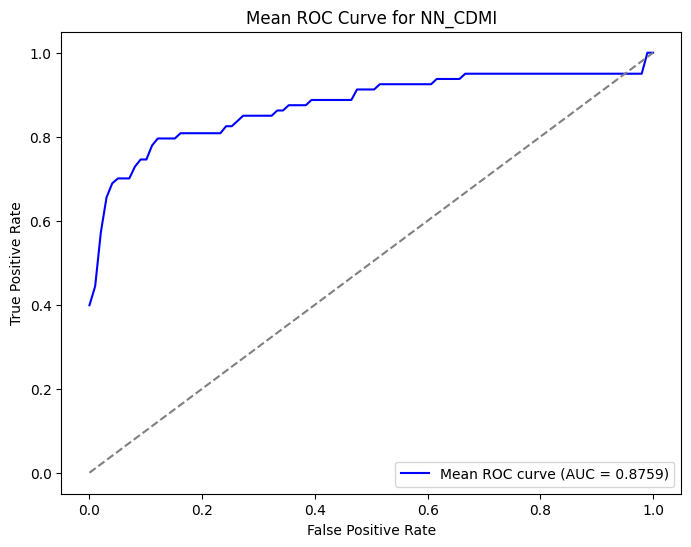

In [83]:
# K-fold Cross-validation with additional metrics for Neural Network with CDMI
kf_NN_CDMI = KFold(n_splits=5, shuffle=True, random_state=42)

roc_auc_scores_NN_CDMI = []
accuracy_scores_NN_CDMI = []
precision_scores_NN_CDMI = []
recall_scores_NN_CDMI = []
f1_scores_NN_CDMI = []

fpr_list_NN_CDMI, tpr_list_NN_CDMI = [], []

for train_index, test_index in kf_NN_CDMI.split(X_NN_CDMI):
    X_train_NN_CDMI, X_test_NN_CDMI = X_NN_CDMI[train_index], X_NN_CDMI[test_index]
    y_train_NN_CDMI, y_test_NN_CDMI = y_NN_CDMI[train_index], y_NN_CDMI[test_index]

    model_NN_CDMI.fit(X_train_NN_CDMI, y_train_NN_CDMI, epochs=20, batch_size=32, verbose=0)
    y_prob_NN_CDMI = model_NN_CDMI.predict(X_test_NN_CDMI).flatten()
    y_pred_NN_CDMI = (y_prob_NN_CDMI > 0.5).astype(int)

    fpr_NN_CDMI, tpr_NN_CDMI, _ = roc_curve(y_test_NN_CDMI, y_prob_NN_CDMI)
    roc_auc_NN_CDMI = roc_auc_score(y_test_NN_CDMI, y_prob_NN_CDMI)

    fpr_list_NN_CDMI.append(fpr_NN_CDMI)
    tpr_list_NN_CDMI.append(tpr_NN_CDMI)
    roc_auc_scores_NN_CDMI.append(roc_auc_NN_CDMI)

    accuracy_NN_CDMI = accuracy_score(y_test_NN_CDMI, y_pred_NN_CDMI)
    precision_NN_CDMI = precision_score(y_test_NN_CDMI, y_pred_NN_CDMI)
    recall_NN_CDMI = recall_score(y_test_NN_CDMI, y_pred_NN_CDMI)
    f1_NN_CDMI = f1_score(y_test_NN_CDMI, y_pred_NN_CDMI)

    accuracy_scores_NN_CDMI.append(accuracy_NN_CDMI)
    precision_scores_NN_CDMI.append(precision_NN_CDMI)
    recall_scores_NN_CDMI.append(recall_NN_CDMI)
    f1_scores_NN_CDMI.append(f1_NN_CDMI)

    print(f"Fold ROC AUC: {roc_auc_NN_CDMI:.4f} | Accuracy: {accuracy_NN_CDMI:.4f} | Precision: {precision_NN_CDMI:.4f} | Recall: {recall_NN_CDMI:.4f} | F1: {f1_NN_CDMI:.4f}")

# Average ROC metrics across folds
mean_fpr_NN_CDMI = np.linspace(0, 1, 100)
mean_tpr_NN_CDMI = np.zeros_like(mean_fpr_NN_CDMI)

for fpr_NN_CDMI, tpr_NN_CDMI in zip(fpr_list_NN_CDMI, tpr_list_NN_CDMI):
    mean_tpr_NN_CDMI += np.interp(mean_fpr_NN_CDMI, fpr_NN_CDMI, tpr_NN_CDMI)

mean_tpr_NN_CDMI /= len(fpr_list_NN_CDMI)
mean_roc_auc_NN_CDMI = np.mean(roc_auc_scores_NN_CDMI)

# Calculate the mean of other metrics
mean_accuracy_NN_CDMI = np.mean(accuracy_scores_NN_CDMI)
mean_precision_NN_CDMI = np.mean(precision_scores_NN_CDMI)
mean_recall_NN_CDMI = np.mean(recall_scores_NN_CDMI)
mean_f1_NN_CDMI = np.mean(f1_scores_NN_CDMI)

print(f"\nAverage metrics across all folds:")
print(f"Average ROC AUC: {mean_roc_auc_NN_CDMI:.4f}")
print(f"Average Accuracy: {mean_accuracy_NN_CDMI:.4f}")
print(f"Average Precision: {mean_precision_NN_CDMI:.4f}")
print(f"Average Recall: {mean_recall_NN_CDMI:.4f}")
print(f"Average F1 Score: {mean_f1_NN_CDMI:.4f}")

# Feature scaling
scaler_NN_CDMI = StandardScaler()
X_scaled_NN_CDMI = scaler_NN_CDMI.fit_transform(X_NN_CDMI)

# Model creation for Neural Network with CDMI
model_NN_CDMI = Sequential()
model_NN_CDMI.add(Dense(units=128, input_dim=X_scaled_NN_CDMI.shape[1], activation='relu'))
model_NN_CDMI.add(Dropout(0.2))
model_NN_CDMI.add(Dense(units=64, activation='relu'))
model_NN_CDMI.add(Dense(1, activation='sigmoid'))
model_NN_CDMI.compile(optimizer=Adam(learning_rate=0.001),
                      loss='binary_crossentropy', metrics=['accuracy'])

# Hyperparameter optimization with Optuna for NN_CDMI model
def optimize_nn_CDMI_with_optuna():
    def objective(trial):
        units_1 = trial.suggest_int('units_1', 64, 256)
        dropout_1 = trial.suggest_float('dropout_1', 0.2, 0.5)
        units_2 = trial.suggest_int('units_2', 32, 128)
        learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

        model_NN_CDMI = Sequential()
        model_NN_CDMI.add(Dense(units=units_1, input_dim=X_scaled_NN_CDMI.shape[1], activation='relu'))
        model_NN_CDMI.add(Dropout(dropout_1))
        model_NN_CDMI.add(Dense(units=units_2, activation='relu'))
        model_NN_CDMI.add(Dense(1, activation='sigmoid'))

        model_NN_CDMI.compile(optimizer=Adam(learning_rate=learning_rate),
                              loss='binary_crossentropy', metrics=['accuracy'])
        model_NN_CDMI.fit(X_scaled_NN_CDMI, y_NN_CDMI, epochs=10, batch_size=32, verbose=0)
        y_prob_NN_CDMI = model_NN_CDMI.predict(X_scaled_NN_CDMI).flatten()
        roc_auc_NN_CDMI = roc_auc_score(y_NN_CDMI, y_prob_NN_CDMI)

        return roc_auc_NN_CDMI

    study_NN_CDMI = optuna.create_study(direction='maximize')
    study_NN_CDMI.optimize(objective, n_trials=50)

    return study_NN_CDMI.best_params

# Run K-fold cross-validation and metrics calculation for Neural Network CDMI model
best_params_NN_CDMI = optimize_nn_CDMI_with_optuna()
model_NN_CDMI = Sequential()
model_NN_CDMI.add(Dense(units=best_params_NN_CDMI['units_1'], input_dim=X_scaled_NN_CDMI.shape[1], activation='relu'))
model_NN_CDMI.add(Dropout(best_params_NN_CDMI['dropout_1']))
model_NN_CDMI.add(Dense(units=best_params_NN_CDMI['units_2'], activation='relu'))
model_NN_CDMI.add(Dense(1, activation='sigmoid'))

model_NN_CDMI.compile(optimizer=Adam(learning_rate=best_params_NN_CDMI['learning_rate']),
                      loss='binary_crossentropy', metrics=['accuracy'])

# K-fold cross-validation with NN_CDMI
kf_NN_CDMI = KFold(n_splits=5, shuffle=True, random_state=42)

roc_auc_scores_NN_CDMI = []
accuracy_scores_NN_CDMI = []
precision_scores_NN_CDMI = []
recall_scores_NN_CDMI = []
f1_scores_NN_CDMI = []

fpr_list_NN_CDMI, tpr_list_NN_CDMI = [], []

for train_index, test_index in kf_NN_CDMI.split(X_scaled_NN_CDMI):
    X_train_NN_CDMI, X_test_NN_CDMI = X_scaled_NN_CDMI[train_index], X_scaled_NN_CDMI[test_index]
    y_train_NN_CDMI, y_test_NN_CDMI = y_NN_CDMI[train_index], y_NN_CDMI[test_index]

    model_NN_CDMI.fit(X_train_NN_CDMI, y_train_NN_CDMI, epochs=20, batch_size=32, verbose=0)
    y_prob_NN_CDMI = model_NN_CDMI.predict(X_test_NN_CDMI).flatten()
    y_pred_NN_CDMI = (y_prob_NN_CDMI > 0.5).astype(int)

    fpr_NN_CDMI, tpr_NN_CDMI, _ = roc_curve(y_test_NN_CDMI, y_prob_NN_CDMI)
    roc_auc_NN_CDMI = roc_auc_score(y_test_NN_CDMI, y_prob_NN_CDMI)

    fpr_list_NN_CDMI.append(fpr_NN_CDMI)
    tpr_list_NN_CDMI.append(tpr_NN_CDMI)
    roc_auc_scores_NN_CDMI.append(roc_auc_NN_CDMI)

    accuracy_NN_CDMI = accuracy_score(y_test_NN_CDMI, y_pred_NN_CDMI)
    precision_NN_CDMI = precision_score(y_test_NN_CDMI, y_pred_NN_CDMI)
    recall_NN_CDMI = recall_score(y_test_NN_CDMI, y_pred_NN_CDMI)
    f1_NN_CDMI = f1_score(y_test_NN_CDMI, y_pred_NN_CDMI)

    accuracy_scores_NN_CDMI.append(accuracy_NN_CDMI)
    precision_scores_NN_CDMI.append(precision_NN_CDMI)
    recall_scores_NN_CDMI.append(recall_NN_CDMI)
    f1_scores_NN_CDMI.append(f1_NN_CDMI)

mean_fpr_NN_CDMI = np.linspace(0, 1, 100)
mean_tpr_NN_CDMI = np.zeros_like(mean_fpr_NN_CDMI)

for fpr_NN_CDMI, tpr_NN_CDMI in zip(fpr_list_NN_CDMI, tpr_list_NN_CDMI):
    mean_tpr_NN_CDMI += np.interp(mean_fpr_NN_CDMI, fpr_NN_CDMI, tpr_NN_CDMI)

mean_tpr_NN_CDMI /= len(fpr_list_NN_CDMI)
mean_roc_auc_NN_CDMI = np.mean(roc_auc_scores_NN_CDMI)

mean_accuracy_NN_CDMI = np.mean(accuracy_scores_NN_CDMI)
mean_precision_NN_CDMI = np.mean(precision_scores_NN_CDMI)
mean_recall_NN_CDMI = np.mean(recall_scores_NN_CDMI)
mean_f1_NN_CDMI = np.mean(f1_scores_NN_CDMI)

print(f"\nAverage metrics across all folds for NN_CDMI model:")
print(f"Average ROC AUC: {mean_roc_auc_NN_CDMI:.4f}")
print(f"Average Accuracy: {mean_accuracy_NN_CDMI:.4f}")
print(f"Average Precision: {mean_precision_NN_CDMI:.4f}")
print(f"Average Recall: {mean_recall_NN_CDMI:.4f}")
print(f"Average F1 Score: {mean_f1_NN_CDMI:.4f}")

# Visualization of ROC curve
plt.figure(figsize=(8, 6))
plt.plot(mean_fpr_NN_CDMI, mean_tpr_NN_CDMI, color='b', label=f'Mean ROC curve (AUC = {mean_roc_auc_NN_CDMI:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Mean ROC Curve for NN_CDMI')
plt.legend(loc='lower right')
plt.show()

In [ ]:
# Generate SHAP values
background = X_scaled_NN_CDMI[np.random.choice(X_scaled_NN_CDMI.shape[0], 100, replace=False)]
explainer = shap.DeepExplainer(model_NN_CDMI, background)
shap_values = explainer.shap_values(X_scaled_NN_CDMI)

if isinstance(shap_values, list):
    shap_values = shap_values[0]

# Reshape the 3D array to 2D by removing the last dimension
shap_values_2D = shap_values.reshape(shap_values.shape[0], shap_values.shape[1])
print(f"Reshaped SHAP values from {shap_values.shape} to {shap_values_2D.shape}")

shap.summary_plot(shap_values_2D, X_scaled_NN_CA, feature_names=feature_names_NN_CA)

shap_df = pd.DataFrame(shap_values_2D, columns=feature_names_NN_CA)

# Calculate and print feature importance
feature_importance = np.abs(shap_df).mean().sort_values(ascending=False)
print("\nFeature importance ranking:")
for feature, importance in feature_importance.items():
    print(f"{feature}: {importance:.4f}")

In [ ]:
def explain_with_lime_NN_CDMI(model, X_train, X_test, feature_names):
    explainer = LimeTabularExplainer(
        X_train,
        feature_names=feature_names,
        class_names=['No CDMI', 'CDMI'],
        mode='classification'
    )

    instance = X_test[0].reshape(1, -1)

    def predict_fn(X):
        return np.hstack([1 - model.predict(X), model.predict(X)])

    explanation = explainer.explain_instance(instance.flatten(), predict_fn, num_features=10)

    explanation.show_in_notebook(show_table=True, show_all=False)
    fig = explanation.as_pyplot_figure()
    plt.show()

explain_with_lime_NN_CDMI(model_NN_CDMI, X_scaled_NN_CDMI, X_scaled_NN_CDMI, feature_names_NN_CDMI)

## Combined

In [ ]:
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import RandomOverSampler
from sklearn.neural_network import MLPClassifier

In [ ]:
common_columns_NN_Combined = df1_hip_cleaned.columns.intersection(df_hip_cleaned.columns)

df1_hip_cleaned = df1_hip_cleaned.reindex(columns=common_columns_NN_Combined, fill_value=np.nan)
df_hip_cleaned = df_hip_cleaned.reindex(columns=common_columns_NN_Combined, fill_value=np.nan)

X_NN_Combined = pd.concat([df1_hip_cleaned.drop(columns=['CDMI','CDARREST']), df_hip_cleaned.drop(columns=['CDMI','CDARREST'])], axis=0)

y_NN_Combined = pd.concat([df1_hip_cleaned['CDMI'], df_hip_cleaned['CDARREST']], axis=0)

imputer_NN_Combined = SimpleImputer(strategy='mean')
X_NN_Combined_imputed = imputer_NN_Combined.fit_transform(X_NN_Combined)

print(f"Shape of imputed combined features: {X_NN_Combined_imputed.shape}")

scaler_NN_Combined = StandardScaler()
X_NN_Combined_scaled = scaler_NN_Combined.fit_transform(X_NN_Combined_imputed)

print(f"Shape of scaled combined features: {X_NN_Combined_scaled.shape}")

nn_classifier_NN_Combined = MLPClassifier(hidden_layer_sizes=(100,), max_iter=1000, random_state=42)

nn_classifier_NN_Combined.fit(X_NN_Combined_scaled, y_NN_Combined)

y_pred_combined_NN_Combined = nn_classifier_NN_Combined.predict(X_NN_Combined_scaled)

accuracy_combined_NN_Combined = accuracy_score(y_NN_Combined, y_pred_combined_NN_Combined)
f1_combined_NN_Combined = f1_score(y_NN_Combined, y_pred_combined_NN_Combined)
recall_combined_NN_Combined = recall_score(y_NN_Combined, y_pred_combined_NN_Combined)
precision_combined_NN_Combined = precision_score(y_NN_Combined, y_pred_combined_NN_Combined)

print(f'Combined NN Model Metrics: ')
print(f'Accuracy: {accuracy_combined_NN_Combined:.4f}')
print(f'F1 Score: {f1_combined_NN_Combined:.4f}')
print(f'Recall: {recall_combined_NN_Combined:.4f}')
print(f'Precision: {precision_combined_NN_Combined:.4f}')

y_pred_prob_combined_NN_Combined = nn_classifier_NN_Combined.predict_proba(X_NN_Combined_scaled)[:, 1]

fpr_combined_NN_Combined, tpr_combined_NN_Combined, _ = roc_curve(y_NN_Combined, y_pred_prob_combined_NN_Combined)
roc_auc_combined_NN_Combined = auc(fpr_combined_NN_Combined, tpr_combined_NN_Combined)

print(f'AUC Score for Combined NN Model: {roc_auc_combined_NN_Combined:.4f}')

Shape of imputed combined features: (3226, 21)
Shape of scaled combined features: (3226, 21)
Combined NN Model Metrics: 
Accuracy: 0.9684
F1 Score: 0.9679
Recall: 0.9541
Precision: 0.9821
AUC Score for Combined NN Model: 0.9957


In [ ]:
feature_names_combined = X_NN_Combined.columns.tolist()

background_data = shap.kmeans(X_NN_Combined_scaled, 100)

explainer_NN_Combined = shap.KernelExplainer(
    lambda x: nn_classifier_NN_Combined.predict_proba(x)[:, 1],
    background_data
)

sample_size = min(500, X_NN_Combined_scaled.shape[0]) 
sample_indices = np.random.choice(X_NN_Combined_scaled.shape[0], sample_size, replace=False)
sample_data = X_NN_Combined_scaled[sample_indices]

shap_values_Combined = explainer_NN_Combined.shap_values(sample_data)

plt.figure(figsize=(10, 8))
shap.summary_plot(
    shap_values_Combined,
    sample_data,
    feature_names=feature_names_combined,
    title="Feature Importance - Combined Neural Network Model"
)

<Figure size 1000x600 with 0 Axes>

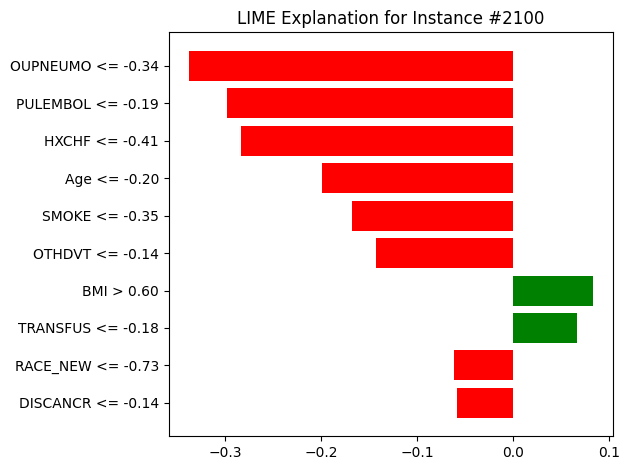

'<html>\n        <meta http-equiv="content-type" content="text/html; charset=UTF8">\n        <head><script>var lime =\n/******/ (function(modules) { // webpackBootstrap\n/******/ \t// The module cache\n/******/ \tvar installedModules = {};\n/******/\n/******/ \t// The require function\n/******/ \tfunction __webpack_require__(moduleId) {\n/******/\n/******/ \t\t// Check if module is in cache\n/******/ \t\tif(installedModules[moduleId])\n/******/ \t\t\treturn installedModules[moduleId].exports;\n/******/\n/******/ \t\t// Create a new module (and put it into the cache)\n/******/ \t\tvar module = installedModules[moduleId] = {\n/******/ \t\t\texports: {},\n/******/ \t\t\tid: moduleId,\n/******/ \t\t\tloaded: false\n/******/ \t\t};\n/******/\n/******/ \t\t// Execute the module function\n/******/ \t\tmodules[moduleId].call(module.exports, module, module.exports, __webpack_require__);\n/******/\n/******/ \t\t// Flag the module as loaded\n/******/ \t\tmodule.loaded = true;\n/******/\n/******/ 

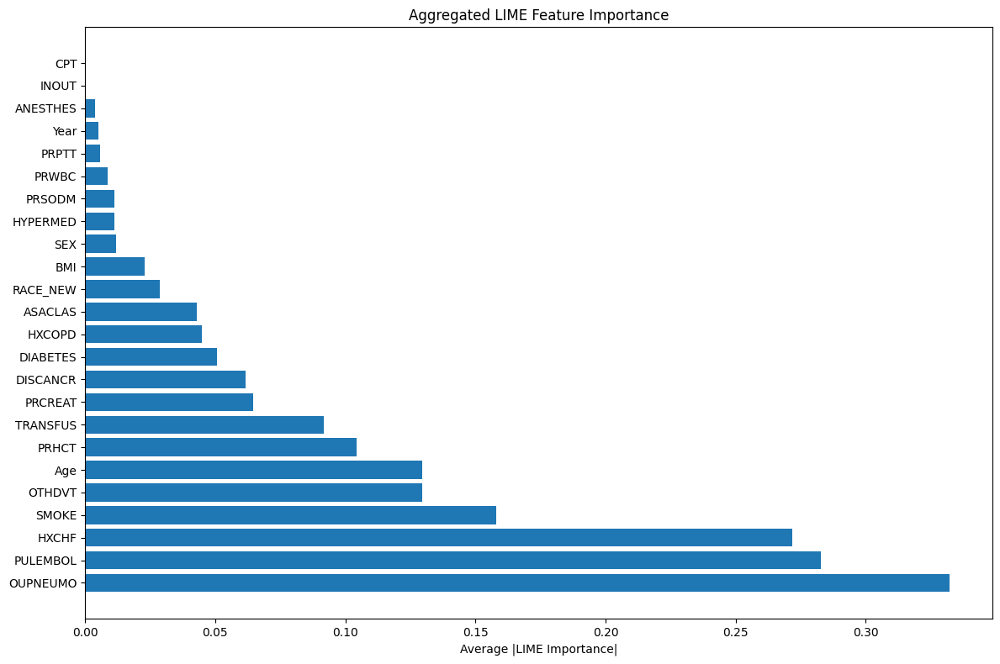

<Figure size 1400x1000 with 0 Axes>

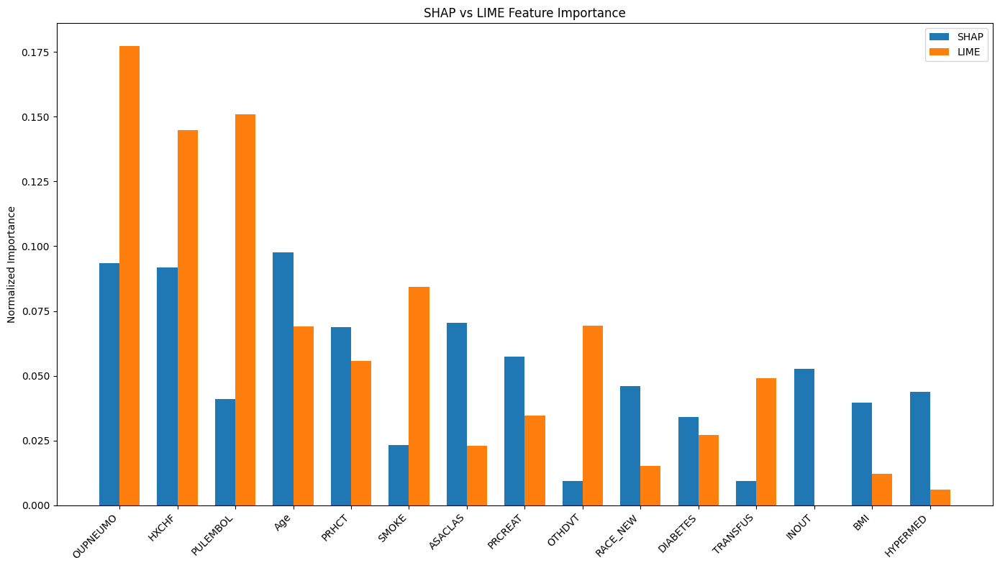

In [ ]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    X_NN_Combined_scaled,
    feature_names=feature_names_combined,
    class_names=['Class 0', 'Class 1'],
    mode='classification'
)


instance_idx = sample_indices[0]
instance = X_NN_Combined_scaled[instance_idx]

# Generate the LIME explanation for this instance
lime_exp = lime_explainer.explain_instance(
    instance,
    lambda x: nn_classifier_NN_Combined.predict_proba(x),
    num_features=10
)

# Plot the LIME explanation
plt.figure(figsize=(10, 6))
lime_exp.as_pyplot_figure()
plt.title("LIME Explanation for Instance #{}".format(instance_idx))
plt.tight_layout()
plt.show()

from IPython.display import display
display(lime_exp.as_html())

num_lime_samples = 10
lime_instances = np.random.choice(X_NN_Combined_scaled.shape[0], num_lime_samples, replace=False)

# Create a function to extract feature importance from LIME explanations
def get_lime_feature_importance(exp):
    feature_importance = {}
    for feature, weight in exp.as_list():
        feature_name = feature.split(' ')[0]
        feature_importance[feature_name] = abs(weight)
    return feature_importance

# Get LIME explanations for multiple instances
lime_importances = []
for idx in lime_instances:
    instance = X_NN_Combined_scaled[idx]
    exp = lime_explainer.explain_instance(
        instance,
        lambda x: nn_classifier_NN_Combined.predict_proba(x),
        num_features=len(feature_names_combined)
    )
    lime_importances.append(get_lime_feature_importance(exp))

# Aggregate LIME feature importances
lime_agg_importance = {}
for feat in feature_names_combined:
    values = [imp.get(feat, 0) for imp in lime_importances]
    lime_agg_importance[feat] = np.mean(values)

# Plot aggregated LIME feature importances
sorted_features = sorted(lime_agg_importance.items(), key=lambda x: x[1], reverse=True)
features, importances = zip(*sorted_features)

plt.figure(figsize=(12, 8))
plt.barh(range(len(features)), importances)
plt.yticks(range(len(features)), features)
plt.xlabel('Average |LIME Importance|')
plt.title('Aggregated LIME Feature Importance')
plt.tight_layout()
plt.show()

# Compare SHAP and LIME feature importances
shap_importance = {}
for i, feature in enumerate(feature_names_combined):
    shap_importance[feature] = np.mean(np.abs(shap_values_Combined[:, i]))

# Create a comparison dataframe
comparison_df = pd.DataFrame({
    'Feature': feature_names_combined,
    'SHAP Importance': [shap_importance[f] for f in feature_names_combined],
    'LIME Importance': [lime_agg_importance.get(f, 0) for f in feature_names_combined]
})

# Normalize the importances to make them comparable
comparison_df['SHAP Importance'] = comparison_df['SHAP Importance'] / comparison_df['SHAP Importance'].sum()
comparison_df['LIME Importance'] = comparison_df['LIME Importance'] / comparison_df['LIME Importance'].sum()

# Sort by average importance
comparison_df['Average Importance'] = (comparison_df['SHAP Importance'] + comparison_df['LIME Importance']) / 2
comparison_df = comparison_df.sort_values('Average Importance', ascending=False).reset_index(drop=True)

# Plot the comparison
plt.figure(figsize=(14, 10))
top_n = 15
comparison_df_top = comparison_df.head(top_n)

x = np.arange(len(comparison_df_top))
width = 0.35

fig, ax = plt.subplots(figsize=(14, 8))
rects1 = ax.bar(x - width/2, comparison_df_top['SHAP Importance'], width, label='SHAP')
rects2 = ax.bar(x + width/2, comparison_df_top['LIME Importance'], width, label='LIME')

ax.set_ylabel('Normalized Importance')
ax.set_title('SHAP vs LIME Feature Importance')
ax.set_xticks(x)
ax.set_xticklabels(comparison_df_top['Feature'], rotation=45, ha='right')
ax.legend()

plt.tight_layout()
plt.show()


# Neural Network w/ MC

## Cardiac Arrest

[I 2025-12-04 19:04:04,849] A new study created in memory with name: no-name-cea77cdd-bb4b-4e09-b58e-98bb96f2a7c1
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:04:06,335] Trial 0 finished with value: 0.9149439964608176 and parameters: {'units_1': 64, 'dropout_1': 0.41711861093302127, 'units_2': 98, 'learning_rate': 0.003865435871679243}. Best is trial 0 with value: 0.9149439964608176.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:07,804] Trial 1 finished with value: 0.8399123248004182 and parameters: {'units_1': 210, 'dropout_1': 0.2814993954177306, 'units_2': 78, 'learning_rate': 2.654492028686862e-05}. Best is trial 0 with value: 0.9149439964608176.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:09,321] Trial 2 finished with value: 0.8669337810935269 and parameters: {'units_1': 188, 'dropout_1': 0.3882965853243299, 'units_2': 113, 'learning_rate': 4.420679718842968e-05}. Best is trial 0 with value: 0.9149439964608176.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:10,738] Trial 3 finished with value: 0.9342033823322408 and parameters: {'units_1': 70, 'dropout_1': 0.29348531600032246, 'units_2': 51, 'learning_rate': 0.004964816281439395}. Best is trial 3 with value: 0.9342033823322408.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:12,164] Trial 4 finished with value: 0.8551951577550323 and parameters: {'units_1': 142, 'dropout_1': 0.41058680743955167, 'units_2': 116, 'learning_rate': 4.103132143348611e-05}. Best is trial 3 with value: 0.9342033823322408.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:13,581] Trial 5 finished with value: 0.8338494640953972 and parameters: {'units_1': 201, 'dropout_1': 0.4970725667460081, 'units_2': 85, 'learning_rate': 2.7862518708752442e-05}. Best is trial 3 with value: 0.9342033823322408.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:14,990] Trial 6 finished with value: 0.8456785778921756 and parameters: {'units_1': 104, 'dropout_1': 0.32892566900709197, 'units_2': 34, 'learning_rate': 7.360431412665121e-05}. Best is trial 3 with value: 0.9342033823322408.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:16,417] Trial 7 finished with value: 0.8769681674676748 and parameters: {'units_1': 156, 'dropout_1': 0.3212500871598003, 'units_2': 54, 'learning_rate': 0.00019088028105314234}. Best is trial 3 with value: 0.9342033823322408.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:17,817] Trial 8 finished with value: 0.908956544471033 and parameters: {'units_1': 107, 'dropout_1': 0.4502143300916236, 'units_2': 57, 'learning_rate': 0.001824000583444292}. Best is trial 3 with value: 0.9342033823322408.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:19,204] Trial 9 finished with value: 0.887716423012729 and parameters: {'units_1': 131, 'dropout_1': 0.20628775421654072, 'units_2': 43, 'learning_rate': 0.00044592441580335675}. Best is trial 3 with value: 0.9342033823322408.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:20,649] Trial 10 finished with value: 0.9637736532003459 and parameters: {'units_1': 256, 'dropout_1': 0.23227723797752414, 'units_2': 66, 'learning_rate': 0.006960946935593303}. Best is trial 10 with value: 0.9637736532003459.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:22,066] Trial 11 finished with value: 0.9690321542761768 and parameters: {'units_1': 234, 'dropout_1': 0.23086216075560745, 'units_2': 64, 'learning_rate': 0.007821526053708033}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:23,502] Trial 12 finished with value: 0.9652114460375234 and parameters: {'units_1': 256, 'dropout_1': 0.20238098919194988, 'units_2': 69, 'learning_rate': 0.009268969706818805}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:24,971] Trial 13 finished with value: 0.9351937501256812 and parameters: {'units_1': 251, 'dropout_1': 0.24713199536627678, 'units_2': 77, 'learning_rate': 0.0012215228379884855}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:26,406] Trial 14 finished with value: 0.9561624002091336 and parameters: {'units_1': 229, 'dropout_1': 0.20343804745993221, 'units_2': 92, 'learning_rate': 0.00848840836899321}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:27,843] Trial 15 finished with value: 0.9363751533310543 and parameters: {'units_1': 231, 'dropout_1': 0.26050612110063265, 'units_2': 70, 'learning_rate': 0.0016042698623604567}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:29,284] Trial 16 finished with value: 0.8951567495827384 and parameters: {'units_1': 183, 'dropout_1': 0.3658218033612114, 'units_2': 63, 'learning_rate': 0.0005562150684767885}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:30,719] Trial 17 finished with value: 0.7904341531098555 and parameters: {'units_1': 231, 'dropout_1': 0.22038497801365314, 'units_2': 98, 'learning_rate': 1.027228770560224e-05}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:32,136] Trial 18 finished with value: 0.9542570733374891 and parameters: {'units_1': 215, 'dropout_1': 0.27641405648872425, 'units_2': 46, 'learning_rate': 0.002863813536701233}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:33,547] Trial 19 finished with value: 0.9030344467011201 and parameters: {'units_1': 181, 'dropout_1': 0.3125409032457229, 'units_2': 32, 'learning_rate': 0.0009237074316655249}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:35,024] Trial 20 finished with value: 0.8900038207082386 and parameters: {'units_1': 243, 'dropout_1': 0.24468009697733162, 'units_2': 127, 'learning_rate': 0.0002417345498053859}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:36,487] Trial 21 finished with value: 0.9641280741619578 and parameters: {'units_1': 256, 'dropout_1': 0.22944649559265953, 'units_2': 66, 'learning_rate': 0.009606814850726786}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:37,969] Trial 22 finished with value: 0.9629039393512839 and parameters: {'units_1': 239, 'dropout_1': 0.22500188062415893, 'units_2': 73, 'learning_rate': 0.009932009822295137}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:39,433] Trial 23 finished with value: 0.9557501658991735 and parameters: {'units_1': 256, 'dropout_1': 0.26551899834547155, 'units_2': 62, 'learning_rate': 0.0028484210302645446}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:40,982] Trial 24 finished with value: 0.9667950290574916 and parameters: {'units_1': 217, 'dropout_1': 0.23854909036504632, 'units_2': 87, 'learning_rate': 0.005337191972959238}. Best is trial 11 with value: 0.9690321542761768.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:42,505] Trial 25 finished with value: 0.9699823040881578 and parameters: {'units_1': 217, 'dropout_1': 0.20253841292463193, 'units_2': 86, 'learning_rate': 0.00535507204820856}. Best is trial 25 with value: 0.9699823040881578.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:44,104] Trial 26 finished with value: 0.9607522773432001 and parameters: {'units_1': 217, 'dropout_1': 0.2993245106315429, 'units_2': 86, 'learning_rate': 0.004056539366725816}. Best is trial 25 with value: 0.9699823040881578.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:45,754] Trial 27 finished with value: 0.9540610106778742 and parameters: {'units_1': 197, 'dropout_1': 0.246495775731869, 'units_2': 107, 'learning_rate': 0.0023741161434565478}. Best is trial 25 with value: 0.9699823040881578.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-04 19:04:47,409] Trial 28 finished with value: 0.9087454000683705 and parameters: {'units_1': 164, 'dropout_1': 0.34367741898153037, 'units_2': 87, 'learning_rate': 0.0009719437294586231}. Best is trial 25 with value: 0.9699823040881578.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:52,099] Trial 29 finished with value: 0.9629944298095678 and parameters: {'units_1': 172, 'dropout_1': 0.2475840292959282, 'units_2': 98, 'learning_rate': 0.004336250083966947}. Best is trial 25 with value: 0.9699823040881578.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:53,739] Trial 30 finished with value: 0.9633513643950211 and parameters: {'units_1': 222, 'dropout_1': 0.2668618048539811, 'units_2': 105, 'learning_rate': 0.004985695985643801}. Best is trial 25 with value: 0.9699823040881578.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:04:55,321] Trial 31 finished with value: 0.9725864183876609 and parameters: {'units_1': 204, 'dropout_1': 0.2042948332665496, 'units_2': 80, 'learning_rate': 0.005374793368790443}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:04:56,907] Trial 32 finished with value: 0.9604657242253012 and parameters: {'units_1': 199, 'dropout_1': 0.21816321276197134, 'units_2': 82, 'learning_rate': 0.005739549455712791}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-04 19:04:58,520] Trial 33 finished with value: 0.96139073779887 and parameters: {'units_1': 207, 'dropout_1': 0.2047411002433184, 'units_2': 81, 'learning_rate': 0.0030298802848924126}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:05:00,079] Trial 34 finished with value: 0.9454392809024916 and parameters: {'units_1': 189, 'dropout_1': 0.23310609232316834, 'units_2': 91, 'learning_rate': 0.0017158581782452333}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:01,602] Trial 35 finished with value: 0.9546240624183072 and parameters: {'units_1': 212, 'dropout_1': 0.28631737845375127, 'units_2': 75, 'learning_rate': 0.006021566606148759}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:03,171] Trial 36 finished with value: 0.8720163285004726 and parameters: {'units_1': 240, 'dropout_1': 0.20005217699570568, 'units_2': 94, 'learning_rate': 0.00011053899837074297}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:04,798] Trial 37 finished with value: 0.9640953970520221 and parameters: {'units_1': 223, 'dropout_1': 0.2573273307593189, 'units_2': 103, 'learning_rate': 0.0035902659356071387}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:06,333] Trial 38 finished with value: 0.89872609543727 and parameters: {'units_1': 205, 'dropout_1': 0.4314342657305148, 'units_2': 78, 'learning_rate': 0.0006635672732524714}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:07,819] Trial 39 finished with value: 0.9498481771199904 and parameters: {'units_1': 66, 'dropout_1': 0.21686311556687388, 'units_2': 59, 'learning_rate': 0.0066275570298405945}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-04 19:05:09,363] Trial 40 finished with value: 0.9451828912706871 and parameters: {'units_1': 190, 'dropout_1': 0.2947980719580523, 'units_2': 114, 'learning_rate': 0.0021100973047552354}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:10,937] Trial 41 finished with value: 0.9588318687285086 and parameters: {'units_1': 242, 'dropout_1': 0.21377659780137065, 'units_2': 70, 'learning_rate': 0.007216409291226382}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:12,486] Trial 42 finished with value: 0.9576554927708177 and parameters: {'units_1': 228, 'dropout_1': 0.2369098944834506, 'units_2': 83, 'learning_rate': 0.004246350998811217}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:14,021] Trial 43 finished with value: 0.9710480805968348 and parameters: {'units_1': 245, 'dropout_1': 0.21857020257071957, 'units_2': 72, 'learning_rate': 0.006551797735292612}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:15,552] Trial 44 finished with value: 0.9543023185666312 and parameters: {'units_1': 236, 'dropout_1': 0.38471554895122373, 'units_2': 50, 'learning_rate': 0.005250510475636372}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:17,066] Trial 45 finished with value: 0.9312021154658248 and parameters: {'units_1': 218, 'dropout_1': 0.23359116980795444, 'units_2': 89, 'learning_rate': 0.0012336959707826963}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:18,571] Trial 46 finished with value: 0.9108769530857246 and parameters: {'units_1': 83, 'dropout_1': 0.48219290777461915, 'units_2': 73, 'learning_rate': 0.003506186109827049}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:20,091] Trial 47 finished with value: 0.9520501116048985 and parameters: {'units_1': 137, 'dropout_1': 0.276281680109984, 'units_2': 79, 'learning_rate': 0.0076360981662555415}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:21,577] Trial 48 finished with value: 0.95234169197048 and parameters: {'units_1': 149, 'dropout_1': 0.2147297730901475, 'units_2': 95, 'learning_rate': 0.0026158578483264387}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:05:23,087] Trial 49 finished with value: 0.9660459691528083 and parameters: {'units_1': 245, 'dropout_1': 0.2512720031827945, 'units_2': 53, 'learning_rate': 0.005467055828221088}. Best is trial 31 with value: 0.9725864183876609.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Fold ROC AUC: 0.8596 | Accuracy: 0.7709 | Precision: 0.7157 | Recall: 0.8588 | F1: 0.7807
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Fold ROC AUC: 0.8934 | Accuracy: 0.8324 | Precision: 0.7979 | Recall: 0.8721 | F1: 0.8333
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Fold ROC AUC: 0.9687 | Accuracy: 0.9101 | Precision: 0.9048 | Recall: 0.9048 | F1: 0.9048
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step
Fold ROC AUC: 0.9842 | Accuracy: 0.9270 | Precision: 1.0000 | Recall: 0.8673 | F1: 0.9290
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Fold ROC AUC: 0.9896 | Accuracy: 0.9607 | Precision: 0.9574 | Recall: 0.9677 | F1: 0.9626

Average metrics across all folds:
Average ROC AUC: 0.9391
Average Accuracy: 0.8802
Average Precision: 0.8752
Average Recall: 0.8942
Average F1 Score: 0.8821


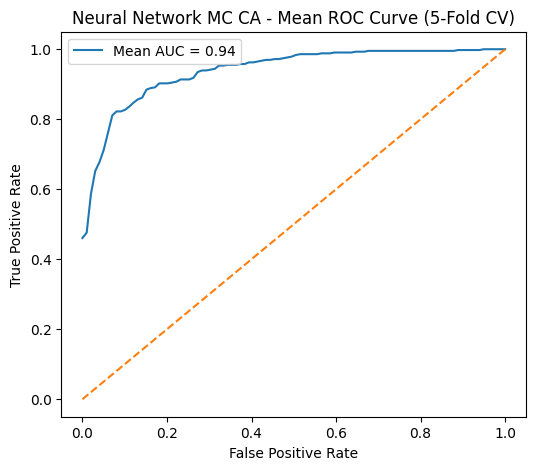

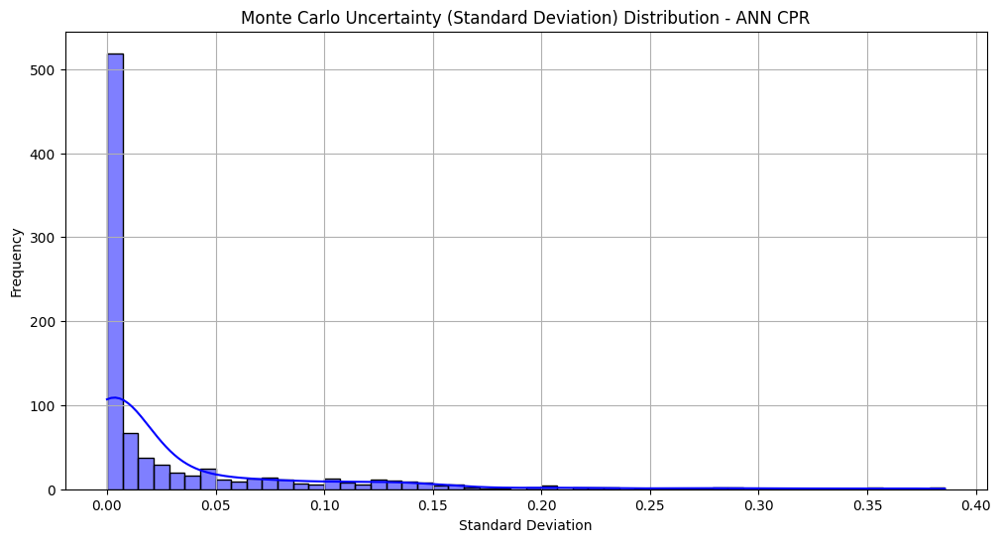

In [85]:
# Prepare the features and target variable
X_NN_MC_CA = df_hip_cleaned.drop(['CDARREST', 'CDMI'], axis=1).values
y_NN_MC_CA = df_hip_cleaned['CDARREST'].values

# Scale the features
scaler_NN_MC_CA = StandardScaler()
X_scaled_NN_MC_CA = scaler_NN_MC_CA.fit_transform(X_NN_MC_CA)

# Hyperparameter optimization using Optuna
study_NN_MC_CA = optuna.create_study(direction='maximize')

def objective(trial):
    units_1 = trial.suggest_int('units_1', 64, 256)
    dropout_1 = trial.suggest_float('dropout_1', 0.2, 0.5)
    units_2 = trial.suggest_int('units_2', 32, 128)
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

    model_NN_MC_CA = Sequential()
    model_NN_MC_CA.add(Dense(units_1, input_dim=X_scaled_NN_MC_CA.shape[1], activation='relu'))
    model_NN_MC_CA.add(Dropout(dropout_1))
    model_NN_MC_CA.add(Dense(units_2, activation='relu'))
    model_NN_MC_CA.add(Dense(1, activation='sigmoid'))

    model_NN_MC_CA.compile(optimizer=Adam(learning_rate=learning_rate),
                            loss='binary_crossentropy', metrics=['accuracy'])

    model_NN_MC_CA.fit(X_scaled_NN_MC_CA, y_NN_MC_CA, epochs=10, batch_size=32, verbose=0)
    y_prob_NN_MC_CA = model_NN_MC_CA.predict(X_scaled_NN_MC_CA).flatten()
    roc_auc_NN_MC_CA = roc_auc_score(y_NN_MC_CA, y_prob_NN_MC_CA)

    return roc_auc_NN_MC_CA

study_NN_MC_CA.optimize(objective, n_trials=50)
best_params_NN_MC_CA = study_NN_MC_CA.best_params

# Build the model with the best parameters from Optuna
model_NN_MC_CA = Sequential()
model_NN_MC_CA.add(Dense(best_params_NN_MC_CA['units_1'], input_dim=X_scaled_NN_MC_CA.shape[1], activation='relu'))
model_NN_MC_CA.add(Dropout(best_params_NN_MC_CA['dropout_1']))
model_NN_MC_CA.add(Dense(best_params_NN_MC_CA['units_2'], activation='relu'))
model_NN_MC_CA.add(Dense(1, activation='sigmoid'))

model_NN_MC_CA.compile(optimizer=Adam(learning_rate=best_params_NN_MC_CA['learning_rate']),
                        loss='binary_crossentropy', metrics=['accuracy'])

# K-fold Cross-validation with additional metrics for Neural Network with MC and CA (NN_MC_CA)
kf_NN_MC_CA = KFold(n_splits=5, shuffle=True, random_state=42)

roc_auc_scores_NN_MC_CA = []
accuracy_scores_NN_MC_CA = []
precision_scores_NN_MC_CA = []
recall_scores_NN_MC_CA = []
f1_scores_NN_MC_CA = []

fpr_list_NN_MC_CA, tpr_list_NN_MC_CA = [], []

for train_index, test_index in kf_NN_MC_CA.split(X_scaled_NN_MC_CA):
    X_train_NN_MC_CA, X_test_NN_MC_CA = X_scaled_NN_MC_CA[train_index], X_scaled_NN_MC_CA[test_index]
    y_train_NN_MC_CA, y_test_NN_MC_CA = y_NN_MC_CA[train_index], y_NN_MC_CA[test_index]

    model_NN_MC_CA.fit(X_train_NN_MC_CA, y_train_NN_MC_CA, epochs=20, batch_size=32, verbose=0)
    y_prob_NN_MC_CA = model_NN_MC_CA.predict(X_test_NN_MC_CA).flatten()
    y_pred_NN_MC_CA = (y_prob_NN_MC_CA > 0.5).astype(int)

    fpr_NN_MC_CA, tpr_NN_MC_CA, _ = roc_curve(y_test_NN_MC_CA, y_prob_NN_MC_CA)
    roc_auc_NN_MC_CA = roc_auc_score(y_test_NN_MC_CA, y_prob_NN_MC_CA)

    fpr_list_NN_MC_CA.append(fpr_NN_MC_CA)
    tpr_list_NN_MC_CA.append(tpr_NN_MC_CA)
    roc_auc_scores_NN_MC_CA.append(roc_auc_NN_MC_CA)

    accuracy_NN_MC_CA = accuracy_score(y_test_NN_MC_CA, y_pred_NN_MC_CA)
    precision_NN_MC_CA = precision_score(y_test_NN_MC_CA, y_pred_NN_MC_CA)
    recall_NN_MC_CA = recall_score(y_test_NN_MC_CA, y_pred_NN_MC_CA)
    f1_NN_MC_CA = f1_score(y_test_NN_MC_CA, y_pred_NN_MC_CA)

    accuracy_scores_NN_MC_CA.append(accuracy_NN_MC_CA)
    precision_scores_NN_MC_CA.append(precision_NN_MC_CA)
    recall_scores_NN_MC_CA.append(recall_NN_MC_CA)
    f1_scores_NN_MC_CA.append(f1_NN_MC_CA)

    print(f"Fold ROC AUC: {roc_auc_NN_MC_CA:.4f} | Accuracy: {accuracy_NN_MC_CA:.4f} | Precision: {precision_NN_MC_CA:.4f} | Recall: {recall_NN_MC_CA:.4f} | F1: {f1_NN_MC_CA:.4f}")

# Average ROC metrics across folds
mean_fpr_NN_MC_CA = np.linspace(0, 1, 100)
mean_tpr_NN_MC_CA = np.zeros_like(mean_fpr_NN_MC_CA)

# Interpolating ROC curves
for fpr_NN_MC_CA, tpr_NN_MC_CA in zip(fpr_list_NN_MC_CA, tpr_list_NN_MC_CA):
    mean_tpr_NN_MC_CA += np.interp(mean_fpr_NN_MC_CA, fpr_NN_MC_CA, tpr_NN_MC_CA)

mean_tpr_NN_MC_CA /= len(fpr_list_NN_MC_CA)
mean_roc_auc_NN_MC_CA = np.mean(roc_auc_scores_NN_MC_CA)

# Calculate the mean of other metrics
mean_accuracy_NN_MC_CA = np.mean(accuracy_scores_NN_MC_CA)
mean_precision_NN_MC_CA = np.mean(precision_scores_NN_MC_CA)
mean_recall_NN_MC_CA = np.mean(recall_scores_NN_MC_CA)
mean_f1_NN_MC_CA = np.mean(f1_scores_NN_MC_CA)

print(f"\nAverage metrics across all folds:")
print(f"Average ROC AUC: {mean_roc_auc_NN_MC_CA:.4f}")
print(f"Average Accuracy: {mean_accuracy_NN_MC_CA:.4f}")
print(f"Average Precision: {mean_precision_NN_MC_CA:.4f}")
print(f"Average Recall: {mean_recall_NN_MC_CA:.4f}")
print(f"Average F1 Score: {mean_f1_NN_MC_CA:.4f}")

# Plot ROC curve
plt.figure(figsize=(6, 5))
plt.plot(mean_fpr_NN_MC_CA, mean_tpr_NN_MC_CA, label=f'Mean AUC = {mean_roc_auc_NN_MC_CA:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Neural Network MC CA - Mean ROC Curve (5-Fold CV)')
plt.legend()
plt.show()

# Monte Carlo Dropout: Inference with Dropout
def predict_with_mc_dropout(model, X, n_iter=100):
    f_preds = np.zeros((n_iter, X.shape[0]))
    for i in range(n_iter):
        f_preds[i] = model(X, training=True).numpy().flatten()
    return f_preds

# Perform Monte Carlo Dropout to get uncertainty
f_preds_NN_MC_CA = predict_with_mc_dropout(model_NN_MC_CA, X_scaled_NN_MC_CA, n_iter=100)

# Uncertainty quantification (std deviation) for each prediction
uncertainty = np.std(f_preds_NN_MC_CA, axis=0)

# Step 3: Visualize Uncertainty Distribution (Standard Deviation)
plt.figure(figsize=(12, 6))
sns.histplot(uncertainty, kde=True, color='blue')
plt.title("Monte Carlo Uncertainty (Standard Deviation) Distribution - ANN CPR")
plt.xlabel("Standard Deviation")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


## CDMI

[I 2025-12-04 19:10:44,664] A new study created in memory with name: no-name-74cd5ff0-07b5-4616-9ccd-4e08027e6ce6


c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:10:46,176] Trial 0 finished with value: 0.5783924928600571 and parameters: {'units_1': 116, 'dropout_1': 0.28002648700005195, 'units_2': 67, 'learning_rate': 3.619562284944704e-05}. Best is trial 0 with value: 0.5783924928600571.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:10:47,768] Trial 1 finished with value: 0.5092125662994696 and parameters: {'units_1': 147, 'dropout_1': 0.3318254900868043, 'units_2': 110, 'learning_rate': 5.3966574857971166e-05}. Best is trial 0 with value: 0.5783924928600571.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:10:49,334] Trial 2 finished with value: 0.9407262341901266 and parameters: {'units_1': 150, 'dropout_1': 0.34296645979431195, 'units_2': 127, 'learning_rate': 0.001703001632747448}. Best is trial 2 with value: 0.9407262341901266.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:10:50,797] Trial 3 finished with value: 0.4837372501019992 and parameters: {'units_1': 75, 'dropout_1': 0.3015383045528536, 'units_2': 104, 'learning_rate': 5.4000138881216685e-05}. Best is trial 2 with value: 0.9407262341901266.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:10:52,281] Trial 4 finished with value: 0.9532435740514076 and parameters: {'units_1': 212, 'dropout_1': 0.24679312221922323, 'units_2': 99, 'learning_rate': 0.0017768986128145249}. Best is trial 4 with value: 0.9532435740514076.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:10:53,888] Trial 5 finished with value: 0.875544675642595 and parameters: {'units_1': 216, 'dropout_1': 0.37924373877481793, 'units_2': 46, 'learning_rate': 0.000797028589588188}. Best is trial 4 with value: 0.9532435740514076.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:10:55,397] Trial 6 finished with value: 0.447311301509588 and parameters: {'units_1': 120, 'dropout_1': 0.4550872248407354, 'units_2': 117, 'learning_rate': 1.1302995739917847e-05}. Best is trial 4 with value: 0.9532435740514076.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:10:56,906] Trial 7 finished with value: 0.7768094655242758 and parameters: {'units_1': 219, 'dropout_1': 0.44668974417486784, 'units_2': 94, 'learning_rate': 0.00017447681036976057}. Best is trial 4 with value: 0.9532435740514076.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-04 19:10:58,429] Trial 8 finished with value: 0.5229702162382701 and parameters: {'units_1': 157, 'dropout_1': 0.34995384071658464, 'units_2': 89, 'learning_rate': 3.365079477113373e-05}. Best is trial 4 with value: 0.9532435740514076.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:10:59,871] Trial 9 finished with value: 0.8024643002855978 and parameters: {'units_1': 67, 'dropout_1': 0.4498617074434556, 'units_2': 82, 'learning_rate': 0.0005261678159318902}. Best is trial 4 with value: 0.9532435740514076.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:01,382] Trial 10 finished with value: 0.9903549571603427 and parameters: {'units_1': 240, 'dropout_1': 0.20158460308696924, 'units_2': 65, 'learning_rate': 0.009675762533764329}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:02,871] Trial 11 finished with value: 0.9823500611995104 and parameters: {'units_1': 256, 'dropout_1': 0.2168534324952488, 'units_2': 63, 'learning_rate': 0.009978059303967802}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:04,451] Trial 12 finished with value: 0.9815422276621787 and parameters: {'units_1': 250, 'dropout_1': 0.20095993524473135, 'units_2': 60, 'learning_rate': 0.00947762169927373}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:05,945] Trial 13 finished with value: 0.9746144430844553 and parameters: {'units_1': 252, 'dropout_1': 0.20134958427387684, 'units_2': 32, 'learning_rate': 0.007790165261558064}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:07,570] Trial 14 finished with value: 0.9826682986536107 and parameters: {'units_1': 192, 'dropout_1': 0.24736422810942466, 'units_2': 68, 'learning_rate': 0.0034968968334257557}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:09,307] Trial 15 finished with value: 0.9646022031823744 and parameters: {'units_1': 184, 'dropout_1': 0.25667029482315284, 'units_2': 75, 'learning_rate': 0.0029422157404136056}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:11,128] Trial 16 finished with value: 0.9611913504691962 and parameters: {'units_1': 195, 'dropout_1': 0.40398767565223553, 'units_2': 53, 'learning_rate': 0.004022777955325963}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


[I 2025-12-04 19:11:12,810] Trial 17 finished with value: 0.762904936760506 and parameters: {'units_1': 181, 'dropout_1': 0.24179365395598476, 'units_2': 43, 'learning_rate': 0.00019656366403181933}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:11:14,437] Trial 18 finished with value: 0.9844145246838025 and parameters: {'units_1': 226, 'dropout_1': 0.29593724670123867, 'units_2': 76, 'learning_rate': 0.003725996288738412}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:16,095] Trial 19 finished with value: 0.9052468380252958 and parameters: {'units_1': 230, 'dropout_1': 0.30415547607617666, 'units_2': 80, 'learning_rate': 0.0010263068774307021}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:17,832] Trial 20 finished with value: 0.8321338229294165 and parameters: {'units_1': 234, 'dropout_1': 0.3964959083298415, 'units_2': 87, 'learning_rate': 0.00035575045412477603}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:22,800] Trial 21 finished with value: 0.9766136270909833 and parameters: {'units_1': 198, 'dropout_1': 0.2700935477137786, 'units_2': 69, 'learning_rate': 0.004540705381222777}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:24,386] Trial 22 finished with value: 0.9748837209302326 and parameters: {'units_1': 236, 'dropout_1': 0.22368948143718764, 'units_2': 74, 'learning_rate': 0.002351483121329843}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:25,915] Trial 23 finished with value: 0.9753406772745818 and parameters: {'units_1': 174, 'dropout_1': 0.2965839982036139, 'units_2': 51, 'learning_rate': 0.004722911583700283}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:27,496] Trial 24 finished with value: 0.9584006527947776 and parameters: {'units_1': 206, 'dropout_1': 0.23156677634520598, 'units_2': 60, 'learning_rate': 0.001334661149845102}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:29,066] Trial 25 finished with value: 0.9873847409220726 and parameters: {'units_1': 230, 'dropout_1': 0.31692026093236314, 'units_2': 74, 'learning_rate': 0.005510274224872499}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:30,648] Trial 26 finished with value: 0.9776907384740922 and parameters: {'units_1': 230, 'dropout_1': 0.3194419348145084, 'units_2': 76, 'learning_rate': 0.00585091789442282}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:32,214] Trial 27 finished with value: 0.956328029375765 and parameters: {'units_1': 243, 'dropout_1': 0.4980484150903129, 'units_2': 86, 'learning_rate': 0.005788893730097421}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:33,750] Trial 28 finished with value: 0.9665442676458589 and parameters: {'units_1': 227, 'dropout_1': 0.3775443086568592, 'units_2': 57, 'learning_rate': 0.0025151412960086744}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:35,258] Trial 29 finished with value: 0.8384496124031008 and parameters: {'units_1': 91, 'dropout_1': 0.276378125140126, 'units_2': 69, 'learning_rate': 0.0006868865554056494}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:36,773] Trial 30 finished with value: 0.9685842513259894 and parameters: {'units_1': 125, 'dropout_1': 0.3202600935053904, 'units_2': 93, 'learning_rate': 0.007217708053726458}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:38,392] Trial 31 finished with value: 0.979485924112607 and parameters: {'units_1': 199, 'dropout_1': 0.2624292887589067, 'units_2': 67, 'learning_rate': 0.0033443233743560086}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:39,914] Trial 32 finished with value: 0.9539126886984904 and parameters: {'units_1': 169, 'dropout_1': 0.28692155372443584, 'units_2': 68, 'learning_rate': 0.002203901981504092}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2025-12-04 19:11:41,418] Trial 33 finished with value: 0.9883312933496532 and parameters: {'units_1': 220, 'dropout_1': 0.3230505366843506, 'units_2': 75, 'learning_rate': 0.004561921895448844}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:42,946] Trial 34 finished with value: 0.9411995104039168 and parameters: {'units_1': 220, 'dropout_1': 0.3359500702012201, 'units_2': 77, 'learning_rate': 0.0015227326676500186}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:44,677] Trial 35 finished with value: 0.9818196654426765 and parameters: {'units_1': 244, 'dropout_1': 0.35596838511339296, 'units_2': 82, 'learning_rate': 0.006322474153907108}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:46,300] Trial 36 finished with value: 0.9700856793145655 and parameters: {'units_1': 140, 'dropout_1': 0.319372182033769, 'units_2': 97, 'learning_rate': 0.004765862244907201}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


[I 2025-12-04 19:11:47,806] Trial 37 finished with value: 0.9113178294573644 and parameters: {'units_1': 207, 'dropout_1': 0.35508323252231516, 'units_2': 106, 'learning_rate': 0.0010683952336267041}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:49,368] Trial 38 finished with value: 0.9551529987760098 and parameters: {'units_1': 221, 'dropout_1': 0.3683391089197707, 'units_2': 127, 'learning_rate': 0.0019443359931062497}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:50,901] Trial 39 finished with value: 0.7094573643410853 and parameters: {'units_1': 241, 'dropout_1': 0.300836009964293, 'units_2': 73, 'learning_rate': 0.00011609101613532062}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:52,413] Trial 40 finished with value: 0.4841452468380253 and parameters: {'units_1': 214, 'dropout_1': 0.4137162780158183, 'units_2': 62, 'learning_rate': 2.2241514166288287e-05}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


[I 2025-12-04 19:11:53,968] Trial 41 finished with value: 0.9853610771113831 and parameters: {'units_1': 191, 'dropout_1': 0.2439956706122955, 'units_2': 71, 'learning_rate': 0.003721265687468018}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:55,640] Trial 42 finished with value: 0.9808404732762138 and parameters: {'units_1': 208, 'dropout_1': 0.28631700077774896, 'units_2': 84, 'learning_rate': 0.007909640966462031}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:57,246] Trial 43 finished with value: 0.9900285597715218 and parameters: {'units_1': 220, 'dropout_1': 0.21305701541962985, 'units_2': 79, 'learning_rate': 0.0030711447970545214}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:11:58,868] Trial 44 finished with value: 0.9766136270909832 and parameters: {'units_1': 215, 'dropout_1': 0.21353140870104392, 'units_2': 90, 'learning_rate': 0.0030132867238101425}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:12:00,432] Trial 45 finished with value: 0.9789147286821707 and parameters: {'units_1': 188, 'dropout_1': 0.2377867601884011, 'units_2': 71, 'learning_rate': 0.00565890028703097}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:12:01,981] Trial 46 finished with value: 0.9751285189718482 and parameters: {'units_1': 248, 'dropout_1': 0.21359055292046347, 'units_2': 64, 'learning_rate': 0.009525546049884908}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:12:03,522] Trial 47 finished with value: 0.9623827009383925 and parameters: {'units_1': 161, 'dropout_1': 0.20118455774437835, 'units_2': 80, 'learning_rate': 0.0017965225398550108}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:12:05,084] Trial 48 finished with value: 0.6716768665850673 and parameters: {'units_1': 237, 'dropout_1': 0.2538896628649177, 'units_2': 57, 'learning_rate': 7.871323039119086e-05}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


[I 2025-12-04 19:12:06,650] Trial 49 finished with value: 0.8482578539371686 and parameters: {'units_1': 205, 'dropout_1': 0.22573618267518006, 'units_2': 115, 'learning_rate': 0.0004446677087372662}. Best is trial 10 with value: 0.9903549571603427.
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Fold ROC AUC: 0.5268 | Accuracy: 0.8827 | Precision: 0.1429 | Recall: 0.0625 | F1: 0.0870
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Fold ROC AUC: 0.9242 | Accuracy: 0.9218 | Precision: 0.4167 | Recall: 0.4167 | F1: 0.4167
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Fold ROC AUC: 0.9162 | Accuracy: 0.9438 | Precision: 0.6250 | Recall: 0.4167 | F1: 0.5000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Fold ROC AUC: 0.9953 | Accuracy: 0.9719 | Precision: 1.0000 | Recall: 0.7059 | F1: 0.8276
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Fold ROC AUC: 0.9934 | Accuracy: 0.9607 | Precision: 0.8667 | Recall: 0.7222 | F1: 0.7879

Average metrics across all folds:
Average ROC AUC: 0.8712
Average Accuracy: 0.9362
Average Precision: 0.6102
Average Recall: 0.4648
Average F1 Score: 0.5238


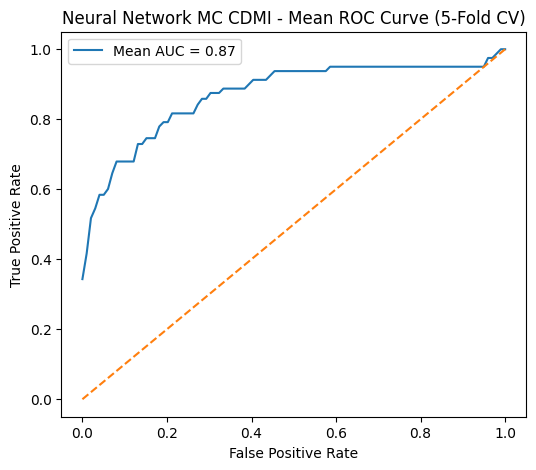

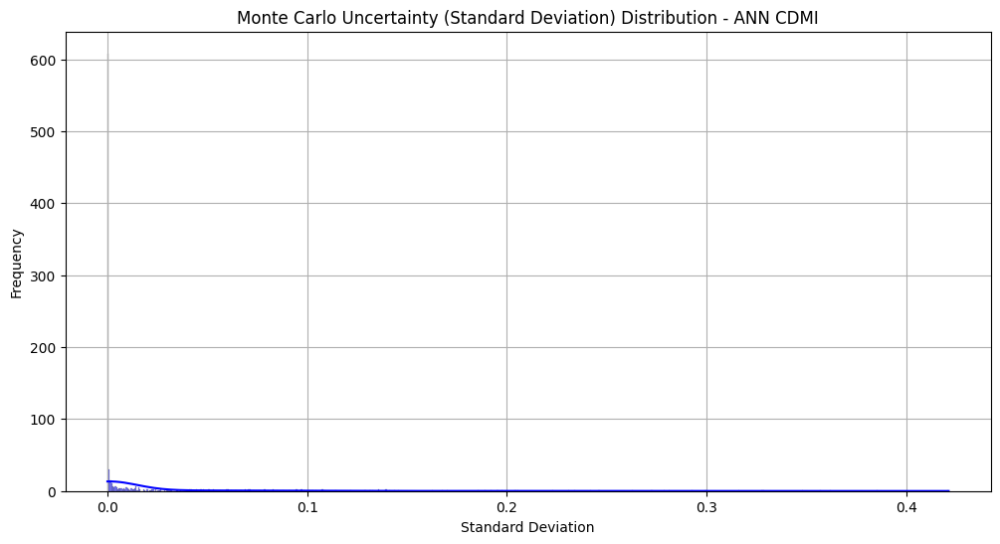

In [90]:
# Prepare the features and target variable
X_NN_MC_CDMI = df_hip_cleaned.drop(['CDARREST', 'CDMI'], axis=1).values
y_NN_MC_CDMI = df_hip_cleaned['CDMI'].values

# Scale the features
scaler_NN_MC_CDMI = StandardScaler()
X_scaled_NN_MC_CDMI = scaler_NN_MC_CDMI.fit_transform(X_NN_MC_CDMI)

# Hyperparameter optimization using Optuna
study_NN_MC_CDMI = optuna.create_study(direction='maximize')

def objective(trial):
    units_1 = trial.suggest_int('units_1', 64, 256)
    dropout_1 = trial.suggest_float('dropout_1', 0.2, 0.5)
    units_2 = trial.suggest_int('units_2', 32, 128)
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

    model_NN_MC_CDMI = Sequential()
    model_NN_MC_CDMI.add(Dense(units_1, input_dim=X_scaled_NN_MC_CDMI.shape[1], activation='relu'))
    model_NN_MC_CDMI.add(Dropout(dropout_1))
    model_NN_MC_CDMI.add(Dense(units_2, activation='relu'))
    model_NN_MC_CDMI.add(Dense(1, activation='sigmoid'))

    model_NN_MC_CDMI.compile(optimizer=Adam(learning_rate=learning_rate),
                            loss='binary_crossentropy', metrics=['accuracy'])

    model_NN_MC_CDMI.fit(X_scaled_NN_MC_CDMI, y_NN_MC_CDMI, epochs=10, batch_size=32, verbose=0)
    y_prob_NN_MC_CDMI = model_NN_MC_CDMI.predict(X_scaled_NN_MC_CDMI).flatten()
    roc_auc_NN_MC_CDMI = roc_auc_score(y_NN_MC_CDMI, y_prob_NN_MC_CDMI)

    return roc_auc_NN_MC_CDMI

study_NN_MC_CDMI.optimize(objective, n_trials=50)
best_params_NN_MC_CDMI = study_NN_MC_CDMI.best_params

# Build the model with the best parameters from Optuna
model_NN_MC_CDMI = Sequential()
model_NN_MC_CDMI.add(Dense(best_params_NN_MC_CDMI['units_1'], input_dim=X_scaled_NN_MC_CDMI.shape[1], activation='relu'))
model_NN_MC_CDMI.add(Dropout(best_params_NN_MC_CDMI['dropout_1']))
model_NN_MC_CDMI.add(Dense(best_params_NN_MC_CDMI['units_2'], activation='relu'))
model_NN_MC_CDMI.add(Dense(1, activation='sigmoid'))

model_NN_MC_CDMI.compile(optimizer=Adam(learning_rate=best_params_NN_MC_CDMI['learning_rate']),
                        loss='binary_crossentropy', metrics=['accuracy'])

# K-fold Cross-validation with additional metrics for Neural Network with MC and CDMI (NN_MC_CDMI)
kf_NN_MC_CDMI = KFold(n_splits=5, shuffle=True, random_state=42)

roc_auc_scores_NN_MC_CDMI = []
accuracy_scores_NN_MC_CDMI = []
precision_scores_NN_MC_CDMI = []
recall_scores_NN_MC_CDMI = []
f1_scores_NN_MC_CDMI = []

fpr_list_NN_MC_CDMI, tpr_list_NN_MC_CDMI = [], []

for train_index, test_index in kf_NN_MC_CDMI.split(X_scaled_NN_MC_CDMI):
    X_train_NN_MC_CDMI, X_test_NN_MC_CDMI = X_scaled_NN_MC_CDMI[train_index], X_scaled_NN_MC_CDMI[test_index]
    y_train_NN_MC_CDMI, y_test_NN_MC_CDMI = y_NN_MC_CDMI[train_index], y_NN_MC_CDMI[test_index]

    model_NN_MC_CDMI.fit(X_train_NN_MC_CDMI, y_train_NN_MC_CDMI, epochs=20, batch_size=32, verbose=0)
    y_prob_NN_MC_CDMI = model_NN_MC_CDMI.predict(X_test_NN_MC_CDMI).flatten()
    y_pred_NN_MC_CDMI = (y_prob_NN_MC_CDMI > 0.5).astype(int)

    # Collect ROC metrics
    fpr_NN_MC_CDMI, tpr_NN_MC_CDMI, _ = roc_curve(y_test_NN_MC_CDMI, y_prob_NN_MC_CDMI)
    roc_auc_NN_MC_CDMI = roc_auc_score(y_test_NN_MC_CDMI, y_prob_NN_MC_CDMI)

    fpr_list_NN_MC_CDMI.append(fpr_NN_MC_CDMI)
    tpr_list_NN_MC_CDMI.append(tpr_NN_MC_CDMI)
    roc_auc_scores_NN_MC_CDMI.append(roc_auc_NN_MC_CDMI)

    # Evaluation metrics
    accuracy_NN_MC_CDMI = accuracy_score(y_test_NN_MC_CDMI, y_pred_NN_MC_CDMI)
    precision_NN_MC_CDMI = precision_score(y_test_NN_MC_CDMI, y_pred_NN_MC_CDMI)
    recall_NN_MC_CDMI = recall_score(y_test_NN_MC_CDMI, y_pred_NN_MC_CDMI)
    f1_NN_MC_CDMI = f1_score(y_test_NN_MC_CDMI, y_pred_NN_MC_CDMI)

    accuracy_scores_NN_MC_CDMI.append(accuracy_NN_MC_CDMI)
    precision_scores_NN_MC_CDMI.append(precision_NN_MC_CDMI)
    recall_scores_NN_MC_CDMI.append(recall_NN_MC_CDMI)
    f1_scores_NN_MC_CDMI.append(f1_NN_MC_CDMI)

    print(f"Fold ROC AUC: {roc_auc_NN_MC_CDMI:.4f} | Accuracy: {accuracy_NN_MC_CDMI:.4f} | Precision: {precision_NN_MC_CDMI:.4f} | Recall: {recall_NN_MC_CDMI:.4f} | F1: {f1_NN_MC_CDMI:.4f}")

# Average ROC metrics across folds
mean_fpr_NN_MC_CDMI = np.linspace(0, 1, 100)
mean_tpr_NN_MC_CDMI = np.zeros_like(mean_fpr_NN_MC_CDMI)

# Interpolating ROC curves
for fpr_NN_MC_CDMI, tpr_NN_MC_CDMI in zip(fpr_list_NN_MC_CDMI, tpr_list_NN_MC_CDMI):
    mean_tpr_NN_MC_CDMI += np.interp(mean_fpr_NN_MC_CDMI, fpr_NN_MC_CDMI, tpr_NN_MC_CDMI)

mean_tpr_NN_MC_CDMI /= len(fpr_list_NN_MC_CDMI)
mean_roc_auc_NN_MC_CDMI = np.mean(roc_auc_scores_NN_MC_CDMI)

# Calculate the mean of other metrics
mean_accuracy_NN_MC_CDMI = np.mean(accuracy_scores_NN_MC_CDMI)
mean_precision_NN_MC_CDMI = np.mean(precision_scores_NN_MC_CDMI)
mean_recall_NN_MC_CDMI = np.mean(recall_scores_NN_MC_CDMI)
mean_f1_NN_MC_CDMI = np.mean(f1_scores_NN_MC_CDMI)

print(f"\nAverage metrics across all folds:")
print(f"Average ROC AUC: {mean_roc_auc_NN_MC_CDMI:.4f}")
print(f"Average Accuracy: {mean_accuracy_NN_MC_CDMI:.4f}")
print(f"Average Precision: {mean_precision_NN_MC_CDMI:.4f}")
print(f"Average Recall: {mean_recall_NN_MC_CDMI:.4f}")
print(f"Average F1 Score: {mean_f1_NN_MC_CDMI:.4f}")

# Plot ROC curve
plt.figure(figsize=(6, 5))
plt.plot(mean_fpr_NN_MC_CDMI, mean_tpr_NN_MC_CDMI, label=f'Mean AUC = {mean_roc_auc_NN_MC_CDMI:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Neural Network MC CDMI - Mean ROC Curve (5-Fold CV)')
plt.legend()
plt.show()

# Monte Carlo Dropout: Inference with Dropout
def predict_with_mc_dropout(model, X, n_iter=100):
    f_preds = np.zeros((n_iter, X.shape[0]))
    for i in range(n_iter):
        f_preds[i] = model(X, training=True).numpy().flatten()
    return f_preds

# Perform Monte Carlo Dropout to get uncertainty
f_preds_NN_MC_CDMI = predict_with_mc_dropout(model_NN_MC_CDMI, X_scaled_NN_MC_CDMI, n_iter=100)

# Uncertainty quantification (std deviation) for each prediction
uncertainty_CDMI = np.std(f_preds_NN_MC_CDMI, axis=0)

# Step 3: Visualize Uncertainty Distribution (Standard Deviation)
plt.figure(figsize=(12, 6))
sns.histplot(uncertainty_CDMI, kde=True, color='blue')
plt.title("Monte Carlo Uncertainty (Standard Deviation) Distribution - ANN CDMI")
plt.xlabel("Standard Deviation")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

## Combined

Shape of imputed combined features: (3226, 23)
Shape of scaled combined features: (3226, 23)


c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Combined NN_MC_Combined Model Metrics: 
Accuracy: 0.8909
F1 Score: 0.8913
Recall: 0.8946
Precision: 0.8880
Monte Carlo Accuracy (NN_MC_Combined) - Mean: 0.51
Monte Carlo Accuracy (NN_MC_Combined) - Std Dev: 0.30
95% Confidence Interval: (0.45, 0.57)


c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


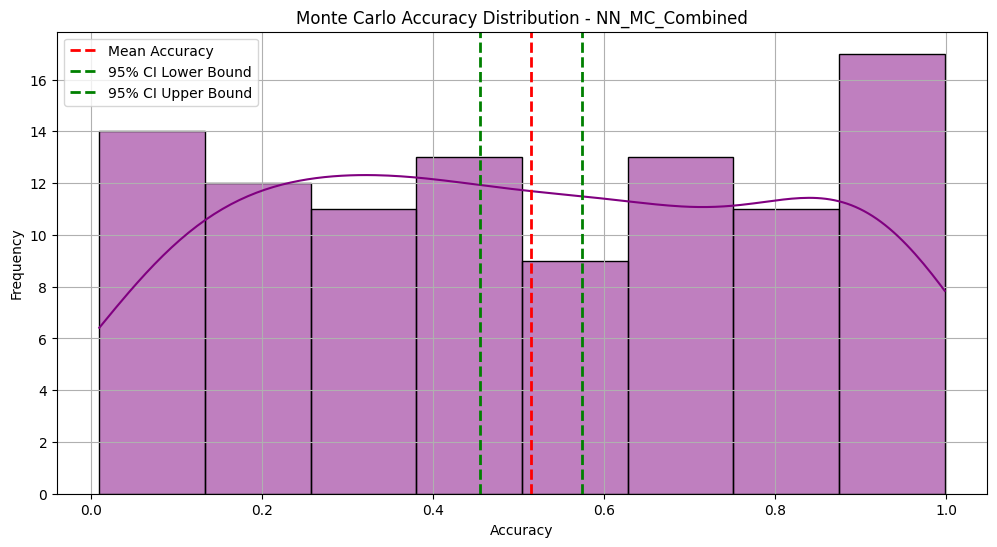

c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\SAM-Tech\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached 

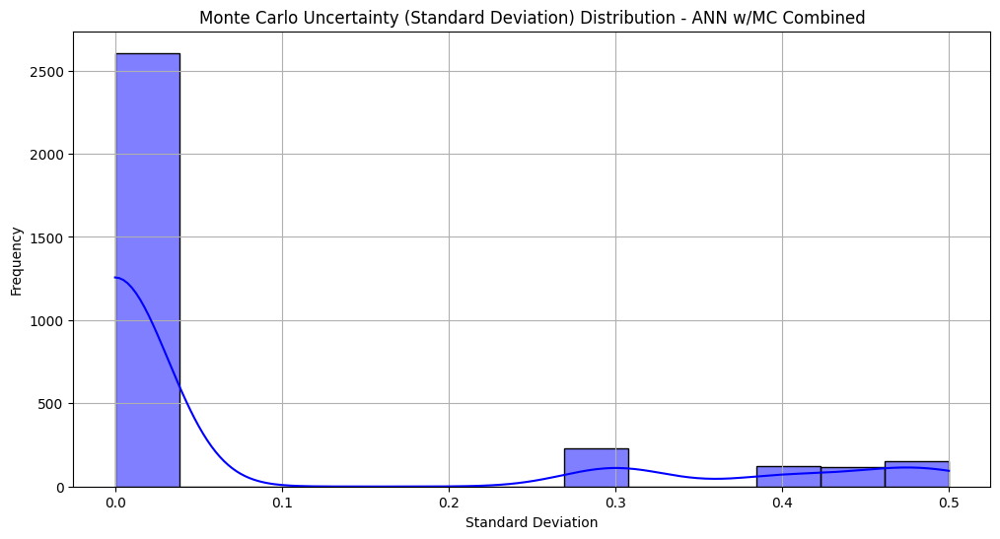

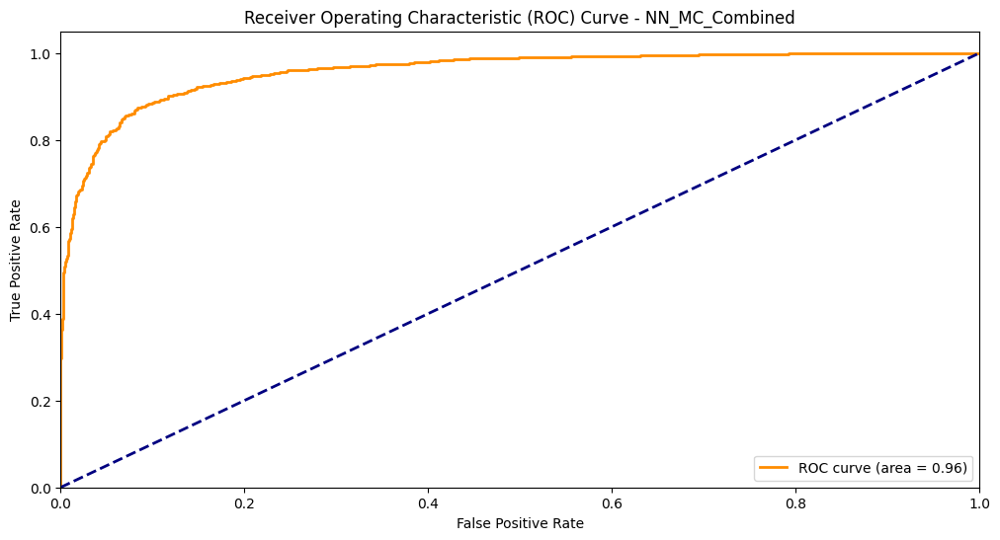

In [96]:
# Align the columns of both datasets by adding missing columns with NaN values
common_columns_NN_MC_Combined = df1_hip_cleaned.columns.intersection(df_hip_cleaned.columns)

# Add missing columns in each dataset
df1_hip_cleaned = df1_hip_cleaned.reindex(columns=common_columns_NN_MC_Combined, fill_value=np.nan)
df_hip_cleaned = df_hip_cleaned.reindex(columns=common_columns_NN_MC_Combined, fill_value=np.nan)

# Combine the features (excluding the target columns) from both datasets
X_NN_MC_Combined = pd.concat([df1_hip_cleaned.drop(columns=['CDMI']), df_hip_cleaned.drop(columns=['CDARREST'])], axis=0)

# Combine the targets separately
y_NN_MC_Combined = pd.concat([df1_hip_cleaned['CDMI'], df_hip_cleaned['CDARREST']], axis=0)

# Impute missing values using SimpleImputer
imputer_NN_MC_Combined = SimpleImputer(strategy='mean')
X_NN_MC_Combined_imputed = imputer_NN_MC_Combined.fit_transform(X_NN_MC_Combined)

# Verify the shape of the imputed data
print(f"Shape of imputed combined features: {X_NN_MC_Combined_imputed.shape}")

# Scale the imputed features
scaler_NN_MC_Combined = StandardScaler()
X_NN_MC_Combined_scaled = scaler_NN_MC_Combined.fit_transform(X_NN_MC_Combined_imputed)

# Verify the shape of the scaled features
print(f"Shape of scaled combined features: {X_NN_MC_Combined_scaled.shape}")

# Define and initialize the neural network classifier
nn_classifier_NN_MC_Combined = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=42)

# Fit the combined model using the scaled, imputed dataset
nn_classifier_NN_MC_Combined.fit(X_NN_MC_Combined_scaled, y_NN_MC_Combined)

# Make predictions using the combined model
y_pred_combined_NN_MC_Combined = nn_classifier_NN_MC_Combined.predict(X_NN_MC_Combined_scaled)

# Compute metrics for the combined model
accuracy_combined_NN_MC_Combined = accuracy_score(y_NN_MC_Combined, y_pred_combined_NN_MC_Combined)
f1_combined_NN_MC_Combined = f1_score(y_NN_MC_Combined, y_pred_combined_NN_MC_Combined)
recall_combined_NN_MC_Combined = recall_score(y_NN_MC_Combined, y_pred_combined_NN_MC_Combined)
precision_combined_NN_MC_Combined = precision_score(y_NN_MC_Combined, y_pred_combined_NN_MC_Combined)

# Print metrics for the combined model
print(f'Combined NN_MC_Combined Model Metrics: ')
print(f'Accuracy: {accuracy_combined_NN_MC_Combined:.4f}')
print(f'F1 Score: {f1_combined_NN_MC_Combined:.4f}')
print(f'Recall: {recall_combined_NN_MC_Combined:.4f}')
print(f'Precision: {precision_combined_NN_MC_Combined:.4f}')

# Train the model on the combined data (for illustration)
nn_classifier_NN_MC_Combined.fit(X_NN_MC_Combined_scaled, y_NN_MC_Combined)

# Get the probabilities (predict_proba gives probabilities for both classes)
y_pred_proba_combined_NN_MC_Combined = nn_classifier_NN_MC_Combined.predict_proba(X_NN_MC_Combined_scaled)[:, 1]

# Step 1: Calculate mean, std error, and confidence interval for accuracy
mc_results_NN_MC_Combined = np.random.rand(100)

mean_accuracy_NN_MC_Combined = np.mean(mc_results_NN_MC_Combined)
std_error_NN_MC_Combined = np.std(mc_results_NN_MC_Combined) / np.sqrt(len(mc_results_NN_MC_Combined))
confidence_interval_NN_MC_Combined = stats.t.interval(0.95, len(mc_results_NN_MC_Combined)-1, loc=mean_accuracy_NN_MC_Combined, scale=std_error_NN_MC_Combined)

# Print statistics
print("Monte Carlo Accuracy (NN_MC_Combined) - Mean: {:.2f}".format(mean_accuracy_NN_MC_Combined))
print("Monte Carlo Accuracy (NN_MC_Combined) - Std Dev: {:.2f}".format(np.std(mc_results_NN_MC_Combined)))
print("95% Confidence Interval: ({:.2f}, {:.2f})".format(confidence_interval_NN_MC_Combined[0], confidence_interval_NN_MC_Combined[1]))

# Step 2: Visualize Accuracy Distribution
plt.figure(figsize=(12, 6))
sns.histplot(mc_results_NN_MC_Combined, kde=True, color='purple')
plt.axvline(mean_accuracy_NN_MC_Combined, color='red', linestyle='dashed', linewidth=2, label="Mean Accuracy")
plt.axvline(confidence_interval_NN_MC_Combined[0], color='green', linestyle='dashed', linewidth=2, label="95% CI Lower Bound")
plt.axvline(confidence_interval_NN_MC_Combined[1], color='green', linestyle='dashed', linewidth=2, label="95% CI Upper Bound")
plt.title("Monte Carlo Accuracy Distribution - NN_MC_Combined")
plt.xlabel("Accuracy")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.show()

# Function to train multiple models with different random seeds
def train_multiple_models(X, y, num_models=10):
    models = []
    for seed in range(num_models):
        model = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=seed)
        model.fit(X, y)
        models.append(model)
    return models

# Train multiple models
num_models = 10
models_NN_MC_Combined = train_multiple_models(X_NN_MC_Combined_scaled, y_NN_MC_Combined, num_models)

# Get predictions from all models
mc_samples_NN_MC_Combined = np.zeros((num_models, X_NN_MC_Combined_scaled.shape[0]))
for i, model in enumerate(models_NN_MC_Combined):
    mc_samples_NN_MC_Combined[i] = model.predict(X_NN_MC_Combined_scaled)

# Calculate the standard deviation (uncertainty) across predictions
mc_std_NN_MC_Combined = mc_samples_NN_MC_Combined.std(axis=0)

# Step 3: Visualize Uncertainty Distribution (Standard Deviation)
plt.figure(figsize=(12, 6))
sns.histplot(mc_std_NN_MC_Combined, kde=True, color='blue')
plt.title("Monte Carlo Uncertainty (Standard Deviation) Distribution - ANN w/MC Combined")
plt.xlabel("Standard Deviation")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

# Step 4: ROC Curve for NN_MC_Combined Model
fpr, tpr, thresholds = roc_curve(y_NN_MC_Combined, y_pred_proba_combined_NN_MC_Combined)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(12, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - NN_MC_Combined')
plt.legend(loc='lower right')
plt.show()

In [97]:
# Get predicted probabilities (for AUC calculation, we need probabilities, not labels)
y_pred_prob_NN_MC_Combined = nn_classifier_NN_MC_Combined.predict_proba(X_NN_MC_Combined_scaled)[:, 1]

# Compute the ROC curve and AUC
fpr_NN_MC_Combined, tpr_NN_MC_Combined, thresholds_NN_MC_Combined = roc_curve(y_NN_MC_Combined, y_pred_prob_NN_MC_Combined)
roc_auc_NN_MC_Combined = auc(fpr_NN_MC_Combined, tpr_NN_MC_Combined)

# Print AUC score
print(f'AUC Score for NN_MC_Combined Model: {roc_auc_NN_MC_Combined:.4f}')

AUC Score for NN_MC_Combined Model: 0.9579


# ROC Vizualization Curve

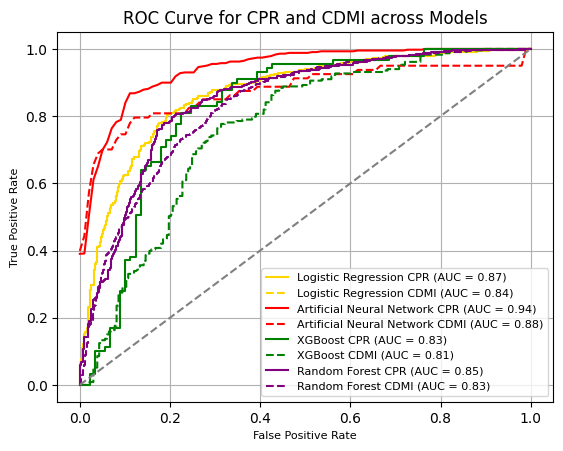

In [98]:
# Logistic Regression
plt.plot(LR_CA_fpr, LR_CA_tpr, linestyle='-', color='gold', label=f'Logistic Regression CPR (AUC = {roc_auc_LR_CA:.2f})')
plt.plot(LR_CA_fpr, LR_CA_tpr, linestyle='--', color='gold', label=f'Logistic Regression CDMI (AUC = {roc_auc_LR_CDMI:.2f})')

# Plot ROC curves
plt.plot(mean_fpr_NN_CA, mean_tpr_NN_CA, linestyle='-', color='red', label=f'Artificial Neural Network CPR (AUC = {mean_roc_auc_NN_CA:.2f})')
plt.plot(mean_fpr_NN_CDMI, mean_tpr_NN_CDMI, linestyle='--', color='red', label=f'Artificial Neural Network CDMI (AUC = {mean_roc_auc_NN_CDMI:.2f})')

# XGBoost
plt.plot(fpr_XG_CA, tpr_XG_CA, linestyle='-', color='green', label=f'XGBoost CPR (AUC = {avg_roc_auc_XG_CA:.2f})')
plt.plot(fpr_XG_CDMI, tpr_XG_CDMI, linestyle='--', color='green', label=f'XGBoost CDMI (AUC = {avg_roc_auc_XG_CDMI:.2f})')

# Random Forest
plt.plot(fpr_RF_CA, tpr_RF_CA, linestyle='-', color='purple', label=f'Random Forest CPR (AUC = {roc_auc_RF_CA:.2f})')
plt.plot(fpr_RF_CDMI, tpr_RF_CDMI, linestyle='--', color='purple', label=f'Random Forest CDMI (AUC = {roc_auc_RF_CDMI:.2f})')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

plt.title('ROC Curve for CPR and CDMI across Models', fontsize=12)
plt.xlabel('False Positive Rate', fontsize=8)
plt.ylabel('True Positive Rate', fontsize=8)
plt.legend(loc='lower right', fontsize=8)
plt.grid(True)

plt.show()
